<a href="https://colab.research.google.com/github/abdallah197/COVID-19-Diet/blob/rumel/FinalEDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Import Library
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt

import numpy as np
from pandas.api.types import CategoricalDtype
from plotnine import *
import plotnine as p9
from plotnine.data import mpg
import matplotlib.colors as colors
%matplotlib inline
import seaborn as sns
sns.set(style="ticks", color_codes=True)

import warnings
import matplotlib.cbook
warnings.filterwarnings("ignore",category=matplotlib.cbook.mplDeprecation)

In [ ]:
#Import Datasets

path_kg = "Food_Supply_Quantity_kg_Data.csv"
path_kcal = "Food_Supply_kcal_Data.csv"
path_fat = "Fat_Supply_Quantity_Data.csv"
path_protein = "Protein_Supply_Quantity_Data.csv"
df_kg = pd.read_csv(path_kg)
df_kcal = pd.read_csv(path_kcal)
df_fat = pd.read_csv(path_fat)
df_protein = pd.read_csv(path_protein)

In [ ]:
#Inspecting dataset

df_kg.head()

,Country,Alcoholic Beverages,Animal fats,Animal Products,"Aquatic Products, Other",Cereals - Excluding Beer,Eggs,"Fish, Seafood",Fruits - Excluding Wine,Meat,Milk - Excluding Butter,Miscellaneous,Offals,Oilcrops,Pulses,Spices,Starchy Roots,Stimulants,Sugar & Sweeteners,Sugar Crops,Treenuts,Vegetable Oils,Vegetables,Vegetal Products,Obesity,Undernourished,Confirmed,Deaths,Recovered,Active,Population,Unit (all except Population)
0,Afghanistan,0.0014,0.1973,9.4341,0.0,24.8097,0.2099,0.0350,5.3495,1.2020,7.5828,0.0728,0.2057,0.0700,0.2953,0.0574,0.8802,0.3078,1.3489,0.0,0.0770,0.5345,6.7642,40.5645,4.5,29.8,0.081402,0.001895,0.033132,0.046375,38042000.0,%
1,Albania,1.6719,0.1357,18.7684,0.0,5.7817,0.5815,0.2126,6.7861,1.8845,15.7213,0.1123,0.2324,0.9377,0.2380,0.0008,1.8096,0.1055,1.5367,0.0,0.1515,0.3261,11.7753,31.2304,22.3,6.2,0.084045,0.001924,0.048425,0.033695,2858000.0,%
2,Algeria,0.2711,0.0282,9.6334,0.0,13.6816,0.5277,0.2416,6.3801,1.1305,7.6189,0.1671,0.0870,0.3493,0.4783,0.0557,4.1340,0.2216,1.8342,0.0,0.1152,1.0310,11.6484,40.3651,26.6,3.9,0.030579,0.002067,0.021589,0.006923,43406000.0,%
3,Angola,5.8087,0.0560,4.9278,0.0,9.1085,0.0587,1.7707,6.0005,2.0571,0.8311,0.1165,0.1550,0.4186,0.6507,0.0009,18.1102,0.0508,1.8495,0.0,0.0061,0.6463,2.3041,45.0722,6.8,25,0.000850,0.000035,0.000258,0.000557,31427000.0,%
4,Antigua and Barbuda,3.5764,0.0087,16.6613,0.0,5.9960,0.2274,4.1489,10.7451,5.6888,6.3663,0.7139,0.2219,0.2172,0.1840,0.1524,1.4522,0.1564,3.8749,0.0,0.0253,0.8102,5.4495,33.3233,19.1,NaN,0.071134,0.003093,0.022680,0.045361,97000.0,%


In [ ]:
#Print the columns of Datasets

for col in df_kg.columns: 
    print(col) 

Country
Alcoholic Beverages
Animal fats
Animal Products
Aquatic Products, Other
Cereals - Excluding Beer
Eggs
Fish, Seafood
Fruits - Excluding Wine
Meat
Milk - Excluding Butter
Miscellaneous
Offals
Oilcrops
Pulses
Spices
Starchy Roots
Stimulants
Sugar & Sweeteners
Sugar Crops
Treenuts
Vegetable Oils
Vegetables
Vegetal Products
Obesity
Undernourished
Confirmed
Deaths
Recovered
Active
Population
Unit (all except Population)


In [ ]:
# Making sure that all the 4 datasets have the same arrangement of columns

column_list = ['Country', 'Alcoholic Beverages', 'Animal fats', 'Animal Products', 'Aquatic Products, Other', 'Cereals - Excluding Beer', 'Eggs', 'Fish, Seafood', 'Fruits - Excluding Wine', 'Meat', 'Milk - Excluding Butter', 'Miscellaneous', 'Offals', 'Oilcrops', 'Pulses', 'Spices', 'Starchy Roots', 'Stimulants', 'Sugar & Sweeteners', 'Sugar Crops', 'Treenuts', 'Vegetable Oils', 'Vegetables', 'Vegetal Products', 'Obesity', 'Undernourished', 'Confirmed', 'Deaths', 'Recovered', 'Active', 'Population', 'Unit (all except Population)']

df_kg = df_kg[column_list]

df_fat = df_fat[column_list]

df_kcal = df_kcal[column_list]

df_protein = df_protein[column_list]

In [ ]:
#Calculate recovery rate of each country

def prepare_rec_rate_and_total_confirmed(df):
    df['Rec_Rate'] = df[['Confirmed', 'Active', 'Recovered']].apply(lambda x: (x['Recovered']/(x['Confirmed']-x['Active']))*100, axis=1)
    df = df.sort_values(by=['Rec_Rate'], ascending=False)
    
    df['Total Confirmed'] = df[['Confirmed', 'Population']].apply(lambda row: (row['Confirmed']/100)*row['Population'], axis=1)
    
    return df

In [ ]:
# Calculate recovery rate for each datasets

df_kg = prepare_rec_rate_and_total_confirmed(df_kg)
df_kcal = prepare_rec_rate_and_total_confirmed(df_kcal)
df_fat = prepare_rec_rate_and_total_confirmed(df_fat)
df_protein = prepare_rec_rate_and_total_confirmed(df_protein)

In [ ]:
# Top ranked countries with highest recovery rate with cases more than 50000
 
df_kg['Country'].loc[df_kg['Total Confirmed']>= 125000].head(16)

133                  Saudi Arabia
126            Russian Federation
29                          Chile
154                        Turkey
11                     Bangladesh
140                  South Africa
117                      Pakistan
56                        Germany
68                          India
120                          Peru
70     Iran (Islamic Republic of)
20                         Brazil
100                        Mexico
74                          Italy
141                         Spain
161      United States of America
Name: Country, dtype: object

In [ ]:
#Prepare data for each country:

def prepare_data_for_each_country(country):
    
    df_kg_country = df_kg[df_kg["Country"] == country]
    df_kcal_country = df_kcal[df_kcal["Country"] == country]
    df_fat_country = df_fat[df_fat["Country"] == country]
    df_protein_country = df_protein[df_protein["Country"] == country]
    
    return df_kg_country, df_kcal_country, df_fat_country, df_protein_country

In [ ]:
# Prepare data for plotting for each country

def prepare_data_for_each_country_for_plotting(df_kg, df_kcal, df_fat, df_protein):

    
    df_column_names=list(df_kg)[1:24]
    df_kg_percentages=df_kg.iloc[:,1:24]
    df_kcal_percentages=df_kcal.iloc[:,1:24]
    df_fat_percentages=df_fat.iloc[:,1:24]
    df_protein_percentages=df_protein.iloc[:,1:24]
    
    return df_column_names, df_kg_percentages, df_kcal_percentages, df_fat_percentages, df_protein_percentages


In [ ]:
def get_data_for_two_countries(c1, c2):
    df_kg_filtered = df_kg[df_kg["Country"].isin([c1,c2])]
    df_kcal_filtered = df_kcal[df_kcal["Country"].isin([c1,c2])]
    df_fat_filtered = df_fat[df_fat["Country"].isin([c1,c2])]
    df_protein_filtered = df_protein[df_protein["Country"].isin([c1,c2])]

    df_kg_c1, df_kcal_c1, df_fat_c1, df_protein_c1 = prepare_data_for_each_country(c1)

    df_kg_c2, df_kcal_c2, df_fat_c2, df_protein_c2 = prepare_data_for_each_country(c2)

    df_c1_column_names, df_kg_c1_percentages, df_kcal_c1_percentages, df_fat_c1_percentages, df_protein_c1_percentages = prepare_data_for_each_country_for_plotting(df_kg_c1, df_kcal_c1, df_fat_c1, df_protein_c1)

    df_c2_column_names, df_kg_c2_percentages, df_kcal_c2_percentages, df_fat_c2_percentages, df_protein_c2_percentages = prepare_data_for_each_country_for_plotting(df_kg_c2, df_kcal_c2, df_fat_c2, df_protein_c2)

    return df_kg_filtered, df_kcal_filtered, df_fat_filtered,  df_protein_filtered, df_kg_c1, df_kcal_c1, df_fat_c1, df_protein_c1, df_kg_c2, df_kcal_c2, df_fat_c2, df_protein_c2, df_c1_column_names, df_kg_c1_percentages, df_kcal_c1_percentages, df_fat_c1_percentages, df_protein_c1_percentages, df_c2_column_names, df_kg_c2_percentages, df_kcal_c2_percentages, df_fat_c2_percentages, df_protein_c2_percentages


In [ ]:
#Define country names
c1 = "Saudi Arabia"
c2 = "India"
df_kg_filtered, df_kcal_filtered, df_fat_filtered,  df_protein_filtered, df_kg_c1, df_kcal_c1, df_fat_c1, df_protein_c1, df_kg_c2, df_kcal_c2, df_fat_c2, df_protein_c2, df_c1_column_names, df_kg_c1_percentages, df_kcal_c1_percentages, df_fat_c1_percentages, df_protein_c1_percentages, df_c2_column_names, df_kg_c2_percentages, df_kcal_c2_percentages, df_fat_c2_percentages, df_protein_c2_percentages = get_data_for_two_countries(c1, c2)

In [ ]:
#Configuration of plots

print(plt.rcParams.get('figure.figsize'))
fig_size = plt.rcParams["figure.figsize"]
fig_size[0] = 10
fig_size[1] = 10
plt.rcParams["figure.figsize"] = fig_size
plt.rcParams.update({'font.size': 12})

colors_list = list(colors._colors_full_map.values())
colors_list_filtered = colors_list[:23]

[6.0, 4.0]


In [ ]:
# For drawing Scattered plot

def draw_scatter_plot(df, title):

    return (ggplot(df)         # defining what data to use
     + aes(x='Country', y = 'Rec_Rate', color='Country')    # defining what variable to use
     + p9.geom_point(size = 7)
     + labs(title=title, x='Countries', y='Recovery Rate')
     + geom_text(aes(x="Country", y="Rec_Rate", label='Rec_Rate'),
                 nudge_y=2.7,
         stat='identity',
         format_string='{:.1f}% ')
    )

In [ ]:
# For drawing Pie chart plot:

def draw_pie_chart(df_percentages, df_column_names, title):
    
  
    explode = (0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05)

    #color
    from random import randint
    color = []
    n = 23
    for i in range(n):
        color.append('#%06X' % randint(0, 0xFFFFFF))

    plt.pie(df_percentages, labels=df_column_names, labeldistance=1.05, autopct='%1.1f%%', startangle=10, pctdistance=0.85, explode = explode, colors=colors_list_filtered)
    #draw circle
    centre_circle = plt.Circle((0,0),0.70,fc='white')
    fig = plt.gcf()
    fig.gca().add_artist(centre_circle)
    # Equal aspect ratio ensures that pie is drawn as a circle
    plt.axis('equal', radius=1200)
    plt.legend(df_column_names, title="Food Categories",
              loc="right", bbox_to_anchor=(1.5, 0.5))
    plt.title(title, pad=20, fontsize= 20)
    plt.figure(figsize=[30, 30])
    plt.tight_layout()
    plt.rcParams.update({'font.size': 12})
    fig_size = plt.rcParams["figure.figsize"]
    fig_size[0] = 8
    fig_size[1] = 8
    plt.rcParams["figure.figsize"] = fig_size
    plt.show()

In [ ]:
# For drawing Bar Chart plot:

def draw_bar_chart(df_percentages, df_column_names, title):

    df_percentages_list = df_percentages.values.tolist()
    df_percentages_list_flattened = list(np.concatenate(df_percentages_list).flat)
    
    demo = pd.DataFrame({"x-axis": df_column_names,
                         "y-axis": df_percentages_list_flattened})

    return ggplot(data=demo) +\
    geom_bar(mapping=aes(x="x-axis", y="y-axis", fill='x-axis'), stat="identity", size=20) +\
    coord_flip() +\
    labs(title=title, x='Food Categories', y='Percentages') +\
    geom_text(
         aes(x="x-axis", y="y-axis", label='y-axis'),
         stat='identity',
        # nudge_y=2.3,
         format_string='{:.1f}% '
    )

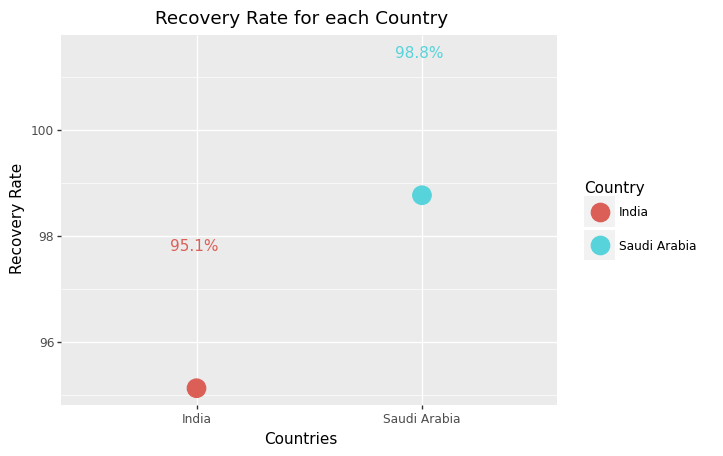

<ggplot: (-9223363243348799621)>

In [ ]:
# Drawing Scattered plots:
df_kg_filtered_scatter_plot = draw_scatter_plot(df_kg_filtered, "Recovery Rate for each Country")
df_kg_filtered_scatter_plot

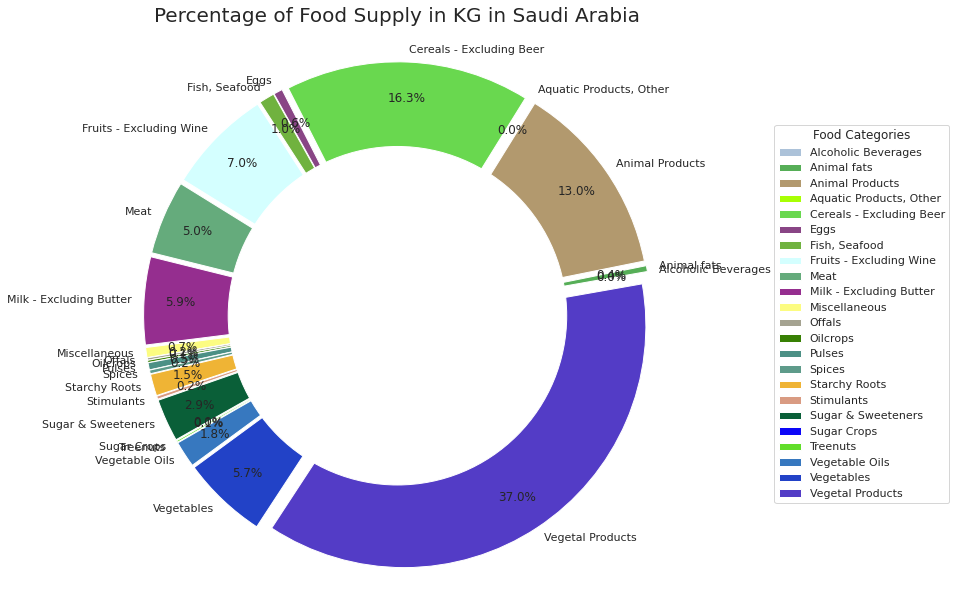

<Figure size 2160x2160 with 0 Axes>

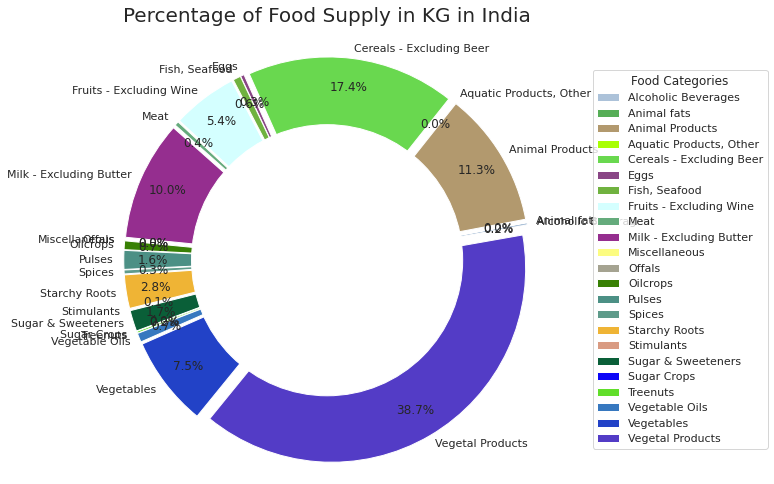

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_kg_c1_percentages_pie_chart = draw_pie_chart(df_kg_c1_percentages, df_c1_column_names, "Percentage of Food Supply in KG in "+c1)
df_kg_c2_percentages_pie_chart = draw_pie_chart(df_kg_c2_percentages, df_c2_column_names, "Percentage of Food Supply in KG in "+c2)

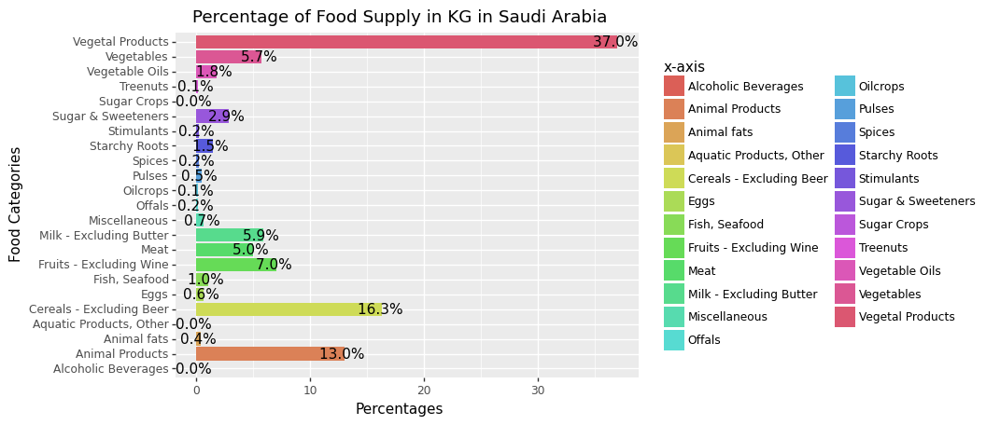

<ggplot: (-9223363243348795318)>


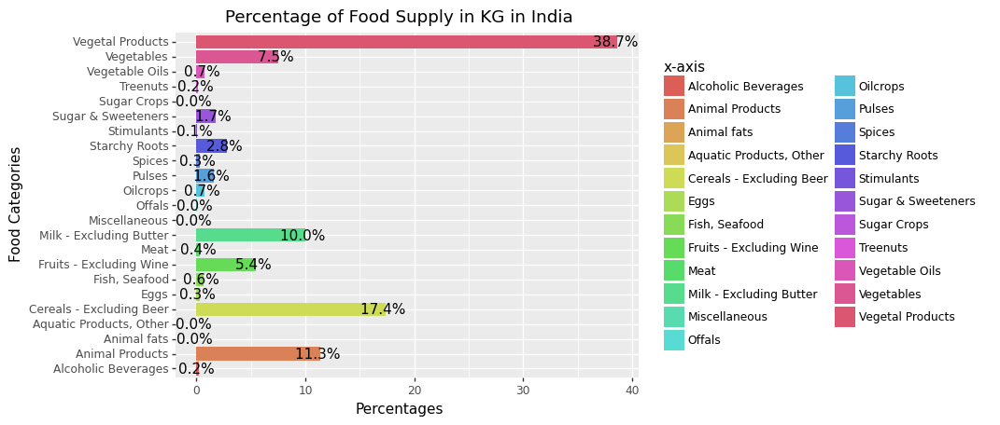

<ggplot: (-9223363243352055422)>


In [ ]:
df_kg_c1_percentages_bar_chart = draw_bar_chart(df_kg_c1_percentages, df_c1_column_names, "Percentage of Food Supply in KG in "+c1)
df_kg_c2_percentages_bar_chart = draw_bar_chart(df_kg_c2_percentages, df_c2_column_names, "Percentage of Food Supply in KG in "+c2)
print(df_kg_c1_percentages_bar_chart)
print(df_kg_c2_percentages_bar_chart)

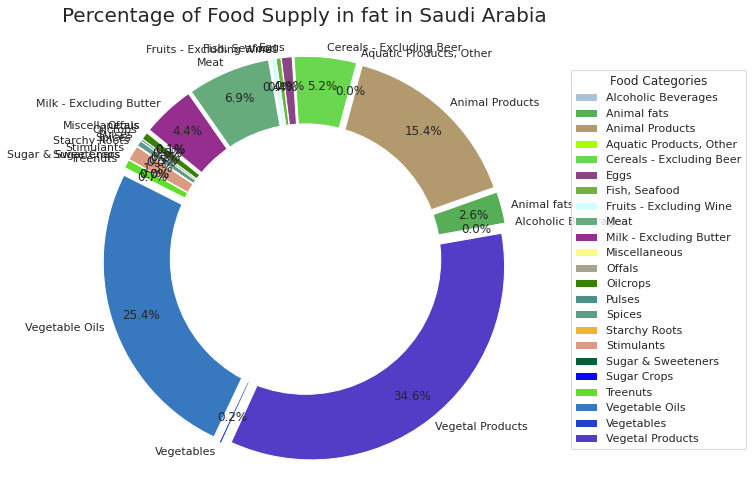

<Figure size 2160x2160 with 0 Axes>

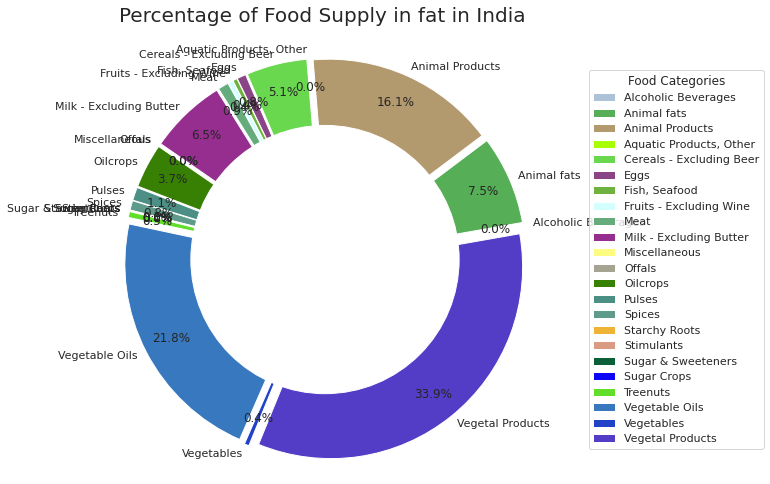

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_fat_c1_percentages_pie_chart = draw_pie_chart(df_fat_c1_percentages, df_c1_column_names, "Percentage of Food Supply in fat in "+c1)
df_fat_c2_percentages_pie_chart = draw_pie_chart(df_fat_c2_percentages, df_c2_column_names, "Percentage of Food Supply in fat in "+c2)

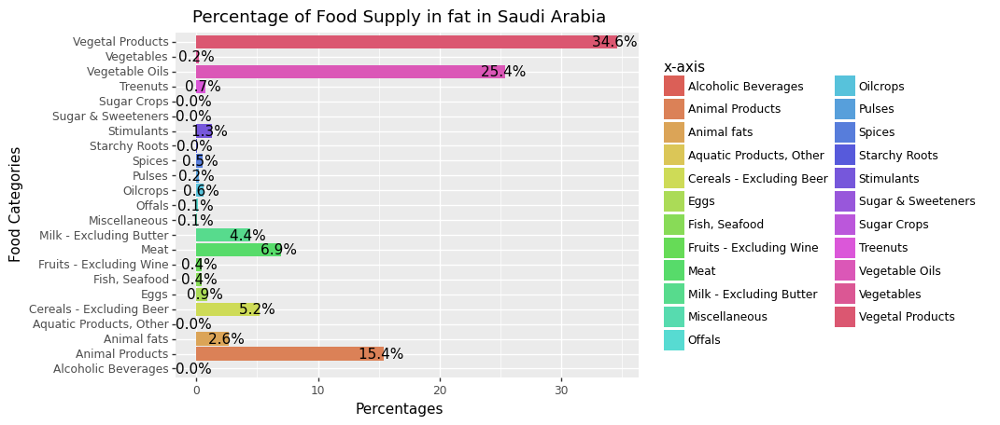

<ggplot: (8793499982663)>


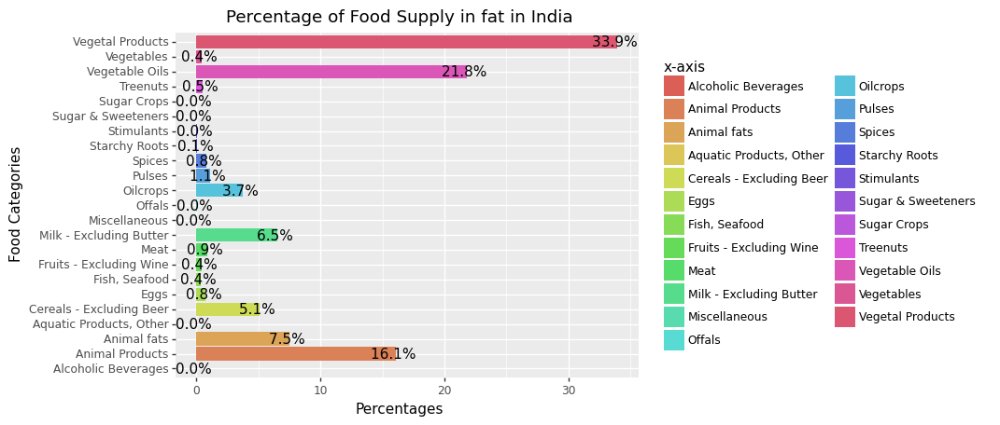

<ggplot: (8793499774882)>


In [ ]:
df_fat_c1_percentages_bar_chart = draw_bar_chart(df_fat_c1_percentages, df_c1_column_names, "Percentage of Food Supply in fat in "+c1)
df_fat_c2_percentages_bar_chart = draw_bar_chart(df_fat_c2_percentages, df_c2_column_names, "Percentage of Food Supply in fat in "+c2)
print(df_fat_c1_percentages_bar_chart)
print(df_fat_c2_percentages_bar_chart)

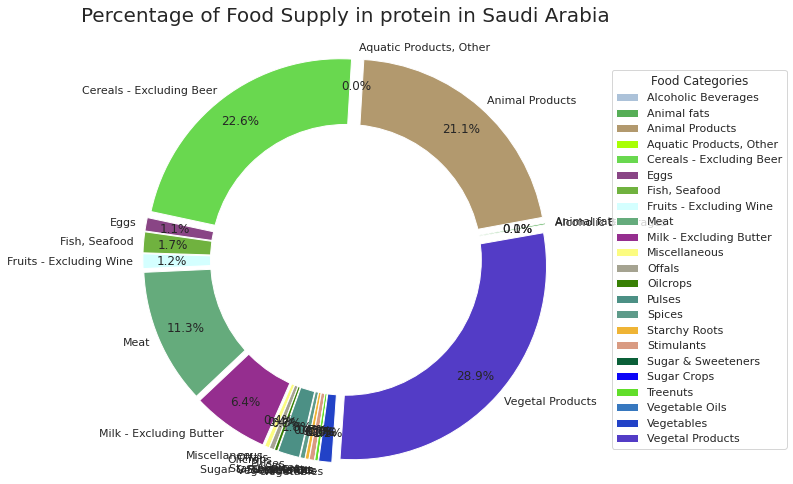

<Figure size 2160x2160 with 0 Axes>

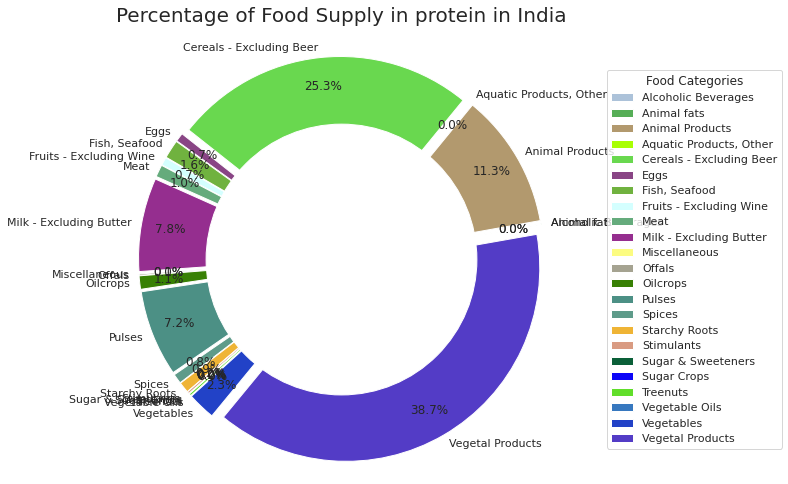

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_protein_c1_percentages_pie_chart = draw_pie_chart(df_protein_c1_percentages, df_c1_column_names, "Percentage of Food Supply in protein in "+c1)
df_protein_c2_percentages_pie_chart = draw_pie_chart(df_protein_c2_percentages, df_c2_column_names, "Percentage of Food Supply in protein in "+c2)

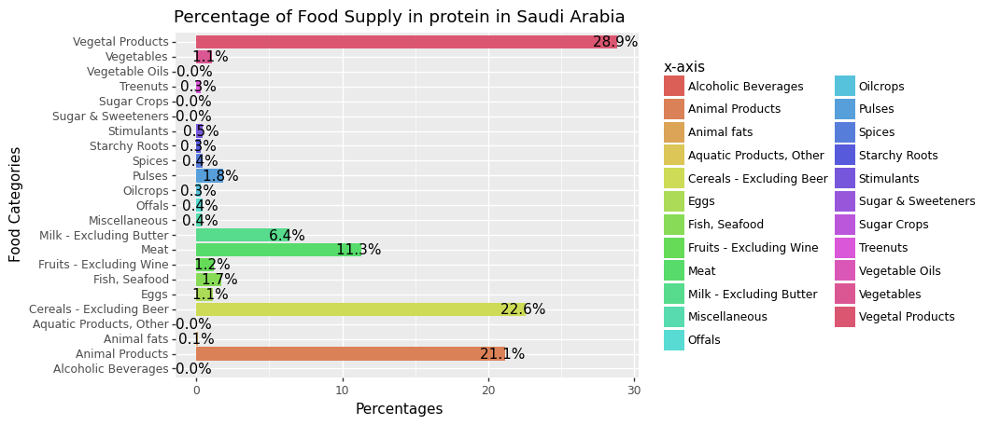

<ggplot: (8793499857714)>


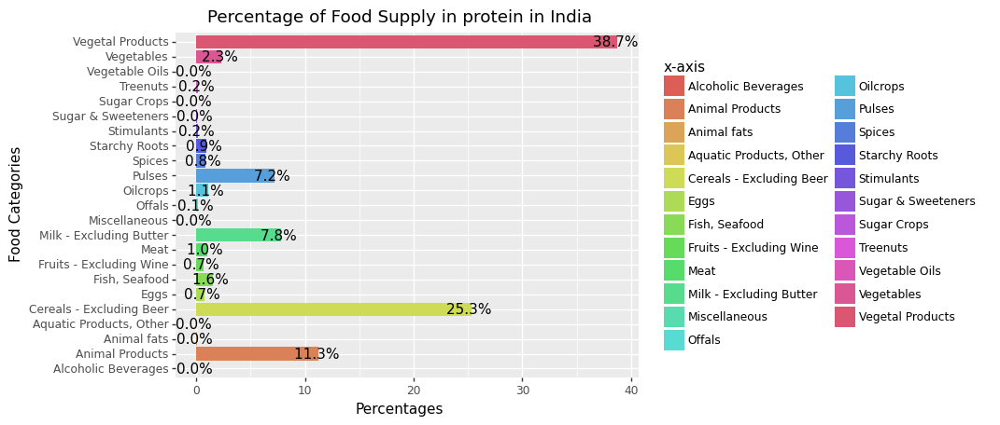

<ggplot: (8793499713663)>


In [ ]:
df_protein_c1_percentages_bar_chart = draw_bar_chart(df_protein_c1_percentages, df_c1_column_names, "Percentage of Food Supply in protein in "+c1)
df_protein_c2_percentages_bar_chart = draw_bar_chart(df_protein_c2_percentages, df_c2_column_names, "Percentage of Food Supply in protein in "+c2)
print(df_protein_c1_percentages_bar_chart)
print(df_protein_c2_percentages_bar_chart)

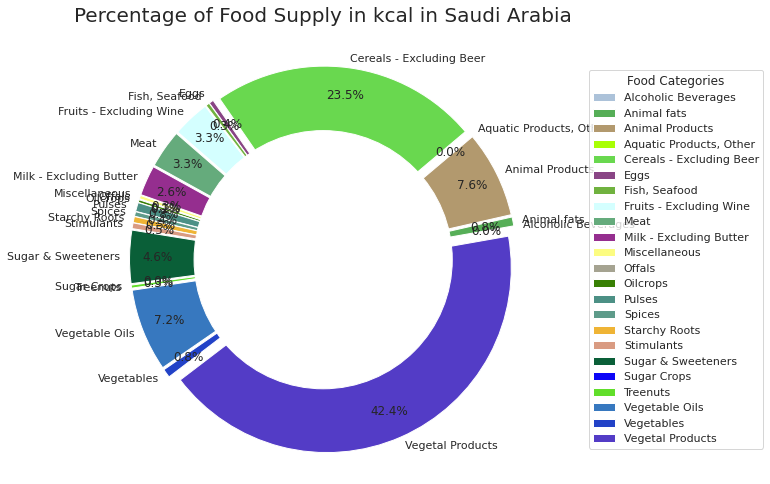

<Figure size 2160x2160 with 0 Axes>

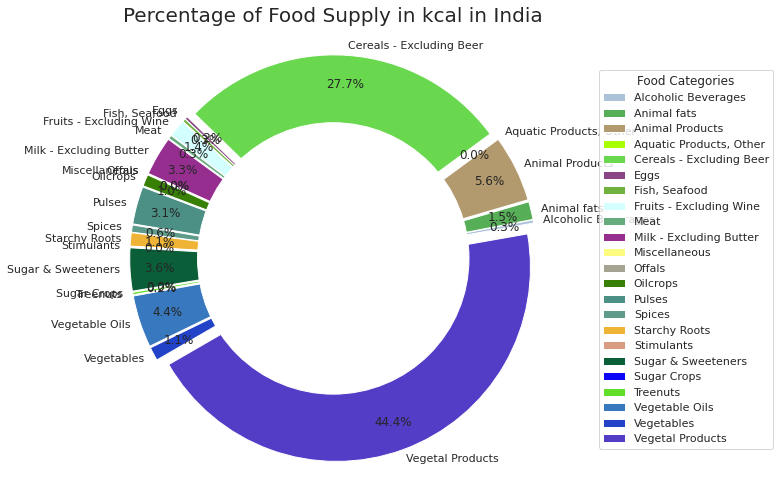

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_kcal_c1_percentages_pie_chart = draw_pie_chart(df_kcal_c1_percentages, df_c1_column_names, "Percentage of Food Supply in kcal in "+c1)
df_kcal_c2_percentages_pie_chart = draw_pie_chart(df_kcal_c2_percentages, df_c2_column_names, "Percentage of Food Supply in kcal in "+c2)

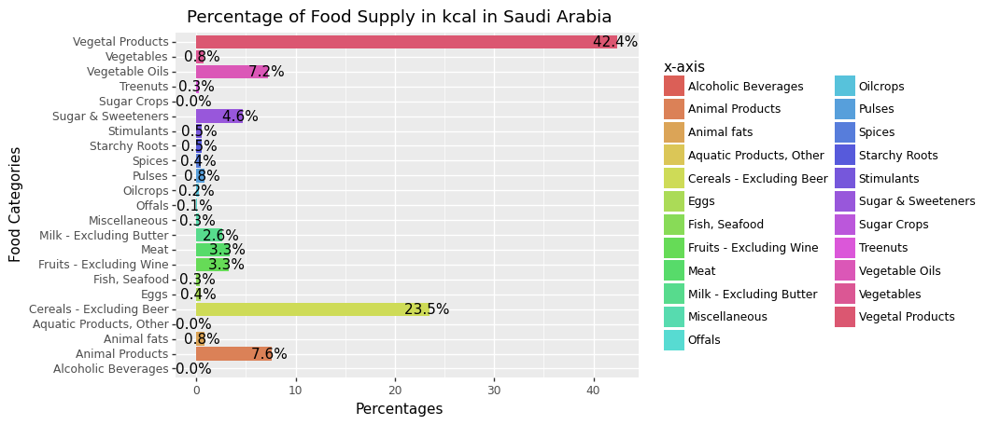

<ggplot: (-9223363243355148109)>


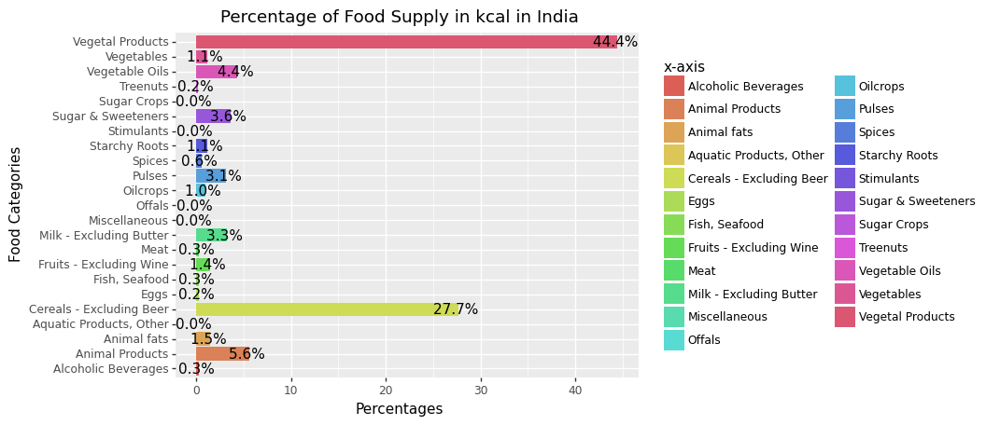

<ggplot: (8793502742364)>


In [ ]:
df_kcal_c1_percentages_bar_chart = draw_bar_chart(df_kcal_c1_percentages, df_c1_column_names, "Percentage of Food Supply in kcal in "+c1)
df_kcal_c2_percentages_bar_chart = draw_bar_chart(df_kcal_c2_percentages, df_c2_column_names, "Percentage of Food Supply in kcal in "+c2)
print(df_kcal_c1_percentages_bar_chart)
print(df_kcal_c2_percentages_bar_chart)

The following table will describe about the top 5 most consumption sources for 4 different dataset for the countries Saudi Arabia and India. It will also show the recovery rate of those countries.

<table style="border-collapse: collapse; border: 1px black solid;">
  <tbody>
   <tr style="border-collapse: collapse; border: 1px black solid;">
       <th>Country/Food Supply</th>
       <th>Food Supply in KG</th>
       <th>Food Supply in Fat</th>
       <th>Food Supply in Protein</th>
       <th>Food Supply in Kcal</th>
       <th>Recovery Rate</th>
   </tr>
    <tr style="border-collapse: collapse; border: 1px black solid;">
        <td>Saudi Arabia</td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Beer</li>
            <li>Animal Products</li>
            <li>Milk - Excluding Butter</li>
            <li>Vegetables</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Vegetable Oils</li>
            <li>Animal Products</li>
            <li>Fruits - Excluding Wine</li>
            <li>Cereals - Excluding Beer</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Beers</li>
            <li>Animal Products</li>
            <li>Meat</li>
            <li>Milk - Excluding Butter</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Beer</li>
            <li>Animal Products</li>
            <li>Vegetable Oils</li>
            <li>Sugar & Sweeteners</li>
        </ul>
        </td>
        <td>98.8%</td>
    </tr>
    <tr>
        <td>India</td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Beer</li>
            <li>Animal Products</li>
            <li>Milk - Excluding Butter</li>
            <li>Vegetables</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Vegetable Oils</li>
            <li>Animal Products</li>
            <li>Animal Fats</li>
            <li>Milk - Excluding Butter</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Butter</li>
            <li>Animal Products</li>
            <li>Milk - Excluding Butter</li>
            <li>Pulses</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Beer</li>
            <li>Animal Products</li>
            <li>Vegetable Oils</li>
            <li>Sugar & Sweeterners</li>
        </ul>
        </td>
        <td>95.1%</td>
    </tr>
  </tbody>
</table>

In [ ]:
c1 = "Russian Federation"
c2 = "Peru"
df_kg_filtered, df_kcal_filtered, df_fat_filtered,  df_protein_filtered, df_kg_c1, df_kcal_c1, df_fat_c1, df_protein_c1, df_kg_c2, df_kcal_c2, df_fat_c2, df_protein_c2, df_c1_column_names, df_kg_c1_percentages, df_kcal_c1_percentages, df_fat_c1_percentages, df_protein_c1_percentages, df_c2_column_names, df_kg_c2_percentages, df_kcal_c2_percentages, df_fat_c2_percentages, df_protein_c2_percentages = get_data_for_two_countries(c1, c2)

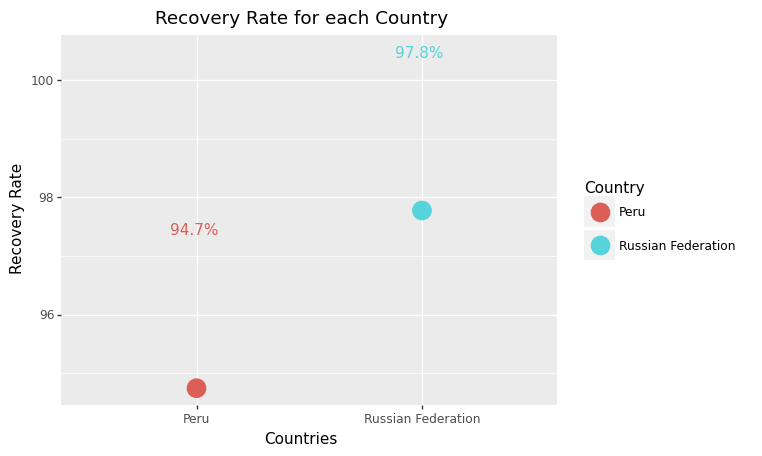

<ggplot: (-9223363243355296554)>

In [ ]:
df_kg_filtered_scatter_plot = draw_scatter_plot(df_kg_filtered, "Recovery Rate for each Country")
df_kg_filtered_scatter_plot

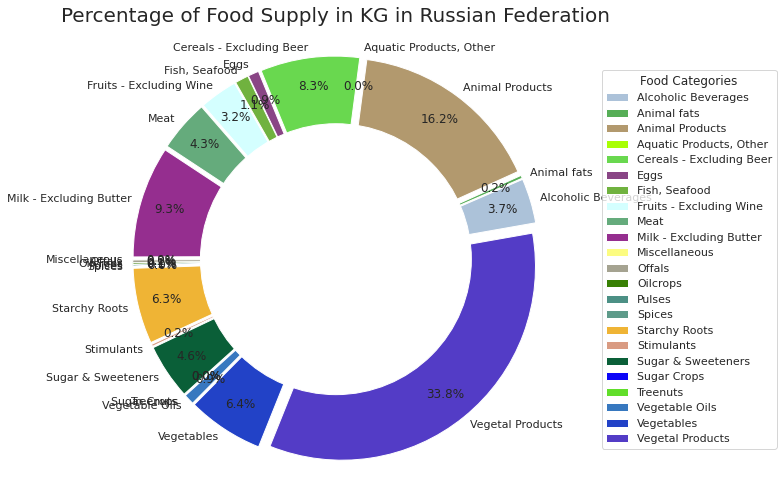

<Figure size 2160x2160 with 0 Axes>

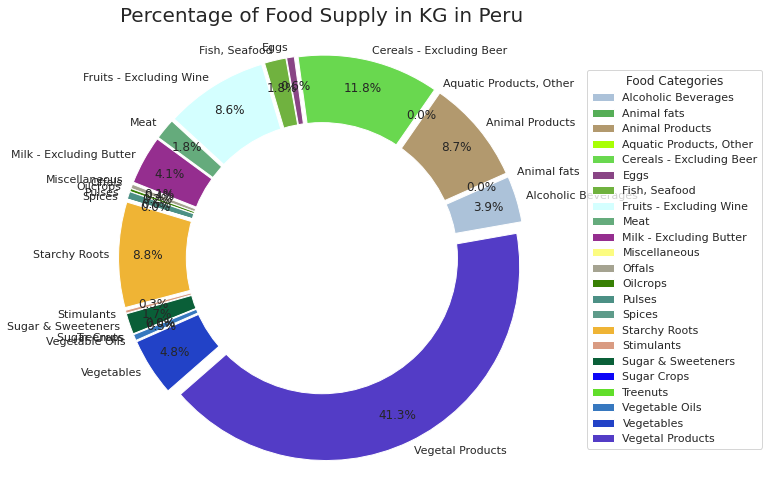

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_kg_c1_percentages_pie_chart = draw_pie_chart(df_kg_c1_percentages, df_c1_column_names, "Percentage of Food Supply in KG in "+c1)
df_kg_c2_percentages_pie_chart = draw_pie_chart(df_kg_c2_percentages, df_c2_column_names, "Percentage of Food Supply in KG in "+c2)

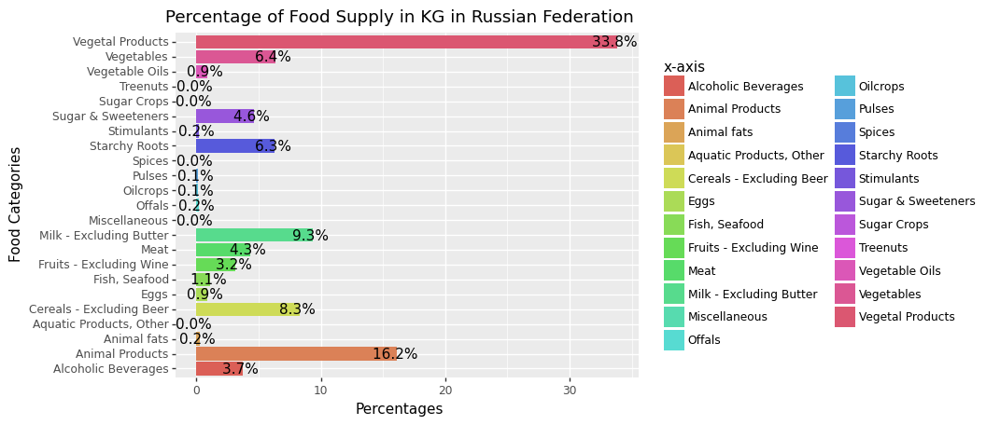

<ggplot: (8793500025257)>


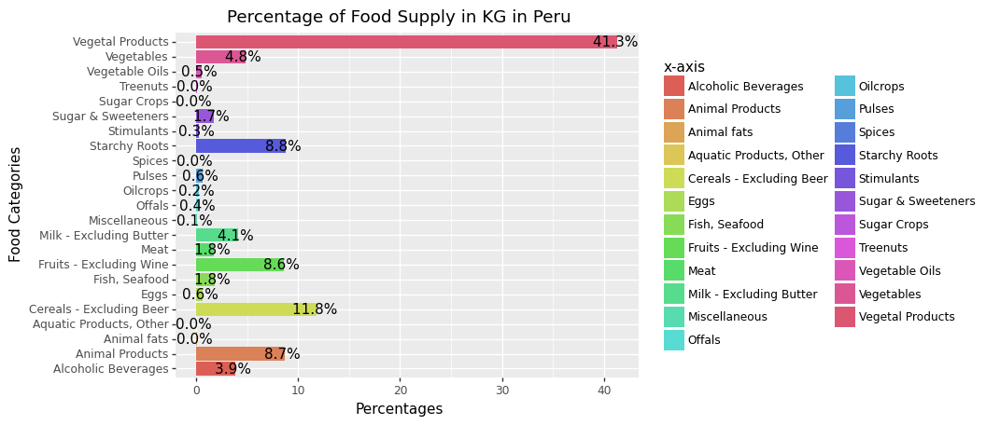

<ggplot: (8793505980585)>


In [ ]:
df_kg_c1_percentages_bar_chart = draw_bar_chart(df_kg_c1_percentages, df_c1_column_names, "Percentage of Food Supply in KG in "+c1)
df_kg_c2_percentages_bar_chart = draw_bar_chart(df_kg_c2_percentages, df_c2_column_names, "Percentage of Food Supply in KG in "+c2)
print(df_kg_c1_percentages_bar_chart)
print(df_kg_c2_percentages_bar_chart)

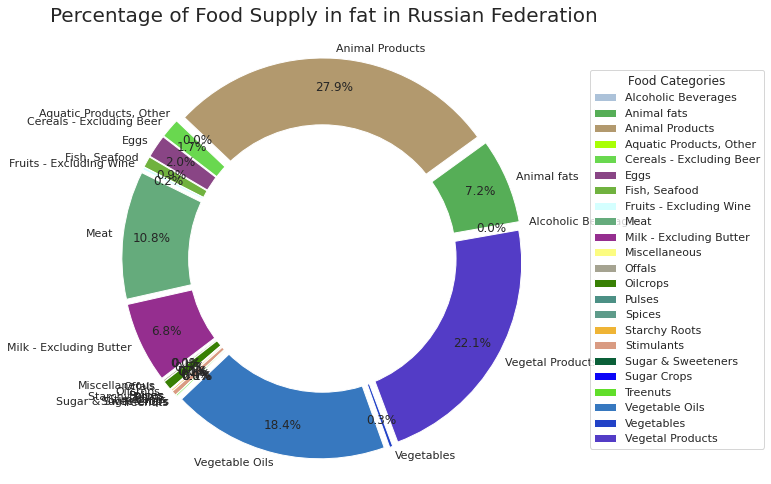

<Figure size 2160x2160 with 0 Axes>

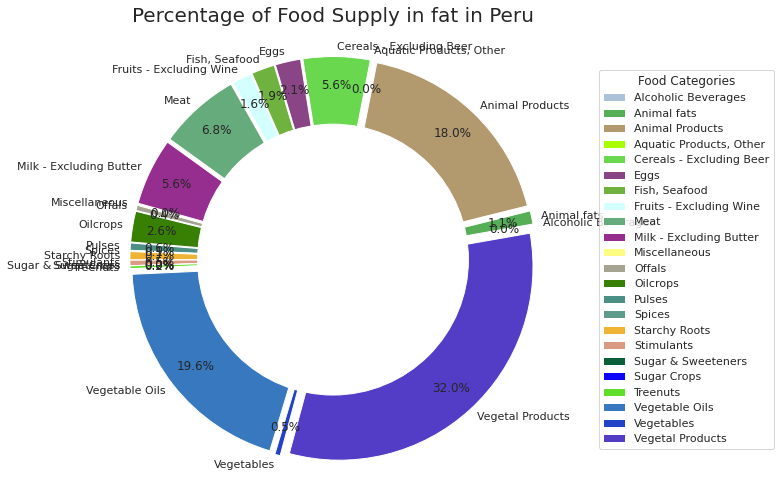

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_fat_c1_percentages_pie_chart = draw_pie_chart(df_fat_c1_percentages, df_c1_column_names, "Percentage of Food Supply in fat in "+c1)
df_fat_c2_percentages_pie_chart = draw_pie_chart(df_fat_c2_percentages, df_c2_column_names, "Percentage of Food Supply in fat in "+c2)

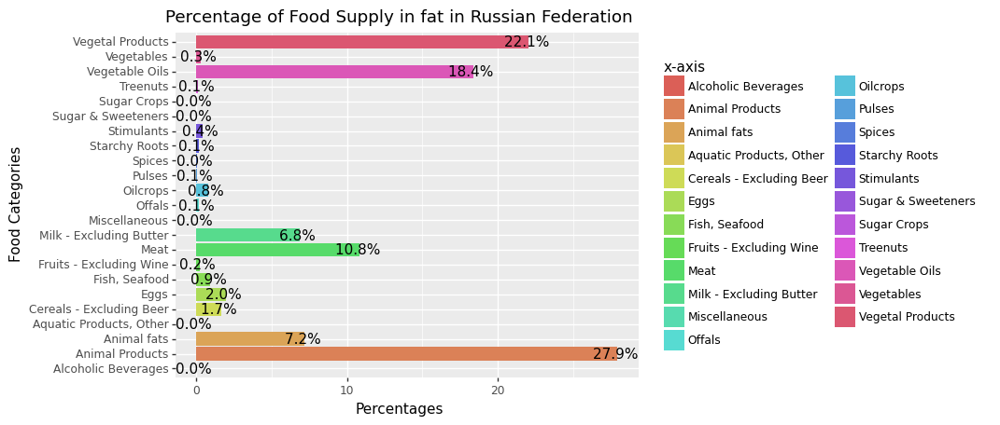

<ggplot: (8793502745499)>


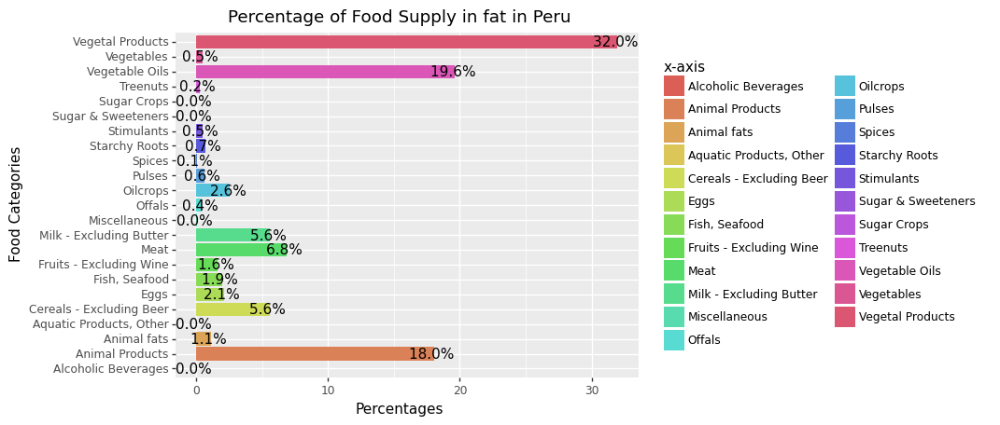

<ggplot: (-9223363243355052747)>


In [ ]:
df_fat_c1_percentages_bar_chart = draw_bar_chart(df_fat_c1_percentages, df_c1_column_names, "Percentage of Food Supply in fat in "+c1)
df_fat_c2_percentages_bar_chart = draw_bar_chart(df_fat_c2_percentages, df_c2_column_names, "Percentage of Food Supply in fat in "+c2)
print(df_fat_c1_percentages_bar_chart)
print(df_fat_c2_percentages_bar_chart)

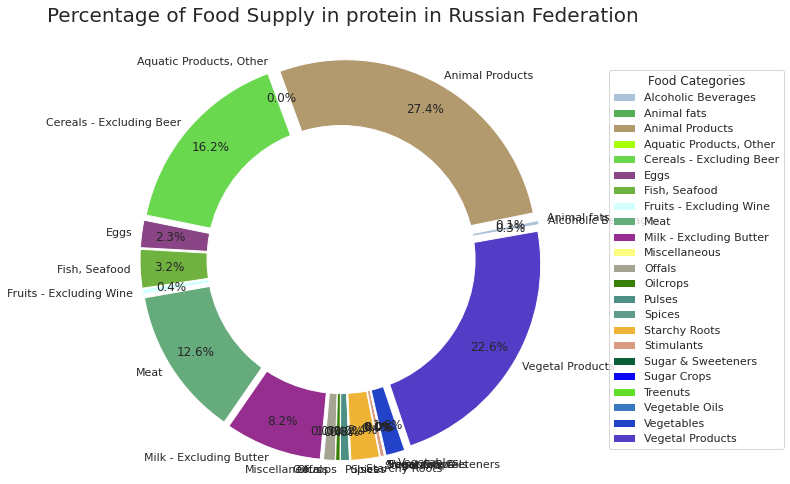

<Figure size 2160x2160 with 0 Axes>

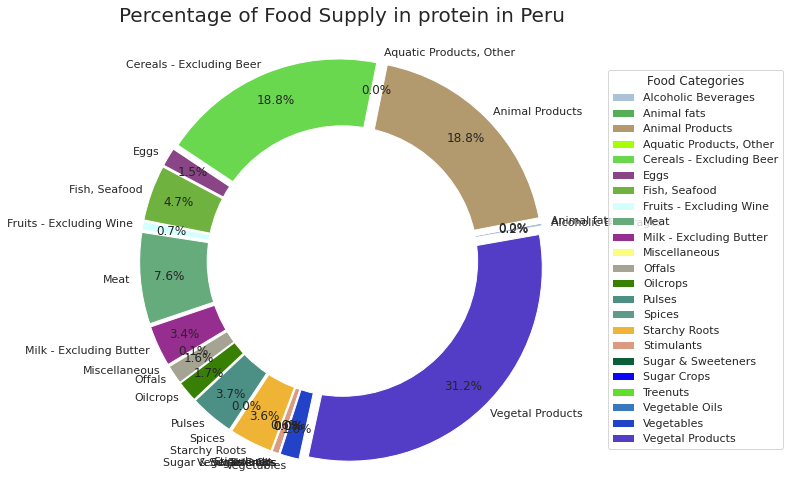

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_protein_c1_percentages_pie_chart = draw_pie_chart(df_protein_c1_percentages, df_c1_column_names, "Percentage of Food Supply in protein in "+c1)
df_protein_c2_percentages_pie_chart = draw_pie_chart(df_protein_c2_percentages, df_c2_column_names, "Percentage of Food Supply in protein in "+c2)

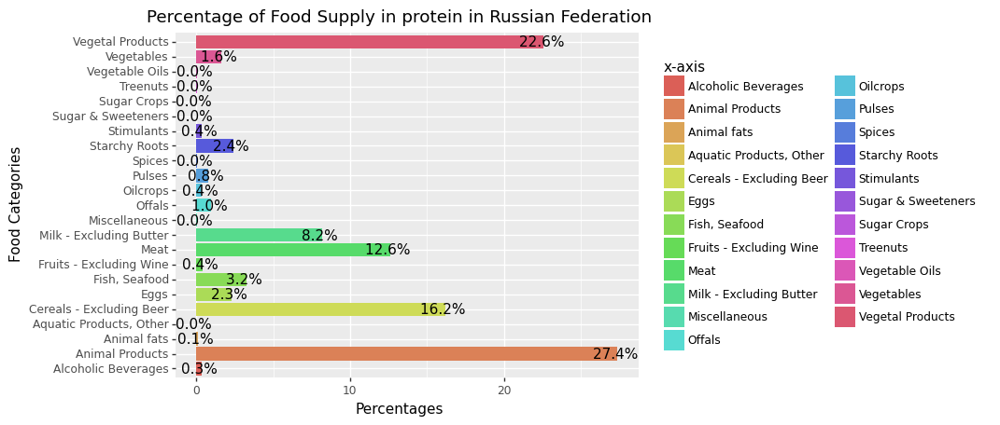

<ggplot: (8793499626195)>


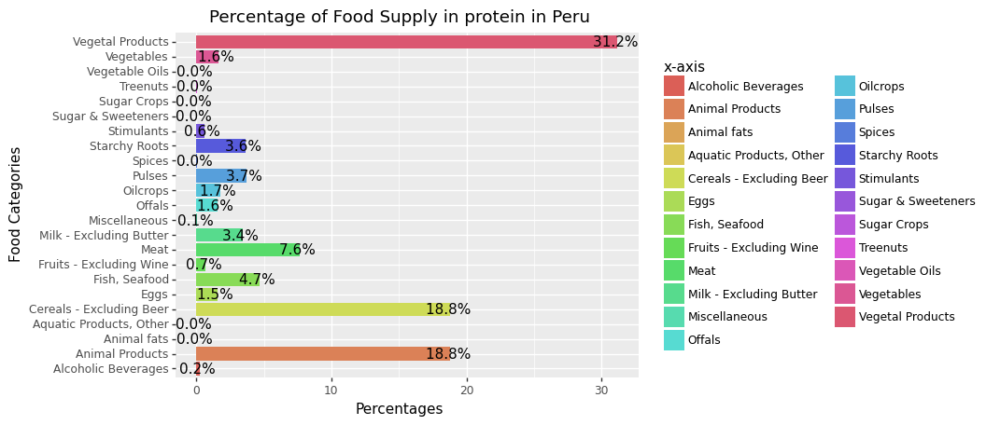

<ggplot: (-9223363243350434251)>


In [ ]:
df_protein_c1_percentages_bar_chart = draw_bar_chart(df_protein_c1_percentages, df_c1_column_names, "Percentage of Food Supply in protein in "+c1)
df_protein_c2_percentages_bar_chart = draw_bar_chart(df_protein_c2_percentages, df_c2_column_names, "Percentage of Food Supply in protein in "+c2)
print(df_protein_c1_percentages_bar_chart)
print(df_protein_c2_percentages_bar_chart)

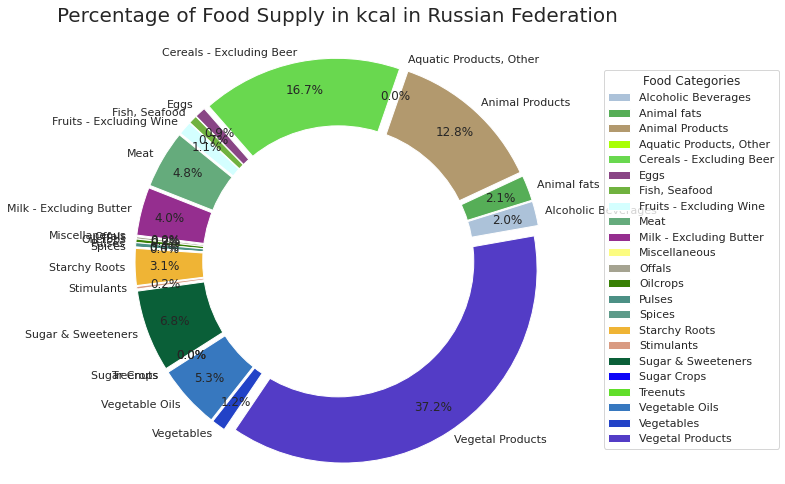

<Figure size 2160x2160 with 0 Axes>

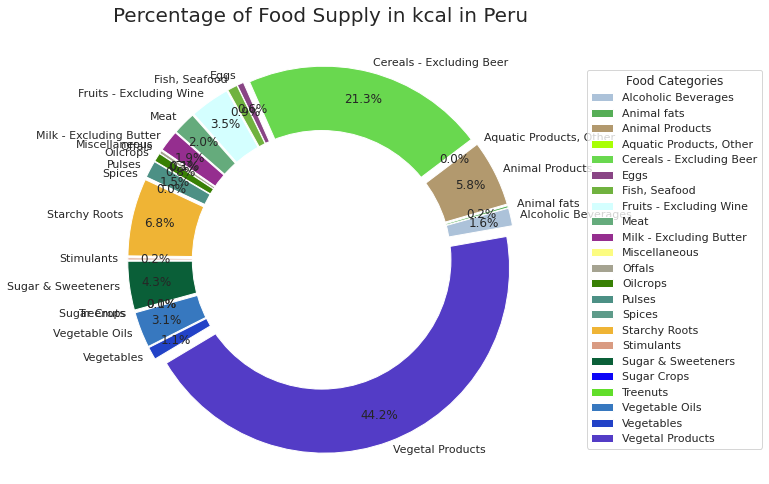

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_kcal_c1_percentages_pie_chart = draw_pie_chart(df_kcal_c1_percentages, df_c1_column_names, "Percentage of Food Supply in kcal in "+c1)
df_kcal_c2_percentages_pie_chart = draw_pie_chart(df_kcal_c2_percentages, df_c2_column_names, "Percentage of Food Supply in kcal in "+c2)

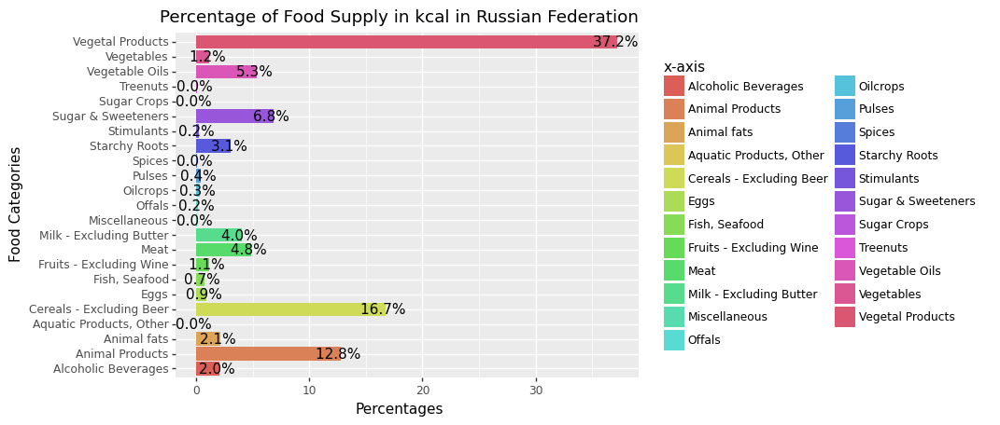

<ggplot: (-9223363243354957852)>


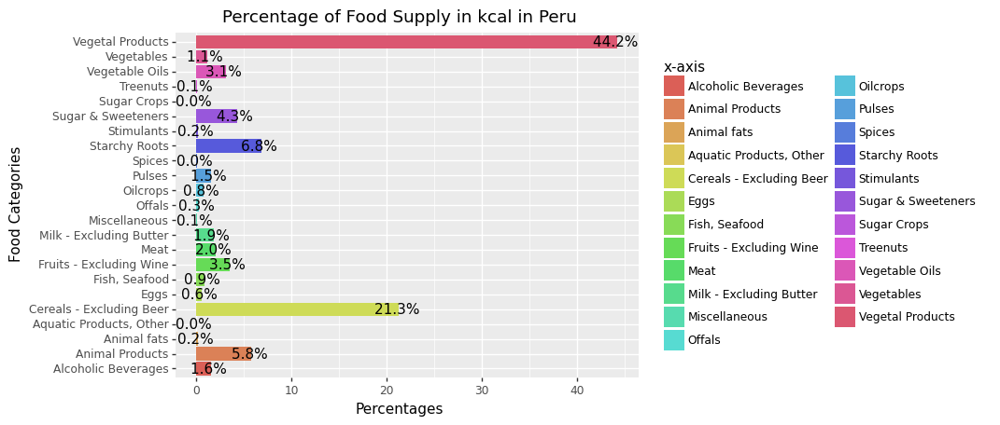

<ggplot: (8793500036174)>


In [ ]:
df_kcal_c1_percentages_bar_chart = draw_bar_chart(df_kcal_c1_percentages, df_c1_column_names, "Percentage of Food Supply in kcal in "+c1)
df_kcal_c2_percentages_bar_chart = draw_bar_chart(df_kcal_c2_percentages, df_c2_column_names, "Percentage of Food Supply in kcal in "+c2)
print(df_kcal_c1_percentages_bar_chart)
print(df_kcal_c2_percentages_bar_chart)

<p>The following table will describe about the top 5 most consumption sources for 4 different dataset for the countries Russian Federation and Peru. It will also show the recovery rate of those countries.</p>

<table style="border-collapse: collapse; border: 1px black solid;">
  <tbody>
   <tr style="border-collapse: collapse; border: 1px black solid;">
       <th>Country/Food Supply</th>
       <th>Food Supply in KG</th>
       <th>Food Supply in Fat</th>
       <th>Food Supply in Protein</th>
       <th>Food Supply in Kcal</th>
       <th>Recovery Rate</th>
   </tr>
    <tr style="border-collapse: collapse; border: 1px black solid;">
        <td>Russian Federation</td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Animal Products</li>
            <li>Milk - Excluding Butter</li>
            <li>Cereals - Excluding Beer</li>
            <li>Vegetables</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Animal Products</li>
            <li>Vegetal Products</li>
            <li>Vegetable Oils</li>
            <li>Meat</li>
            <li>Animal Fats</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Animal Products</li>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Beers</li>
            <li>Meat</li>
            <li>Milk - Excluding Butter</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Beer</li>
            <li>Animal Products</li>
            <li>Sugar & Sweeteners</li>
            <li>Vegetable Oils</li>
        </ul>
        </td>
        <td>97.8%</td>
    </tr>
    <tr>
        <td>Peru</td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Beer</li>
            <li>Starchy Roots</li>
            <li>Animal Products</li>
            <li>Fruits - Excluding Wine</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Vegetable Oils</li>
            <li>Animal Products</li>
            <li>Meat</li>
            <li>Milk, Cereals</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Butter</li>
            <li>Animal Products</li>
            <li>Meat</li>
            <li>Fish, Seafood</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Beer</li>
            <li>Starchy Roots</li>
            <li>Animal Products</li>
            <li>Sugar & Sweeterners</li>
        </ul>
        </td>
        <td>94.7%</td>
    </tr>
  </tbody>
</table>

In [ ]:
c1 = "Chile"
c2 = "Iran (Islamic Republic of)"
df_kg_filtered, df_kcal_filtered, df_fat_filtered,  df_protein_filtered, df_kg_c1, df_kcal_c1, df_fat_c1, df_protein_c1, df_kg_c2, df_kcal_c2, df_fat_c2, df_protein_c2, df_c1_column_names, df_kg_c1_percentages, df_kcal_c1_percentages, df_fat_c1_percentages, df_protein_c1_percentages, df_c2_column_names, df_kg_c2_percentages, df_kcal_c2_percentages, df_fat_c2_percentages, df_protein_c2_percentages = get_data_for_two_countries(c1, c2)

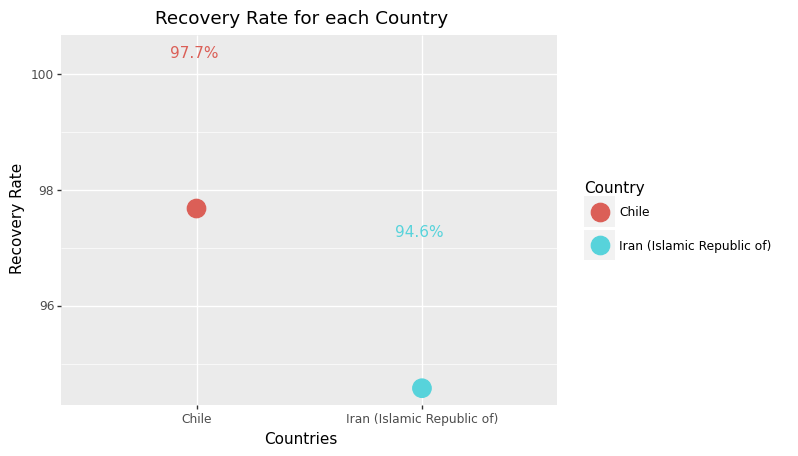

<ggplot: (8793504414689)>

In [ ]:
df_kg_filtered_scatter_plot = draw_scatter_plot(df_kg_filtered, "Recovery Rate for each Country")
df_kg_filtered_scatter_plot

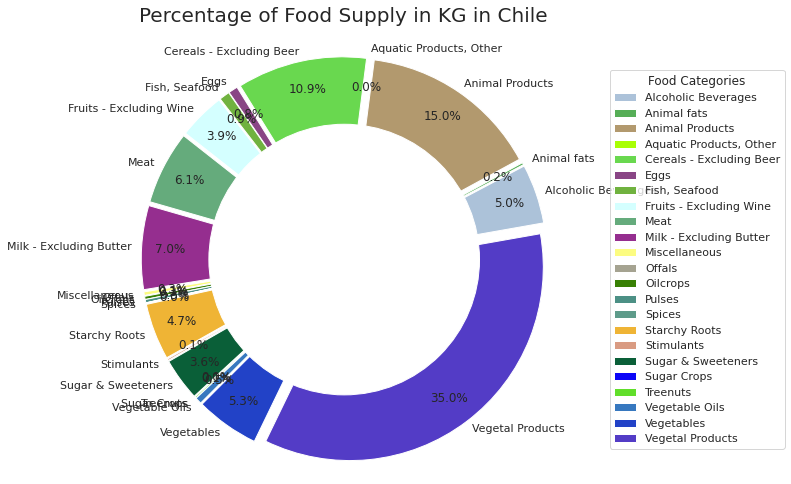

<Figure size 2160x2160 with 0 Axes>

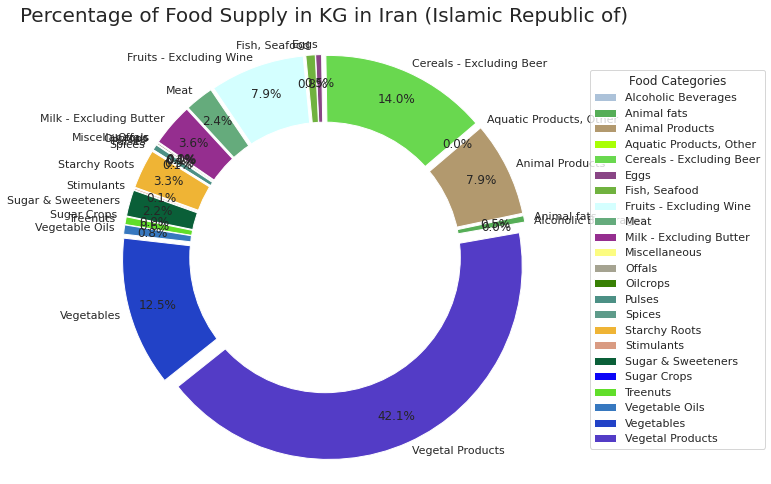

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_kg_c1_percentages_pie_chart = draw_pie_chart(df_kg_c1_percentages, df_c1_column_names, "Percentage of Food Supply in KG in "+c1)
df_kg_c2_percentages_pie_chart = draw_pie_chart(df_kg_c2_percentages, df_c2_column_names, "Percentage of Food Supply in KG in "+c2)

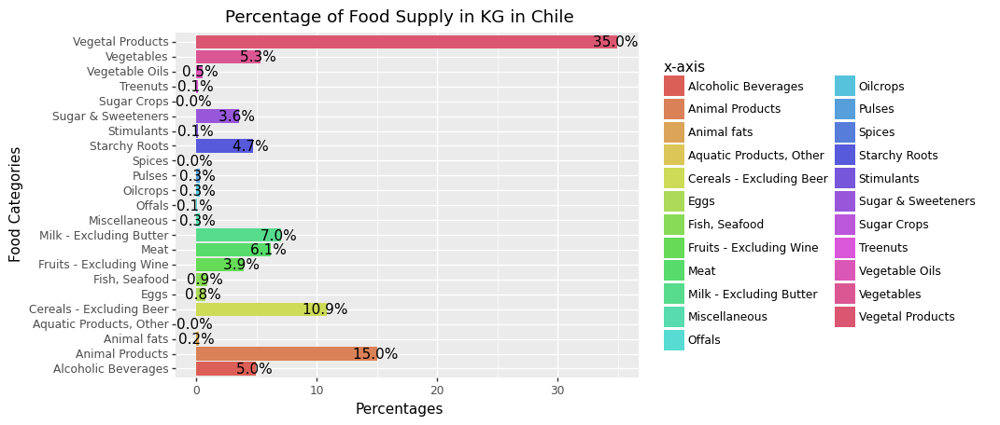

<ggplot: (8793502731156)>


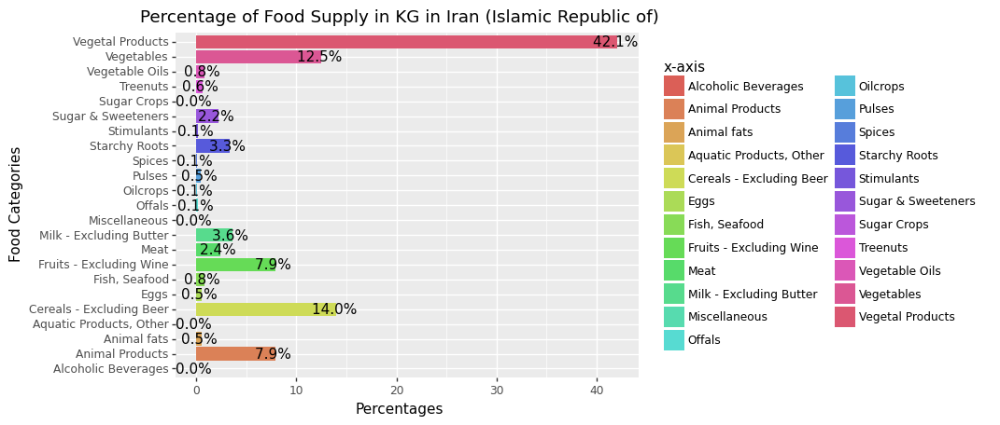

<ggplot: (-9223363243354816098)>


In [ ]:
df_kg_c1_percentages_bar_chart = draw_bar_chart(df_kg_c1_percentages, df_c1_column_names, "Percentage of Food Supply in KG in "+c1)
df_kg_c2_percentages_bar_chart = draw_bar_chart(df_kg_c2_percentages, df_c2_column_names, "Percentage of Food Supply in KG in "+c2)
print(df_kg_c1_percentages_bar_chart)
print(df_kg_c2_percentages_bar_chart)

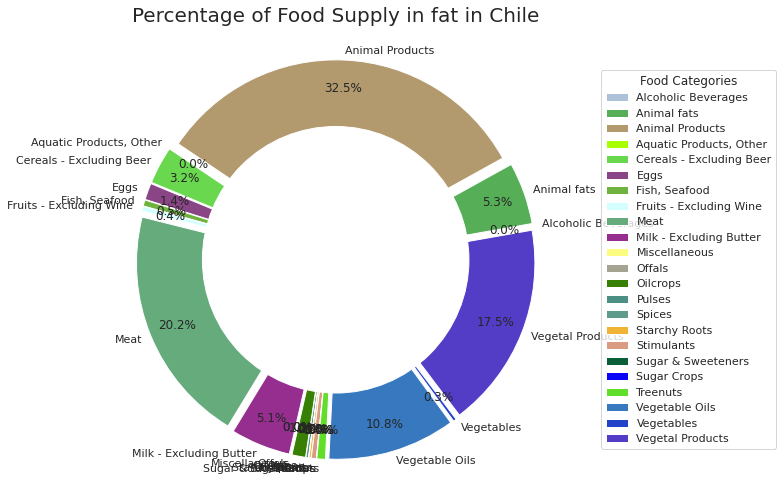

<Figure size 2160x2160 with 0 Axes>

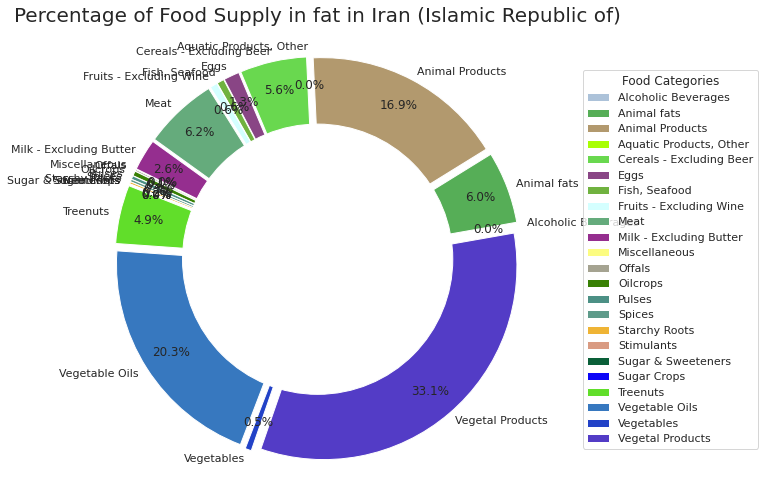

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_fat_c1_percentages_pie_chart = draw_pie_chart(df_fat_c1_percentages, df_c1_column_names, "Percentage of Food Supply in fat in "+c1)
df_fat_c2_percentages_pie_chart = draw_pie_chart(df_fat_c2_percentages, df_c2_column_names, "Percentage of Food Supply in fat in "+c2)

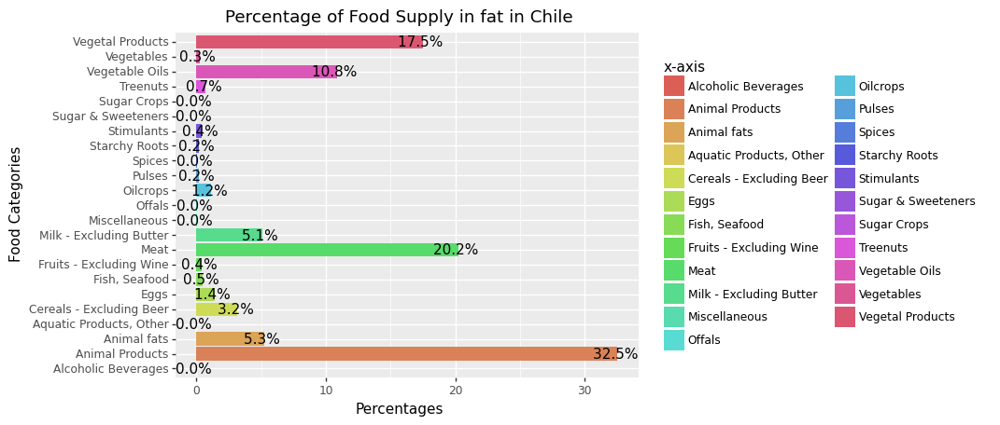

<ggplot: (8793499701750)>


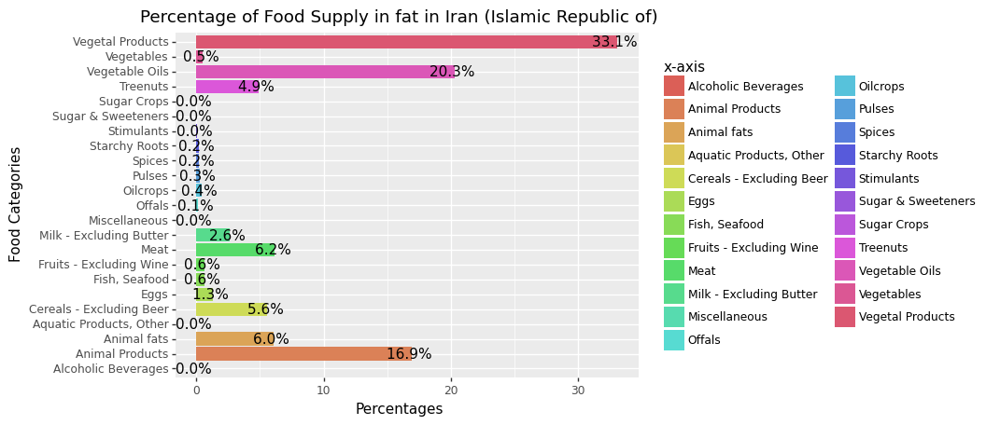

<ggplot: (-9223363243352030453)>


In [ ]:
df_fat_c1_percentages_bar_chart = draw_bar_chart(df_fat_c1_percentages, df_c1_column_names, "Percentage of Food Supply in fat in "+c1)
df_fat_c2_percentages_bar_chart = draw_bar_chart(df_fat_c2_percentages, df_c2_column_names, "Percentage of Food Supply in fat in "+c2)
print(df_fat_c1_percentages_bar_chart)
print(df_fat_c2_percentages_bar_chart)

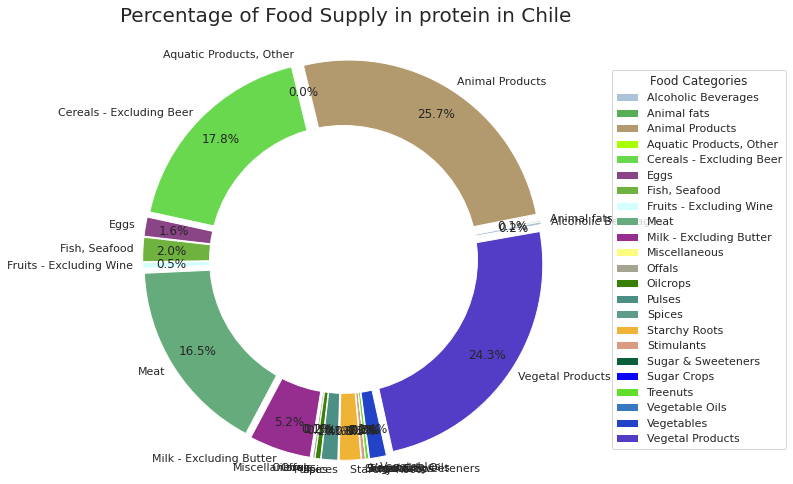

<Figure size 2160x2160 with 0 Axes>

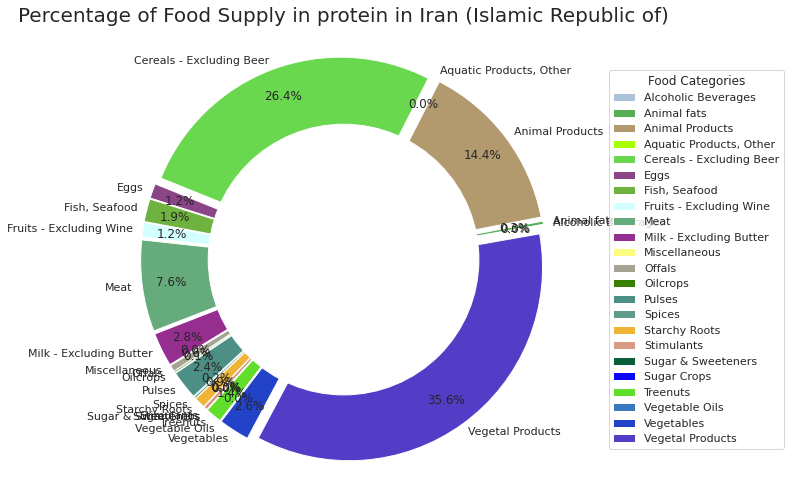

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_protein_c1_percentages_pie_chart = draw_pie_chart(df_protein_c1_percentages, df_c1_column_names, "Percentage of Food Supply in protein in "+c1)
df_protein_c2_percentages_pie_chart = draw_pie_chart(df_protein_c2_percentages, df_c2_column_names, "Percentage of Food Supply in protein in "+c2)

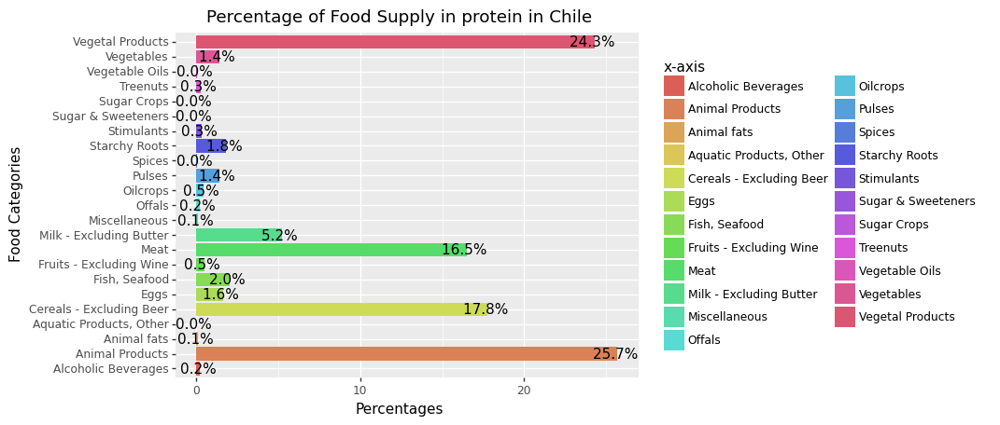

<ggplot: (8793502741880)>


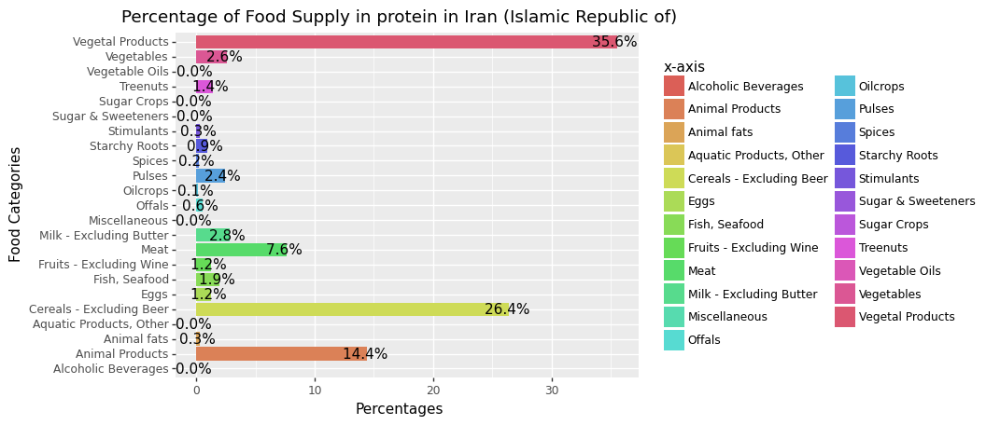

<ggplot: (8793499950505)>


In [ ]:
df_protein_c1_percentages_bar_chart = draw_bar_chart(df_protein_c1_percentages, df_c1_column_names, "Percentage of Food Supply in protein in "+c1)
df_protein_c2_percentages_bar_chart = draw_bar_chart(df_protein_c2_percentages, df_c2_column_names, "Percentage of Food Supply in protein in "+c2)
print(df_protein_c1_percentages_bar_chart)
print(df_protein_c2_percentages_bar_chart)

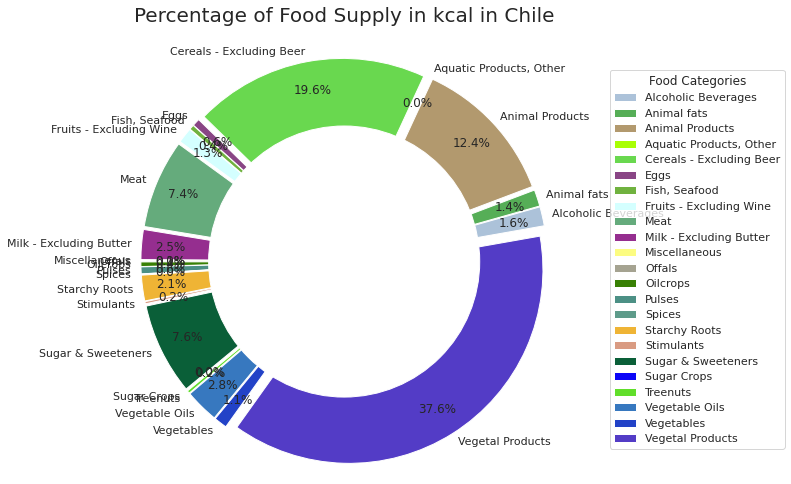

<Figure size 2160x2160 with 0 Axes>

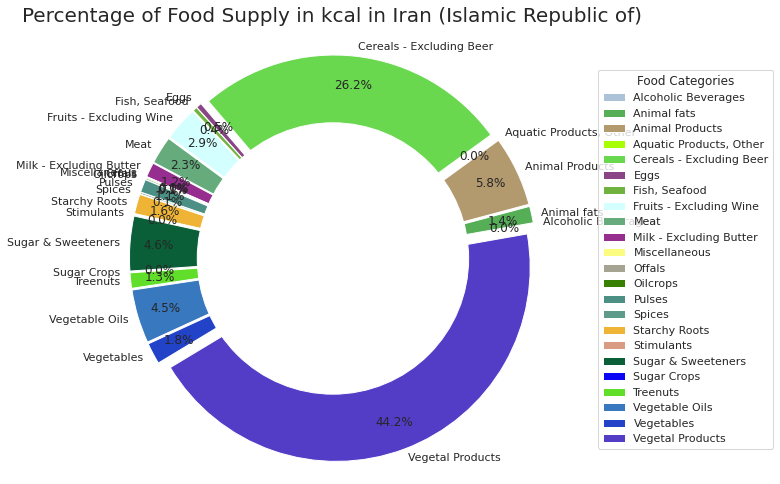

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_kcal_c1_percentages_pie_chart = draw_pie_chart(df_kcal_c1_percentages, df_c1_column_names, "Percentage of Food Supply in kcal in "+c1)
df_kcal_c2_percentages_pie_chart = draw_pie_chart(df_kcal_c2_percentages, df_c2_column_names, "Percentage of Food Supply in kcal in "+c2)

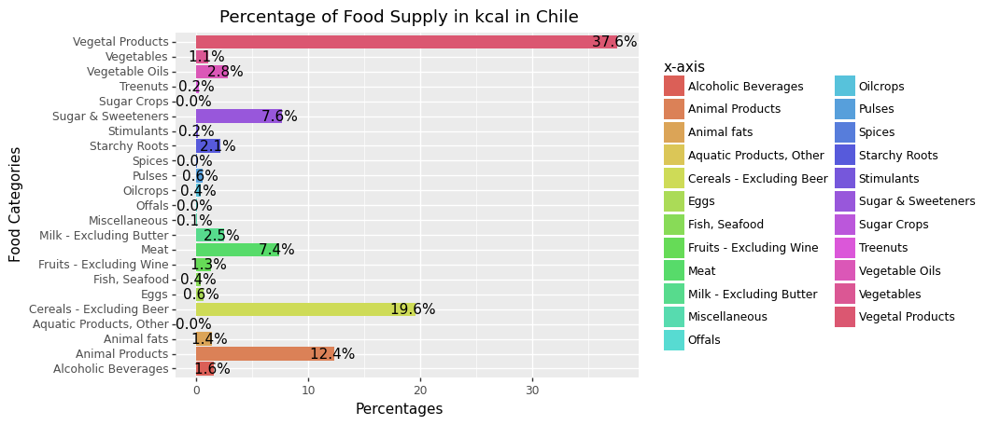

<ggplot: (8793499774931)>


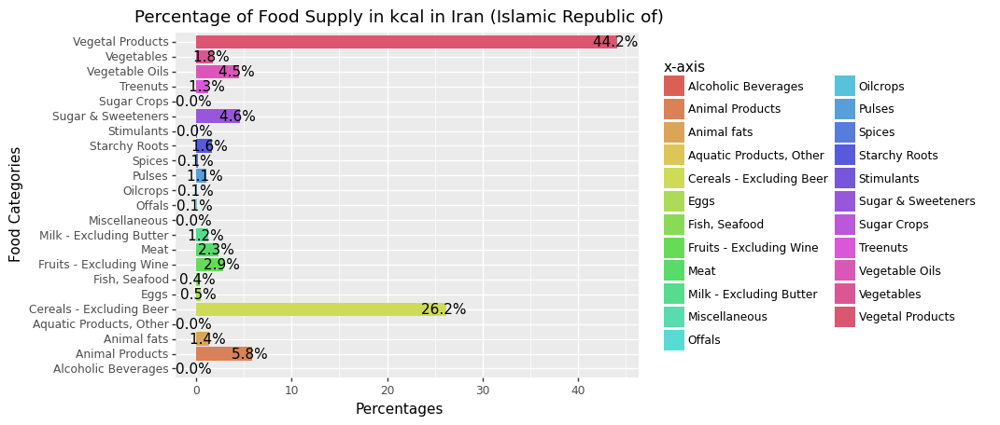

<ggplot: (8793499817981)>


In [ ]:
df_kcal_c1_percentages_bar_chart = draw_bar_chart(df_kcal_c1_percentages, df_c1_column_names, "Percentage of Food Supply in kcal in "+c1)
df_kcal_c2_percentages_bar_chart = draw_bar_chart(df_kcal_c2_percentages, df_c2_column_names, "Percentage of Food Supply in kcal in "+c2)
print(df_kcal_c1_percentages_bar_chart)
print(df_kcal_c2_percentages_bar_chart)

<p>The following table will describe about the top 5 most consumption sources for 4 different dataset for the countries Chile and Iran (Islamic Republic of). It will also show the recovery rate of those countries.</p>

<table style="border-collapse: collapse; border: 1px black solid;">
  <tbody>
   <tr style="border-collapse: collapse; border: 1px black solid;">
       <th>Country/Food Supply</th>
       <th>Food Supply in KG</th>
       <th>Food Supply in Fat</th>
       <th>Food Supply in Protein</th>
       <th>Food Supply in Kcal</th>
       <th>Recovery Rate</th>
   </tr>
    <tr style="border-collapse: collapse; border: 1px black solid;">
        <td>Chile</td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Animal Products</li>
            <li>Cereals - Excluding Beer</li>
            <li>Milk - Excluding Butter</li>
            <li>Meat</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Animal Products</li>
            <li>Meat</li>
            <li>Vegetal Products</li>
            <li>Vegetable Oils</li>
            <li>Animal Fats</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Animal Products</li>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Beers</li>
            <li>Meat</li>
            <li>Milk - Excluding Butter</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Beer</li>
            <li>Animal Products</li>
            <li>Sugar & Sweeteners</li>
            <li>Meat</li>
        </ul>
        </td>
        <td>97.7%</td>
    </tr>
    <tr>
        <td>Iran (Islamic Republic of)</td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Beer</li>
            <li>Vegtables</li>
            <li>Animal Products</li>
            <li>Fruits - Excluding Wine</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Vegetable Oils</li>
            <li>Animal Products</li>
            <li>Meat</li>
            <li>Animal Fats</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Butter</li>
            <li>Animal Products</li>
            <li>Meat</li>
            <li>Milk - Excluding Butter</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Beer</li>
            <li>Animal Products</li>
            <li>Sugar & Sweeterners</li>
            <li>Vegetable Oils</li>
        </ul>
        </td>
        <td>94.6%</td>
    </tr>
  </tbody>
</table>

In [ ]:
c1 = "Turkey"
c2 = "Brazil"
df_kg_filtered, df_kcal_filtered, df_fat_filtered,  df_protein_filtered, df_kg_c1, df_kcal_c1, df_fat_c1, df_protein_c1, df_kg_c2, df_kcal_c2, df_fat_c2, df_protein_c2, df_c1_column_names, df_kg_c1_percentages, df_kcal_c1_percentages, df_fat_c1_percentages, df_protein_c1_percentages, df_c2_column_names, df_kg_c2_percentages, df_kcal_c2_percentages, df_fat_c2_percentages, df_protein_c2_percentages = get_data_for_two_countries(c1, c2)

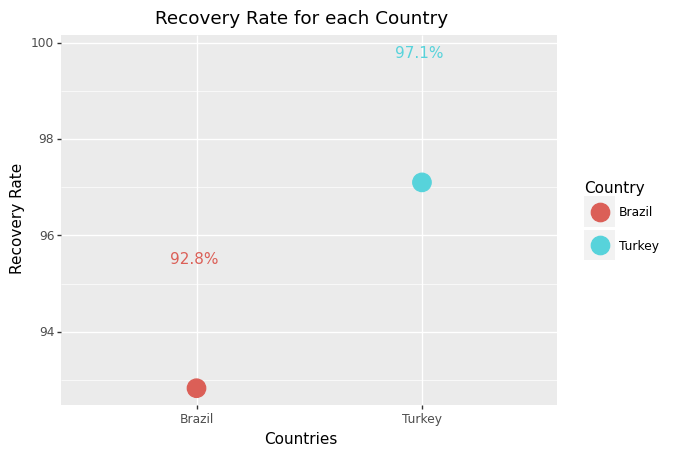

<ggplot: (-9223363243355006285)>

In [ ]:
df_kg_filtered_scatter_plot = draw_scatter_plot(df_kg_filtered, "Recovery Rate for each Country")
df_kg_filtered_scatter_plot

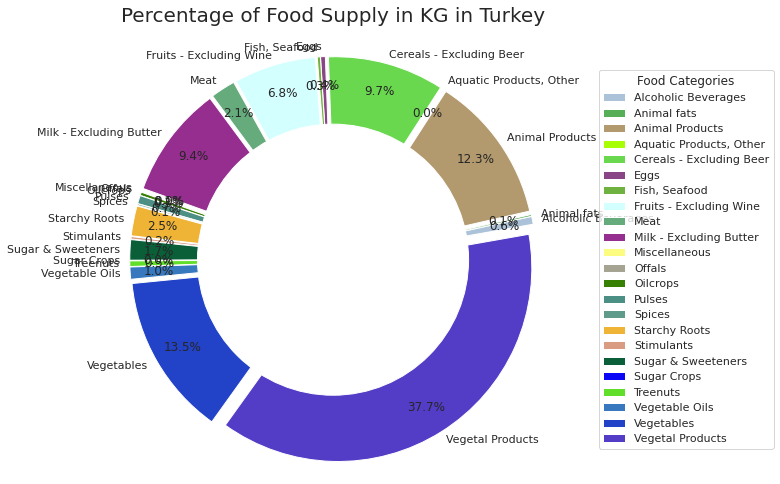

<Figure size 2160x2160 with 0 Axes>

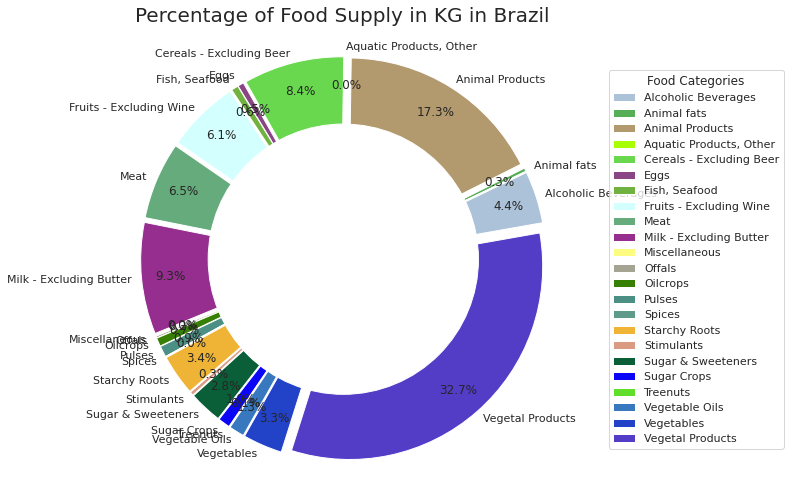

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_kg_c1_percentages_pie_chart = draw_pie_chart(df_kg_c1_percentages, df_c1_column_names, "Percentage of Food Supply in KG in "+c1)
df_kg_c2_percentages_pie_chart = draw_pie_chart(df_kg_c2_percentages, df_c2_column_names, "Percentage of Food Supply in KG in "+c2)

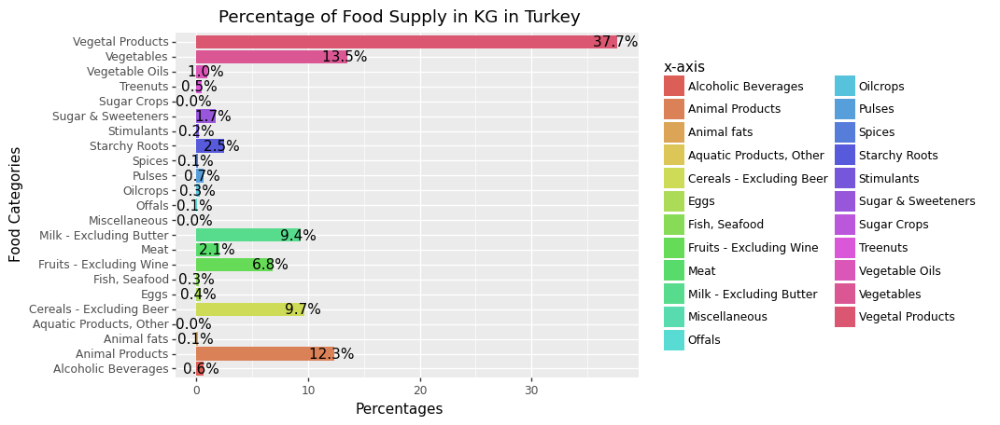

<ggplot: (-9223363243355212214)>


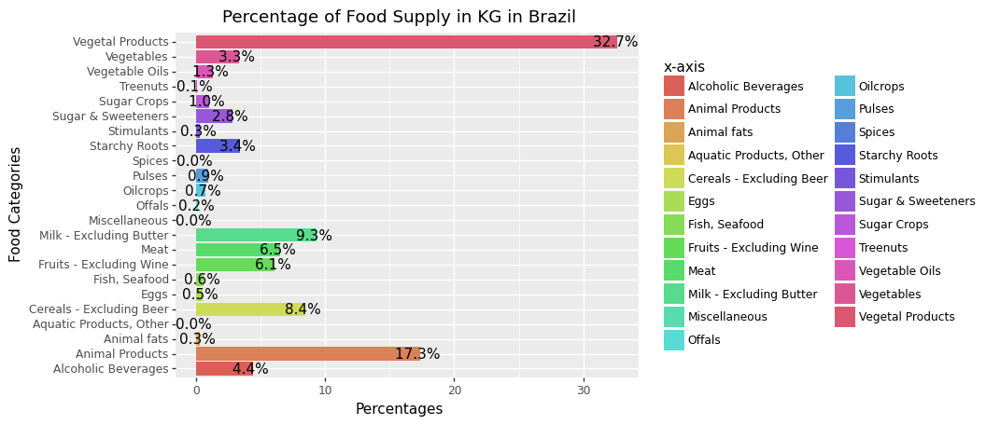

<ggplot: (8793500031657)>


In [ ]:
df_kg_c1_percentages_bar_chart = draw_bar_chart(df_kg_c1_percentages, df_c1_column_names, "Percentage of Food Supply in KG in "+c1)
df_kg_c2_percentages_bar_chart = draw_bar_chart(df_kg_c2_percentages, df_c2_column_names, "Percentage of Food Supply in KG in "+c2)
print(df_kg_c1_percentages_bar_chart)
print(df_kg_c2_percentages_bar_chart)

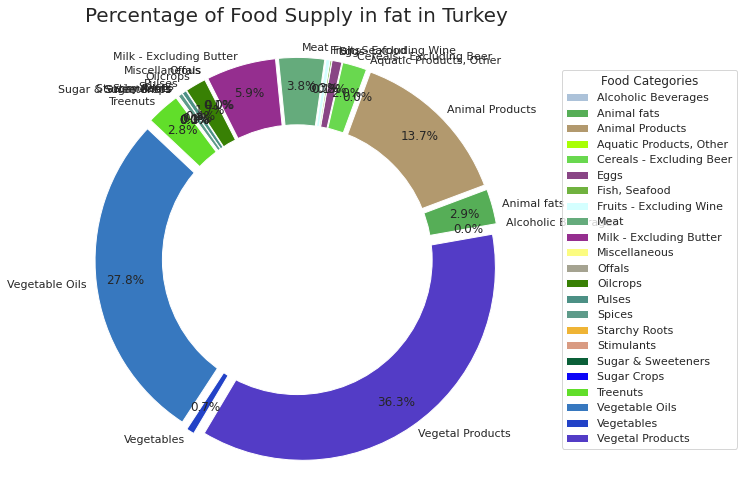

<Figure size 2160x2160 with 0 Axes>

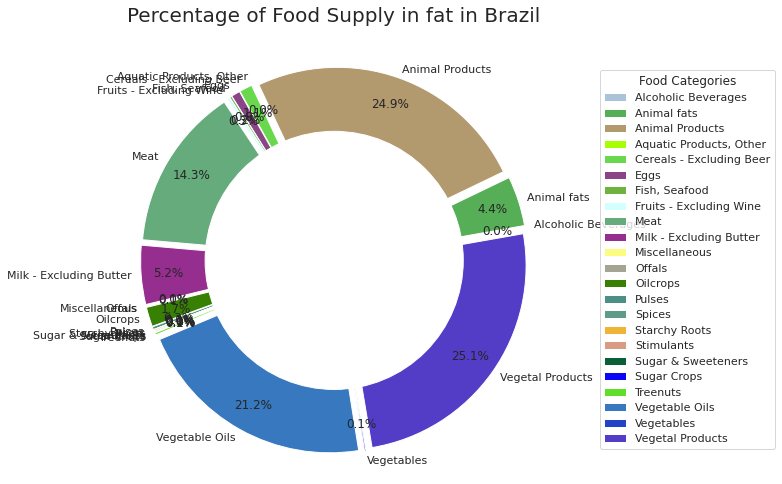

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_fat_c1_percentages_pie_chart = draw_pie_chart(df_fat_c1_percentages, df_c1_column_names, "Percentage of Food Supply in fat in "+c1)
df_fat_c2_percentages_pie_chart = draw_pie_chart(df_fat_c2_percentages, df_c2_column_names, "Percentage of Food Supply in fat in "+c2)

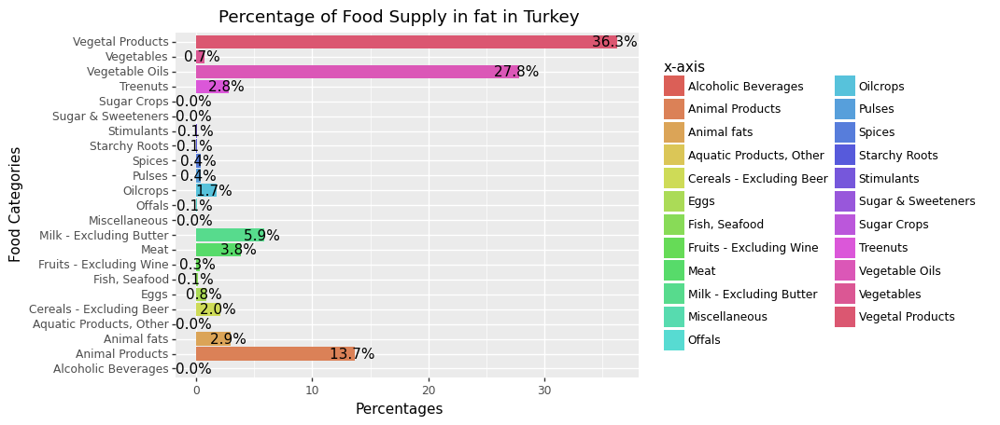

<ggplot: (8793499667411)>


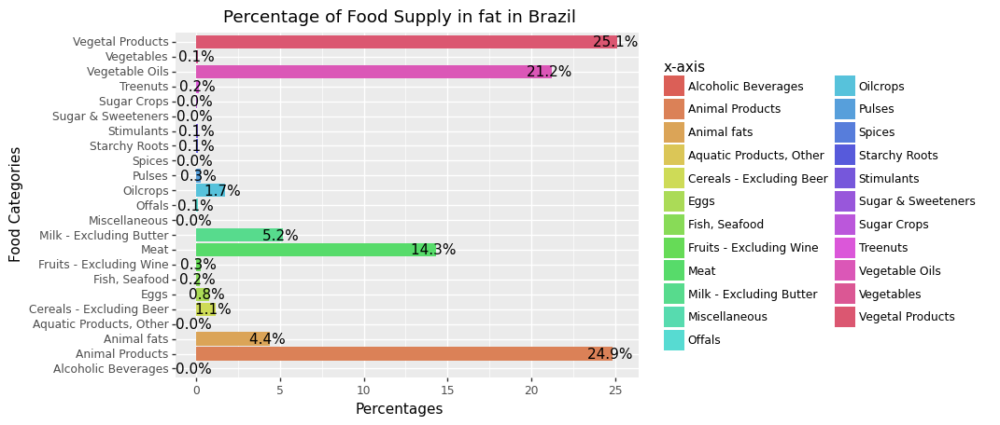

<ggplot: (-9223363243355319594)>


In [ ]:
df_fat_c1_percentages_bar_chart = draw_bar_chart(df_fat_c1_percentages, df_c1_column_names, "Percentage of Food Supply in fat in "+c1)
df_fat_c2_percentages_bar_chart = draw_bar_chart(df_fat_c2_percentages, df_c2_column_names, "Percentage of Food Supply in fat in "+c2)
print(df_fat_c1_percentages_bar_chart)
print(df_fat_c2_percentages_bar_chart)

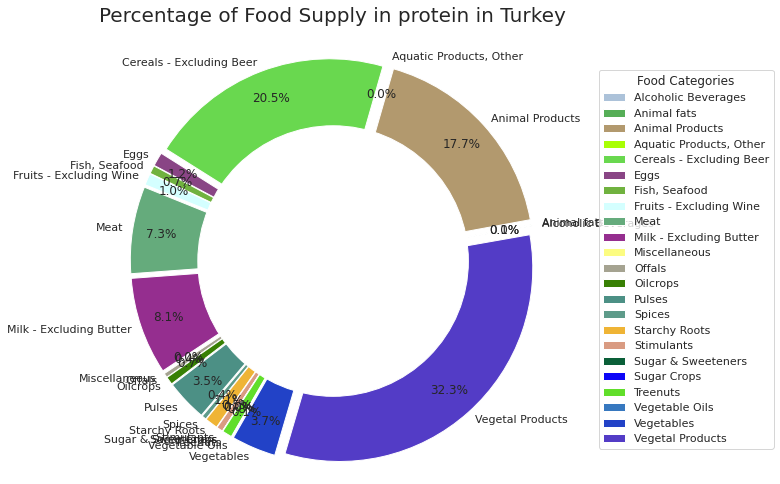

<Figure size 2160x2160 with 0 Axes>

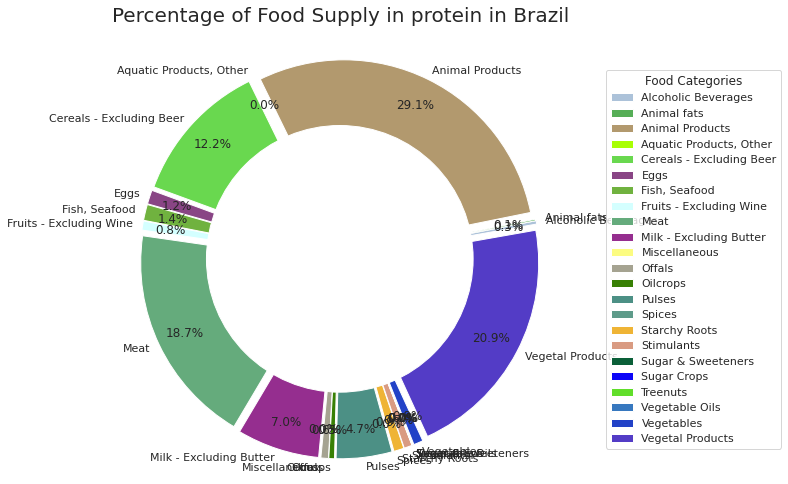

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_protein_c1_percentages_pie_chart = draw_pie_chart(df_protein_c1_percentages, df_c1_column_names, "Percentage of Food Supply in protein in "+c1)
df_protein_c2_percentages_pie_chart = draw_pie_chart(df_protein_c2_percentages, df_c2_column_names, "Percentage of Food Supply in protein in "+c2)

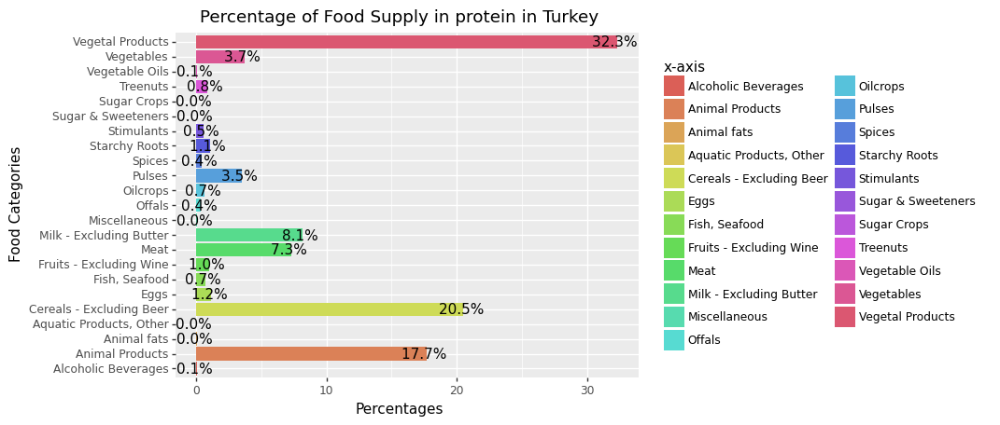

<ggplot: (8793499397373)>


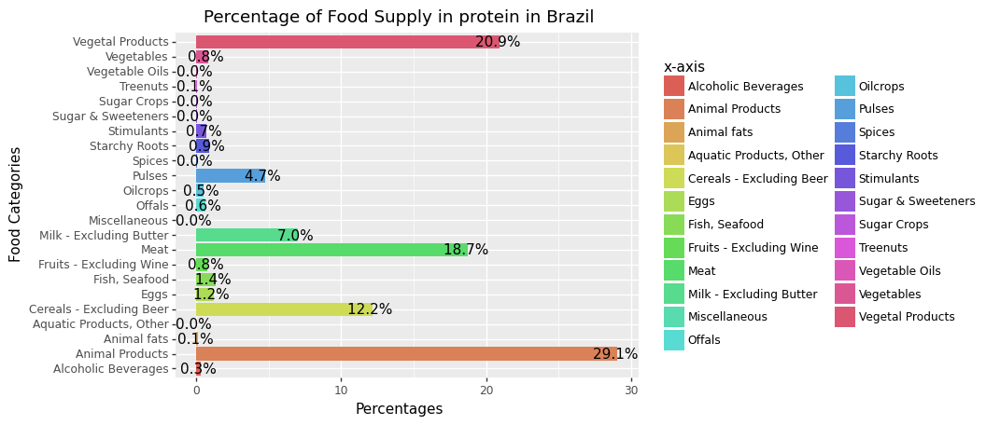

<ggplot: (8793499902763)>


In [ ]:
df_protein_c1_percentages_bar_chart = draw_bar_chart(df_protein_c1_percentages, df_c1_column_names, "Percentage of Food Supply in protein in "+c1)
df_protein_c2_percentages_bar_chart = draw_bar_chart(df_protein_c2_percentages, df_c2_column_names, "Percentage of Food Supply in protein in "+c2)
print(df_protein_c1_percentages_bar_chart)
print(df_protein_c2_percentages_bar_chart)

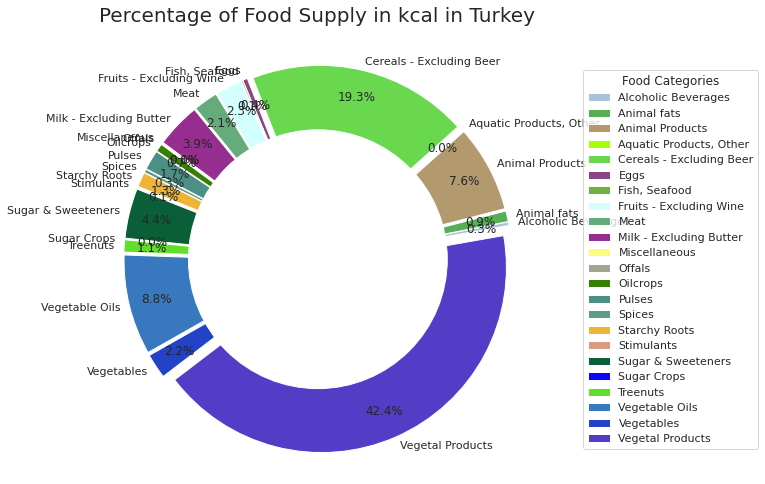

<Figure size 2160x2160 with 0 Axes>

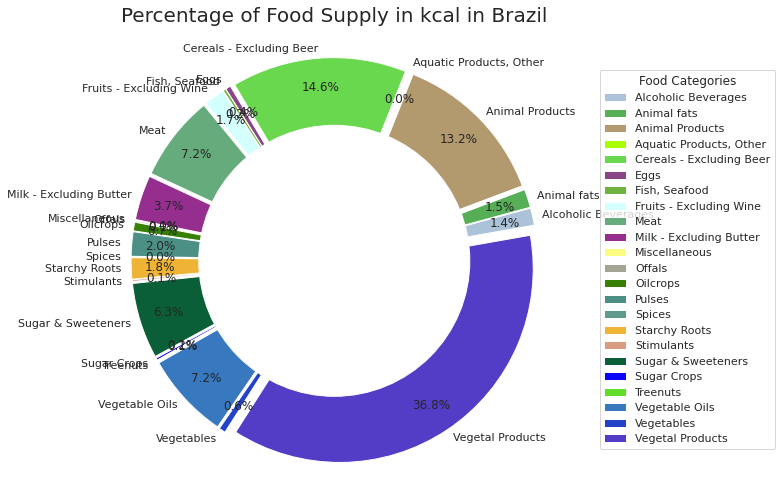

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_kcal_c1_percentages_pie_chart = draw_pie_chart(df_kcal_c1_percentages, df_c1_column_names, "Percentage of Food Supply in kcal in "+c1)
df_kcal_c2_percentages_pie_chart = draw_pie_chart(df_kcal_c2_percentages, df_c2_column_names, "Percentage of Food Supply in kcal in "+c2)

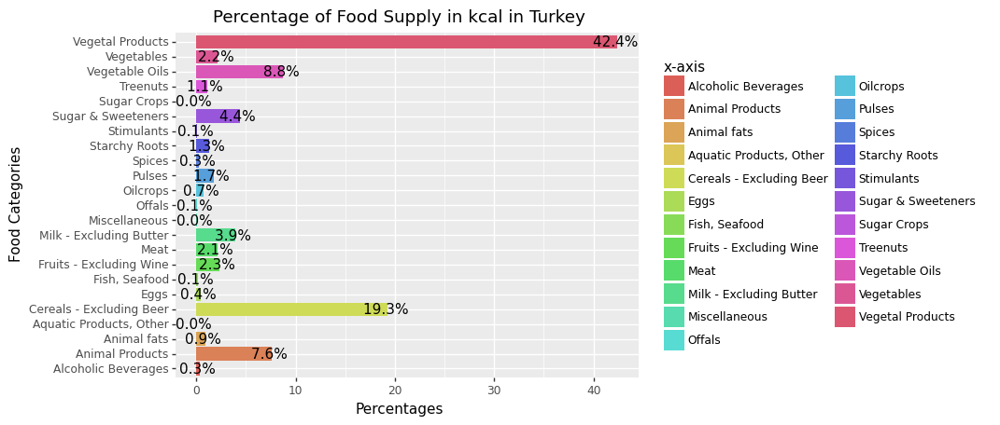

<ggplot: (-9223363243348755989)>


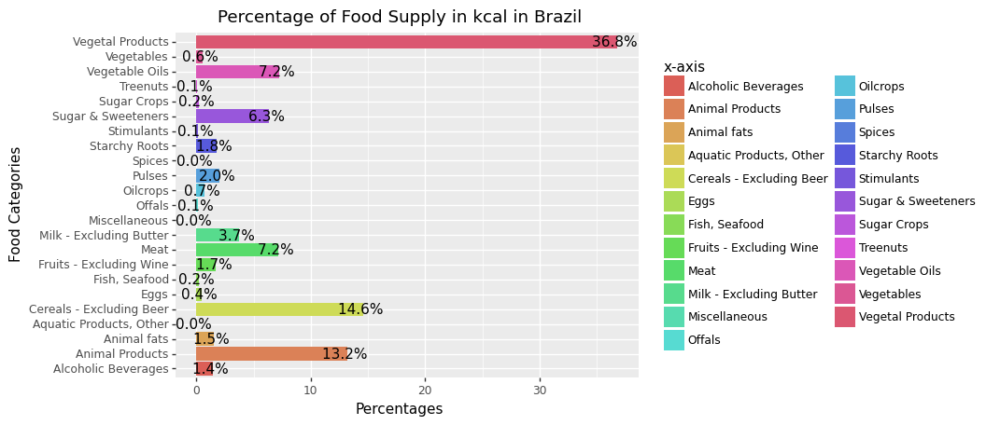

<ggplot: (8793499979307)>


In [ ]:
df_kcal_c1_percentages_bar_chart = draw_bar_chart(df_kcal_c1_percentages, df_c1_column_names, "Percentage of Food Supply in kcal in "+c1)
df_kcal_c2_percentages_bar_chart = draw_bar_chart(df_kcal_c2_percentages, df_c2_column_names, "Percentage of Food Supply in kcal in "+c2)
print(df_kcal_c1_percentages_bar_chart)
print(df_kcal_c2_percentages_bar_chart)

<p>The following table will describe about the top 5 most consumption sources for 4 different dataset for the countries Turkey and Brazil. It will also show the recovery rate of those countries.</p>

<table style="border-collapse: collapse; border: 1px black solid;">
  <tbody>
   <tr style="border-collapse: collapse; border: 1px black solid;">
       <th>Country/Food Supply</th>
       <th>Food Supply in KG</th>
       <th>Food Supply in Fat</th>
       <th>Food Supply in Protein</th>
       <th>Food Supply in Kcal</th>
       <th>Recovery Rate</th>
   </tr>
    <tr style="border-collapse: collapse; border: 1px black solid;">
        <td>Turkey</td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Vegetables</li>
            <li>Animal Products</li>
            <li>Cereals - Excluding Beer</li>
            <li>Milk - Excluding Butter</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Vegetable Oils</li>
            <li>Animal Products</li>
            <li>Milk</li>
            <li>Meat</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Beers</li>
            <li>Animal Products</li>
            <li>Milk - Excluding Butter</li>
            <li>Meat</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Beer</li>
            <li>Vegetable Oils</li>
            <li>Animal Products</li>
            <li>Sugar & Sweeteners</li>
        </ul>
        </td>
        <td>97.1%</td>
    </tr>
    <tr>
        <td>Brazil</td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Animal Products</li>
            <li>Milk</li>
            <li>Cereals - Excluding Beer</li>
            <li>Meats</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Animal Products</li>
            <li>Vegetable Oils</li>
            <li>Meat</li>
            <li>Milk</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Animal Products</li>
            <li>Vegetal Products</li>
            <li>Meat</li>
            <li>Cereals - Excluding Butter</li>
            <li>Milk - Excluding Butter</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Beer</li>
            <li>Animal Products</li>
            <li>Vegetable Oils</li>
            <li>Sugar & Sweeterners</li>
        </ul>
        </td>
        <td>92.8%</td>
    </tr>
  </tbody>
</table>

In [ ]:
c1 = "Bangladesh"
c2 = "Mexico"
df_kg_filtered, df_kcal_filtered, df_fat_filtered,  df_protein_filtered, df_kg_c1, df_kcal_c1, df_fat_c1, df_protein_c1, df_kg_c2, df_kcal_c2, df_fat_c2, df_protein_c2, df_c1_column_names, df_kg_c1_percentages, df_kcal_c1_percentages, df_fat_c1_percentages, df_protein_c1_percentages, df_c2_column_names, df_kg_c2_percentages, df_kcal_c2_percentages, df_fat_c2_percentages, df_protein_c2_percentages = get_data_for_two_countries(c1, c2)

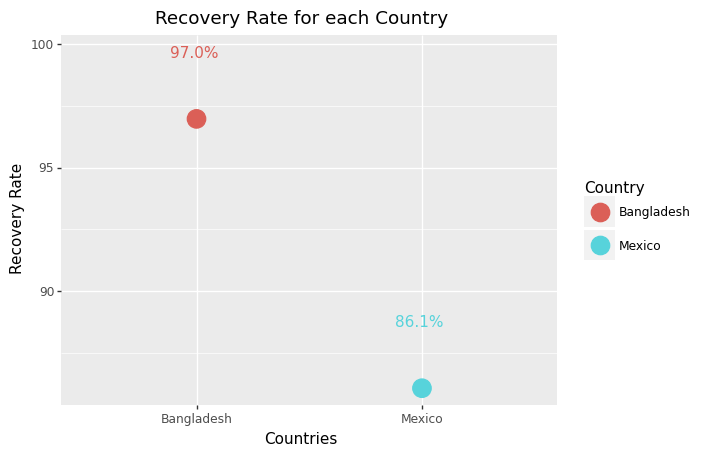

<ggplot: (8793499941482)>

In [ ]:
df_kg_filtered_scatter_plot = draw_scatter_plot(df_kg_filtered, "Recovery Rate for each Country")
df_kg_filtered_scatter_plot

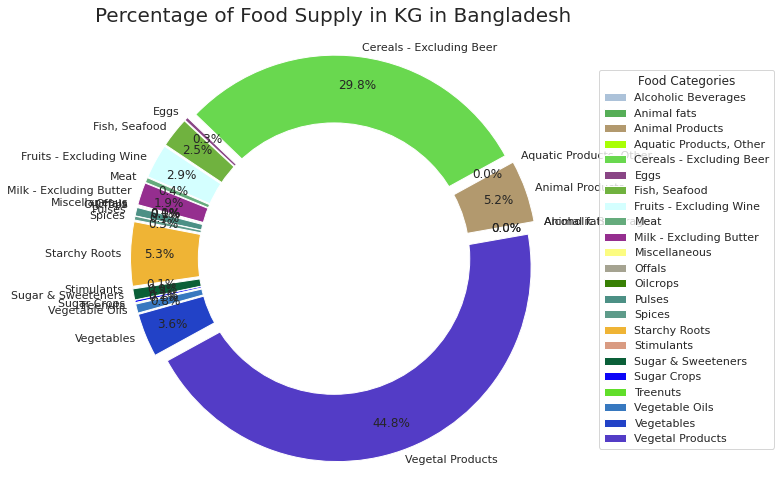

<Figure size 2160x2160 with 0 Axes>

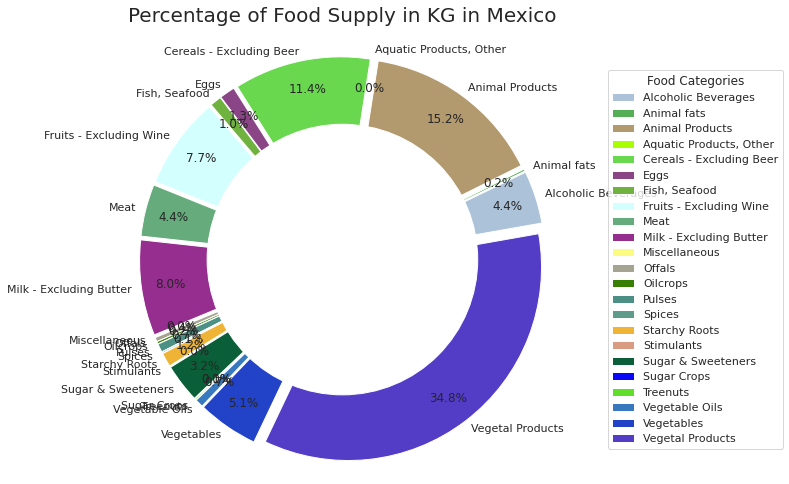

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_kg_c1_percentages_pie_chart = draw_pie_chart(df_kg_c1_percentages, df_c1_column_names, "Percentage of Food Supply in KG in "+c1)
df_kg_c2_percentages_pie_chart = draw_pie_chart(df_kg_c2_percentages, df_c2_column_names, "Percentage of Food Supply in KG in "+c2)

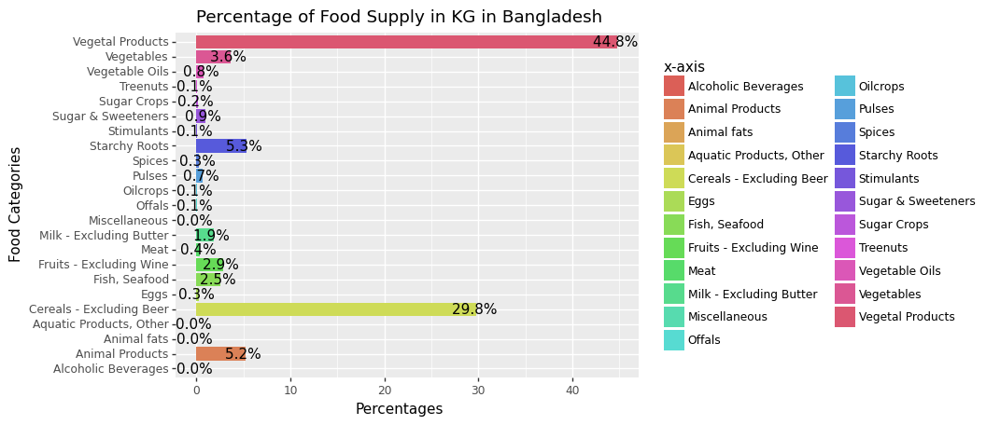

<ggplot: (8793504378232)>


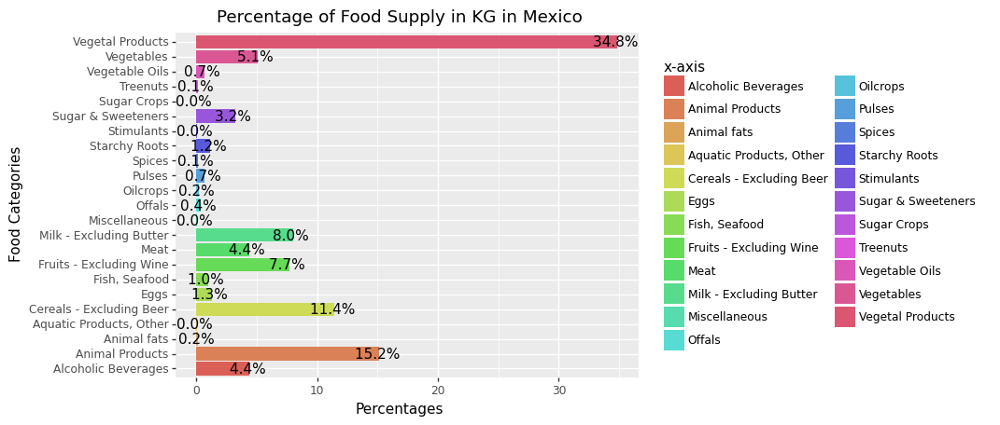

<ggplot: (-9223363243350434265)>


In [ ]:
df_kg_c1_percentages_bar_chart = draw_bar_chart(df_kg_c1_percentages, df_c1_column_names, "Percentage of Food Supply in KG in "+c1)
df_kg_c2_percentages_bar_chart = draw_bar_chart(df_kg_c2_percentages, df_c2_column_names, "Percentage of Food Supply in KG in "+c2)
print(df_kg_c1_percentages_bar_chart)
print(df_kg_c2_percentages_bar_chart)

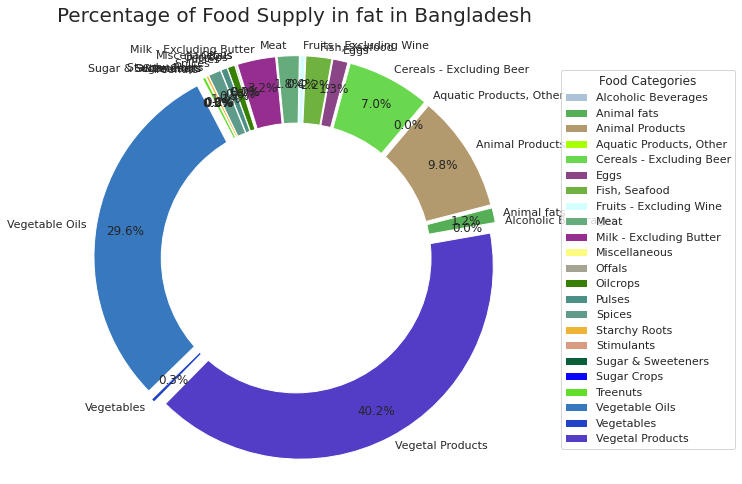

<Figure size 2160x2160 with 0 Axes>

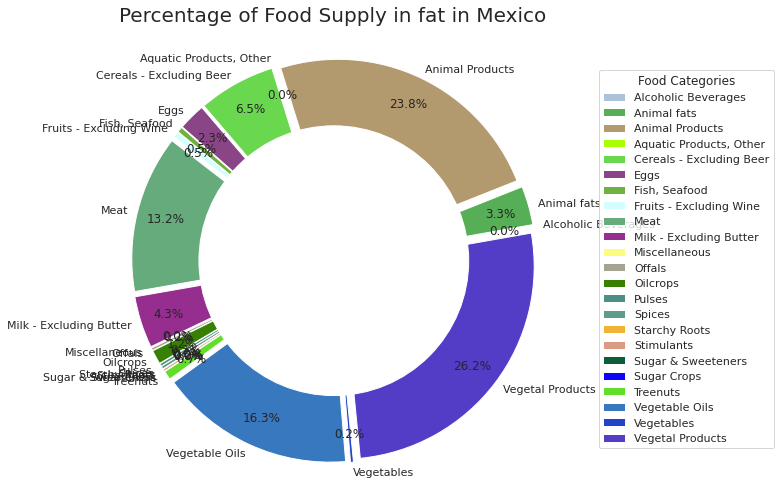

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_fat_c1_percentages_pie_chart = draw_pie_chart(df_fat_c1_percentages, df_c1_column_names, "Percentage of Food Supply in fat in "+c1)
df_fat_c2_percentages_pie_chart = draw_pie_chart(df_fat_c2_percentages, df_c2_column_names, "Percentage of Food Supply in fat in "+c2)

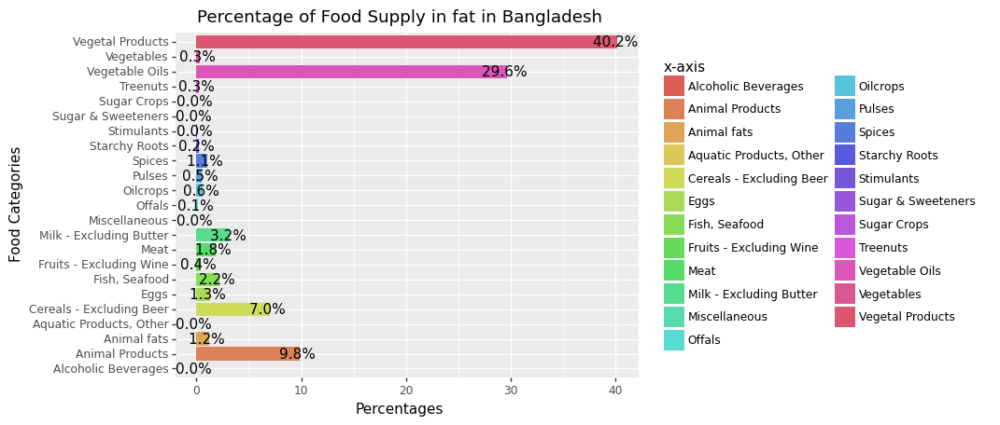

<ggplot: (8793499590632)>


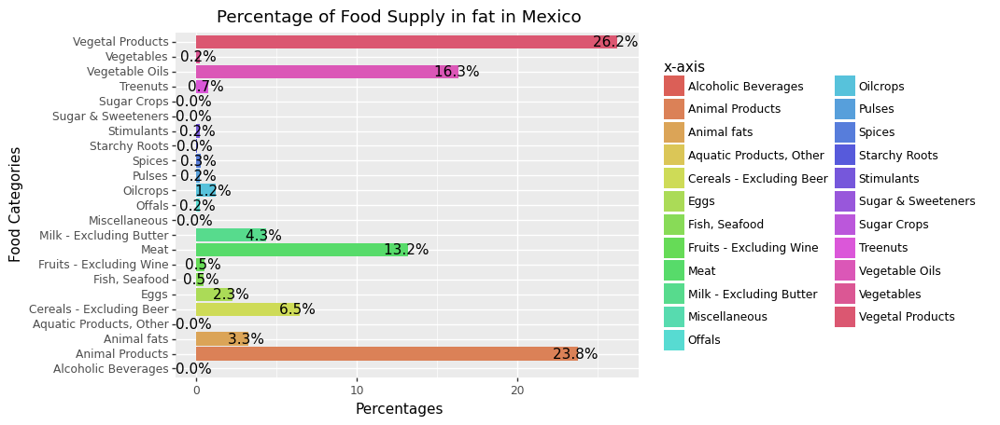

<ggplot: (8793499481327)>


In [ ]:
df_fat_c1_percentages_bar_chart = draw_bar_chart(df_fat_c1_percentages, df_c1_column_names, "Percentage of Food Supply in fat in "+c1)
df_fat_c2_percentages_bar_chart = draw_bar_chart(df_fat_c2_percentages, df_c2_column_names, "Percentage of Food Supply in fat in "+c2)
print(df_fat_c1_percentages_bar_chart)
print(df_fat_c2_percentages_bar_chart)

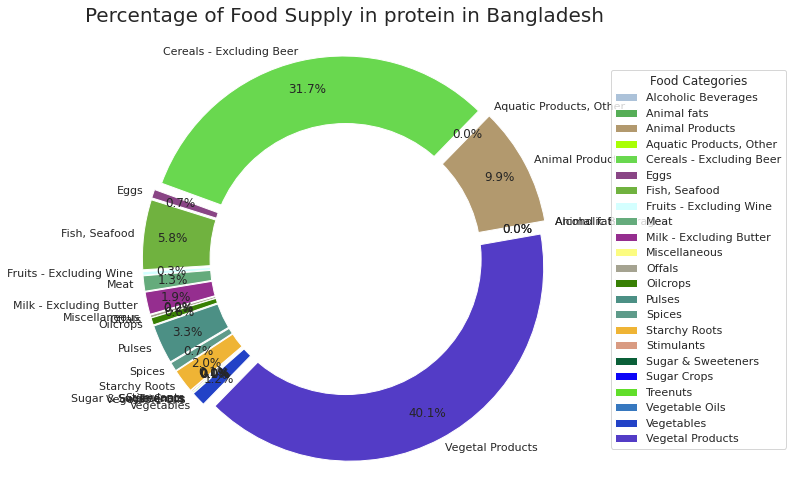

<Figure size 2160x2160 with 0 Axes>

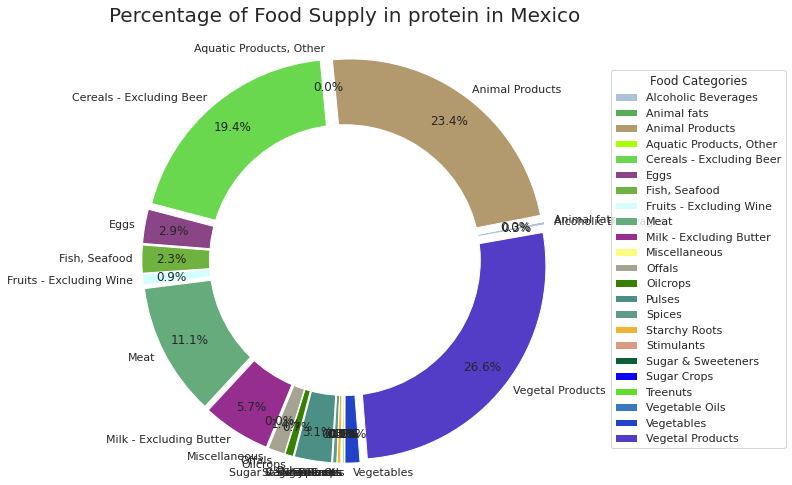

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_protein_c1_percentages_pie_chart = draw_pie_chart(df_protein_c1_percentages, df_c1_column_names, "Percentage of Food Supply in protein in "+c1)
df_protein_c2_percentages_pie_chart = draw_pie_chart(df_protein_c2_percentages, df_c2_column_names, "Percentage of Food Supply in protein in "+c2)

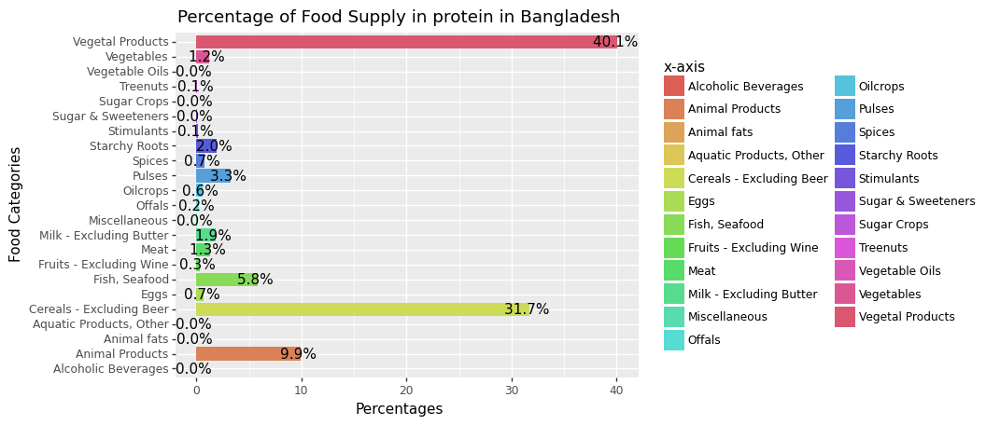

<ggplot: (8793499858745)>


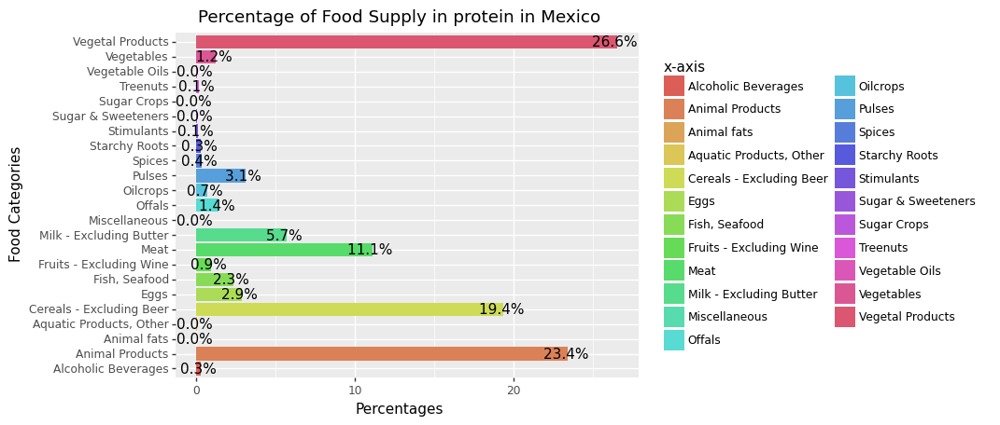

<ggplot: (8793499864573)>


In [ ]:
df_protein_c1_percentages_bar_chart = draw_bar_chart(df_protein_c1_percentages, df_c1_column_names, "Percentage of Food Supply in protein in "+c1)
df_protein_c2_percentages_bar_chart = draw_bar_chart(df_protein_c2_percentages, df_c2_column_names, "Percentage of Food Supply in protein in "+c2)
print(df_protein_c1_percentages_bar_chart)
print(df_protein_c2_percentages_bar_chart)

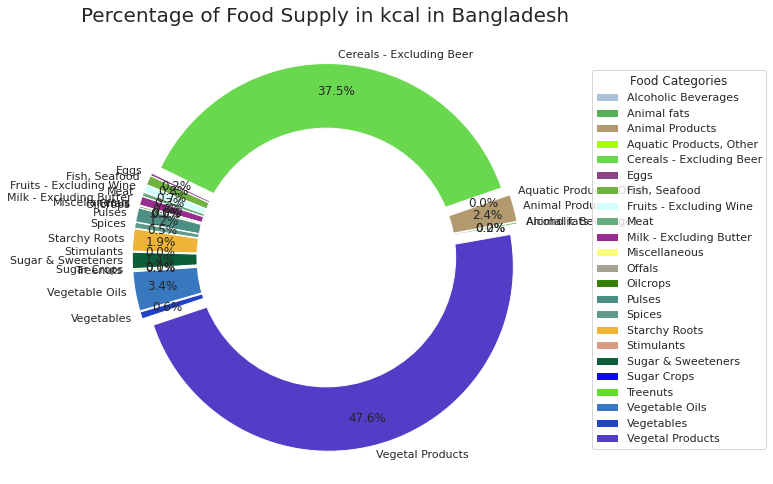

<Figure size 2160x2160 with 0 Axes>

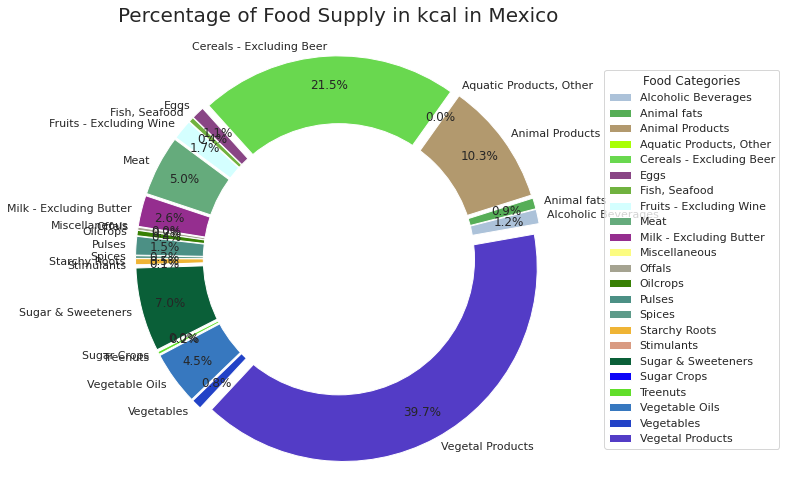

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_kcal_c1_percentages_pie_chart = draw_pie_chart(df_kcal_c1_percentages, df_c1_column_names, "Percentage of Food Supply in kcal in "+c1)
df_kcal_c2_percentages_pie_chart = draw_pie_chart(df_kcal_c2_percentages, df_c2_column_names, "Percentage of Food Supply in kcal in "+c2)

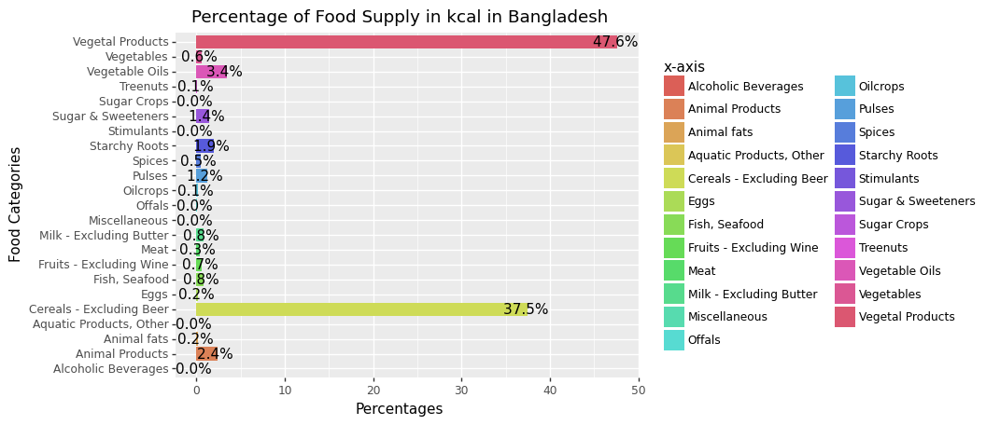

<ggplot: (-9223363243355035676)>


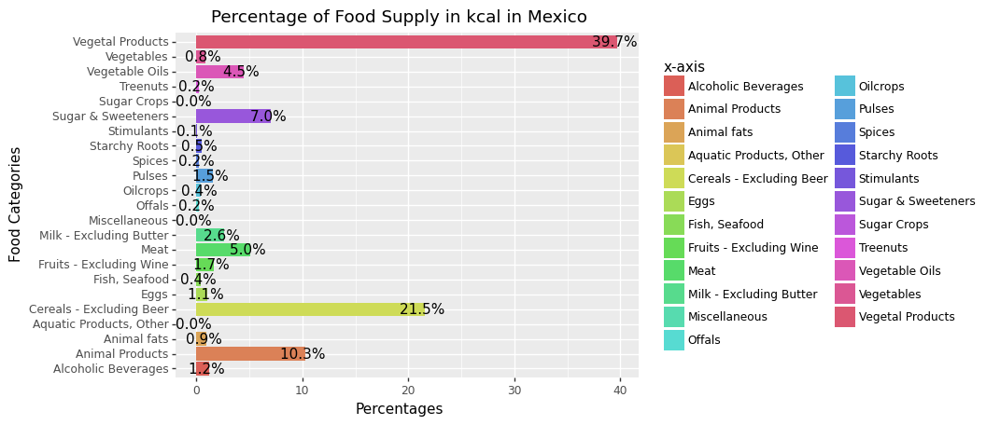

<ggplot: (8793499497669)>


In [ ]:
df_kcal_c1_percentages_bar_chart = draw_bar_chart(df_kcal_c1_percentages, df_c1_column_names, "Percentage of Food Supply in kcal in "+c1)
df_kcal_c2_percentages_bar_chart = draw_bar_chart(df_kcal_c2_percentages, df_c2_column_names, "Percentage of Food Supply in kcal in "+c2)
print(df_kcal_c1_percentages_bar_chart)
print(df_kcal_c2_percentages_bar_chart)

<p>The following table will describe about the top 5 most consumption sources for 4 different dataset for the countries Bangladesh and Mexico. It will also show the recovery rate of those countries.</p>

<table style="border-collapse: collapse; border: 1px black solid;">
  <tbody>
   <tr style="border-collapse: collapse; border: 1px black solid;">
       <th>Country/Food Supply</th>
       <th>Food Supply in KG</th>
       <th>Food Supply in Fat</th>
       <th>Food Supply in Protein</th>
       <th>Food Supply in Kcal</th>
       <th>Recovery Rate</th>
   </tr>
    <tr style="border-collapse: collapse; border: 1px black solid;">
        <td>Bangladesh</td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Beer</li>
            <li>Starchy Roots</li>
            <li>Animal Products</li>
            <li>Vegetables</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Vegetable Oils</li>
            <li>Animal Products</li>
            <li>Cereals - Excluding Beer</li>
            <li>Milk</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Beers</li>
            <li>Animal Products</li>
            <li>Fish</li>
            <li>Pulses</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Beer</li>
            <li>Vegetable Oils</li>
            <li>Animal Products</li>
            <li>Starchy Roots</li>
        </ul>
        </td>
        <td>97.0%</td>
    </tr>
    <tr>
        <td>Mexico</td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Animal Products</li>
            <li>Cereals - Excluding Beer</li>
            <li>Milk</li>
            <li>Fruits</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Animal Products</li>
            <li>Vegetable Oils</li>
            <li>Meat</li>
            <li>Cereals - Excluding Beer</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Animal Products</li>
            <li>Cereals - Excluding Butter</li>
            <li>Meat</li>
            <li>Milk - Excluding Butter</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Beer</li>
            <li>Animal Products</li>
            <li>Sugar & Sweeterners</li>
            <li>Meat</li>
        </ul>
        </td>
        <td>86.1%</td>
    </tr>
  </tbody>
</table>

In [ ]:
c1 = "South Africa"
c2 = "Italy"
df_kg_filtered, df_kcal_filtered, df_fat_filtered,  df_protein_filtered, df_kg_c1, df_kcal_c1, df_fat_c1, df_protein_c1, df_kg_c2, df_kcal_c2, df_fat_c2, df_protein_c2, df_c1_column_names, df_kg_c1_percentages, df_kcal_c1_percentages, df_fat_c1_percentages, df_protein_c1_percentages, df_c2_column_names, df_kg_c2_percentages, df_kcal_c2_percentages, df_fat_c2_percentages, df_protein_c2_percentages = get_data_for_two_countries(c1, c2)

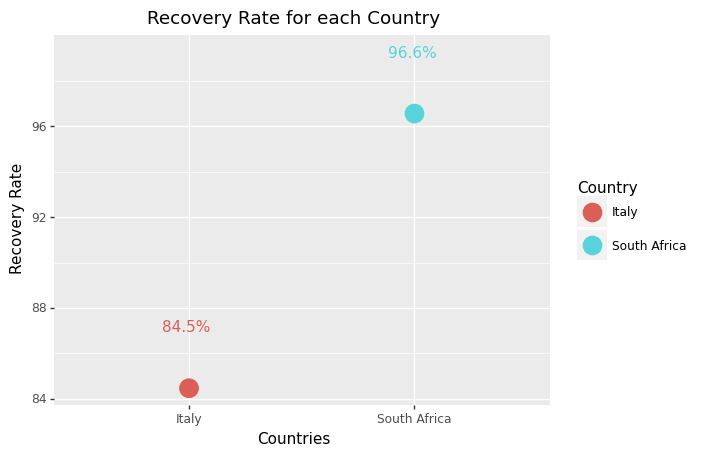

<ggplot: (-9223363243354738828)>

In [ ]:
df_kg_filtered_scatter_plot = draw_scatter_plot(df_kg_filtered, "Recovery Rate for each Country")
df_kg_filtered_scatter_plot

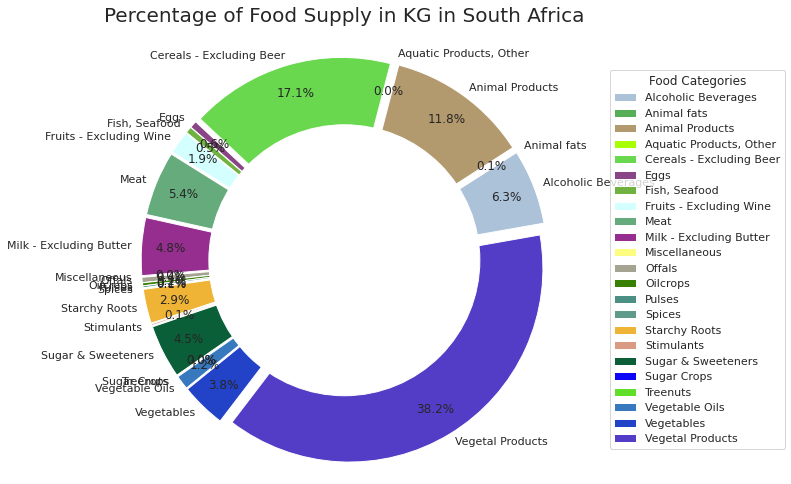

<Figure size 2160x2160 with 0 Axes>

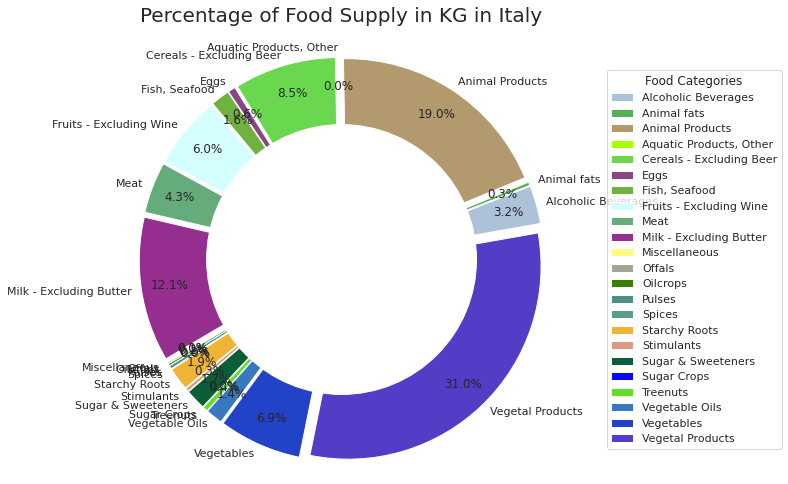

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_kg_c1_percentages_pie_chart = draw_pie_chart(df_kg_c1_percentages, df_c1_column_names, "Percentage of Food Supply in KG in "+c1)
df_kg_c2_percentages_pie_chart = draw_pie_chart(df_kg_c2_percentages, df_c2_column_names, "Percentage of Food Supply in KG in "+c2)

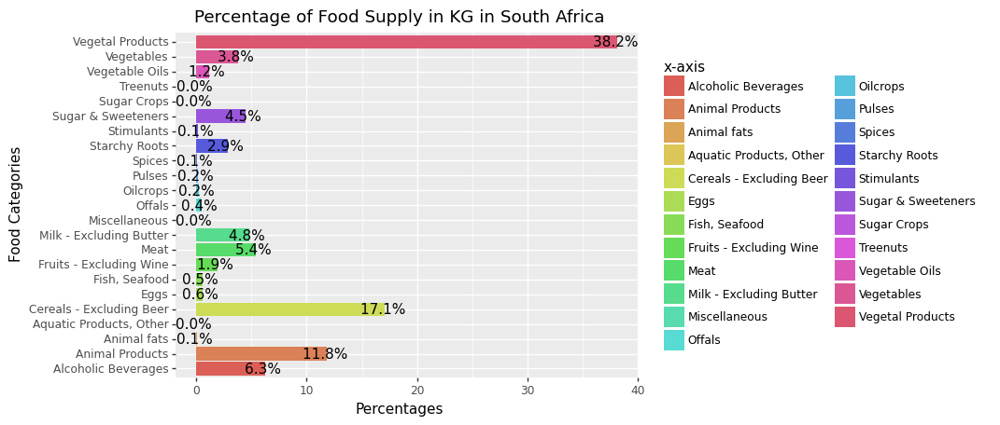

<ggplot: (8793499736391)>


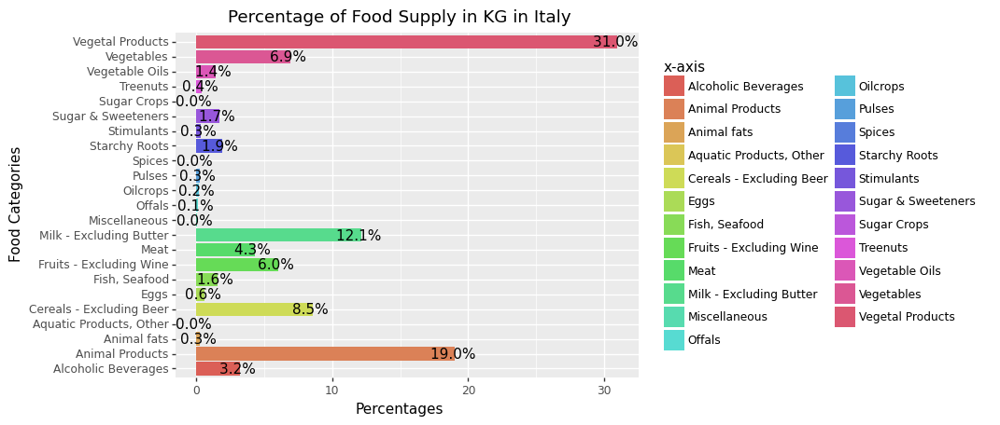

<ggplot: (8793499847670)>


In [ ]:
df_kg_c1_percentages_bar_chart = draw_bar_chart(df_kg_c1_percentages, df_c1_column_names, "Percentage of Food Supply in KG in "+c1)
df_kg_c2_percentages_bar_chart = draw_bar_chart(df_kg_c2_percentages, df_c2_column_names, "Percentage of Food Supply in KG in "+c2)
print(df_kg_c1_percentages_bar_chart)
print(df_kg_c2_percentages_bar_chart)

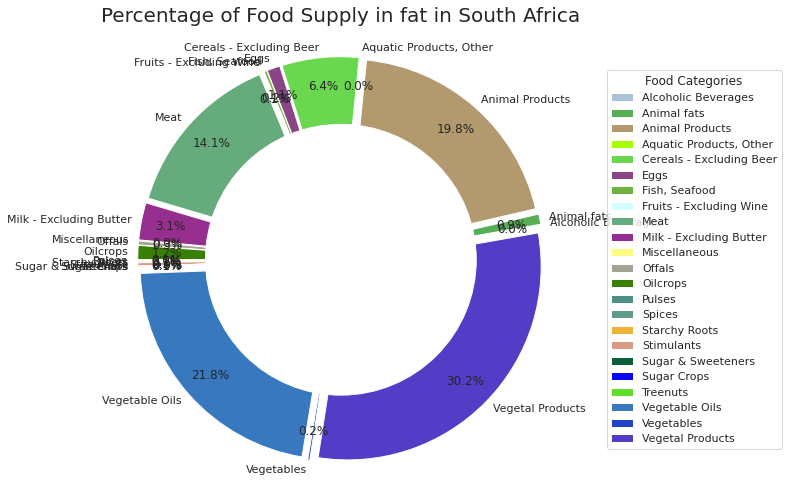

<Figure size 2160x2160 with 0 Axes>

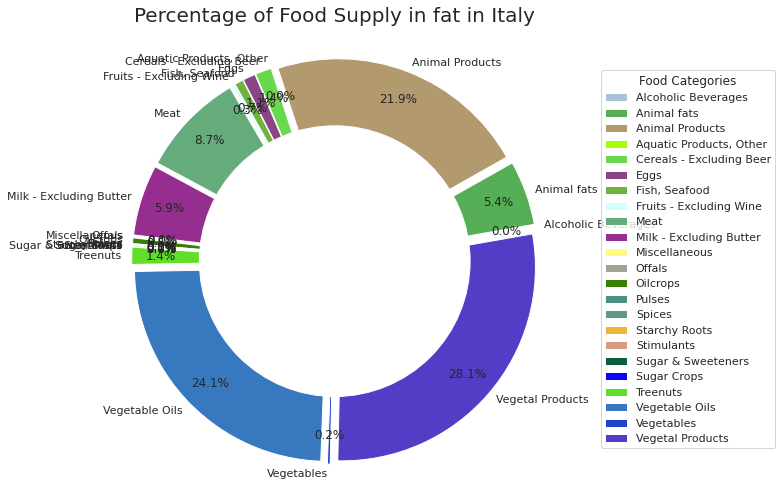

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_fat_c1_percentages_pie_chart = draw_pie_chart(df_fat_c1_percentages, df_c1_column_names, "Percentage of Food Supply in fat in "+c1)
df_fat_c2_percentages_pie_chart = draw_pie_chart(df_fat_c2_percentages, df_c2_column_names, "Percentage of Food Supply in fat in "+c2)

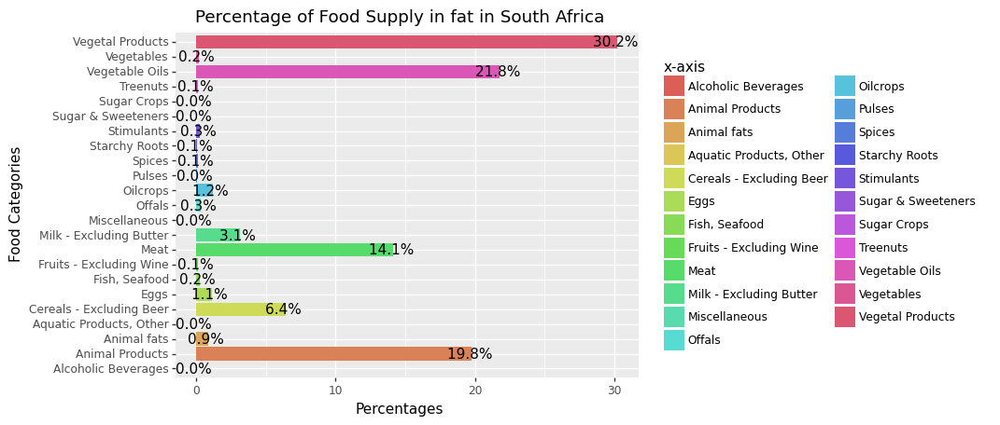

<ggplot: (-9223363243355526165)>


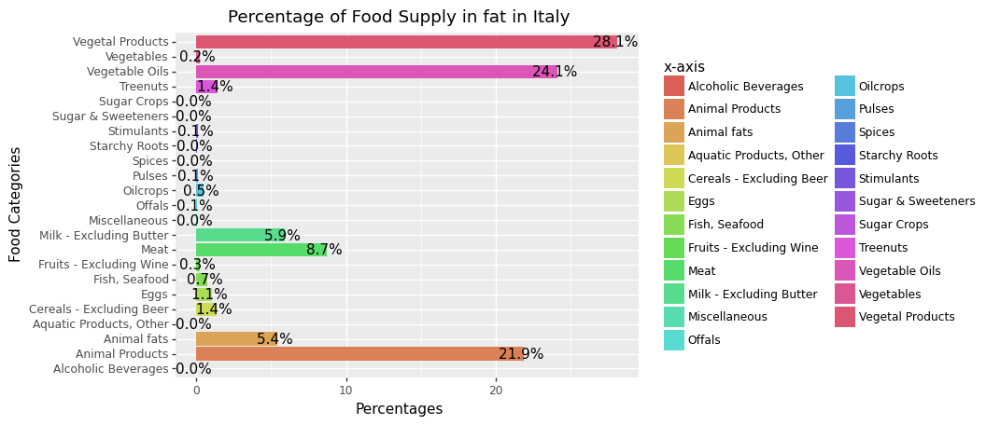

<ggplot: (8793499249633)>


In [ ]:
df_fat_c1_percentages_bar_chart = draw_bar_chart(df_fat_c1_percentages, df_c1_column_names, "Percentage of Food Supply in fat in "+c1)
df_fat_c2_percentages_bar_chart = draw_bar_chart(df_fat_c2_percentages, df_c2_column_names, "Percentage of Food Supply in fat in "+c2)
print(df_fat_c1_percentages_bar_chart)
print(df_fat_c2_percentages_bar_chart)

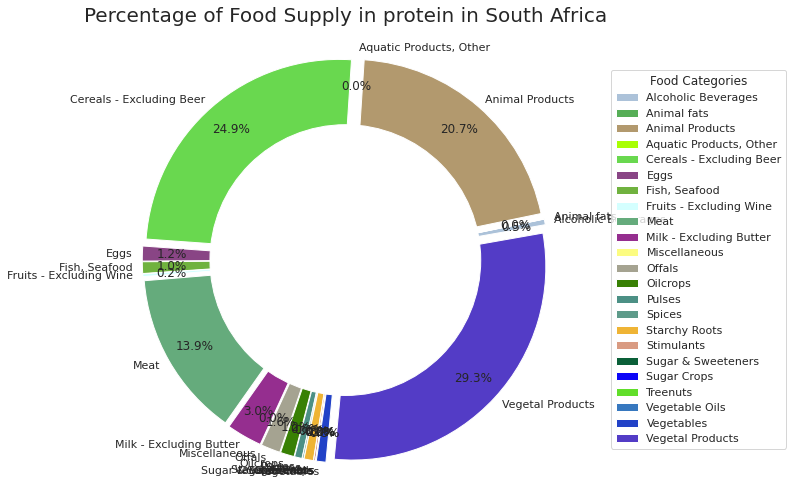

<Figure size 2160x2160 with 0 Axes>

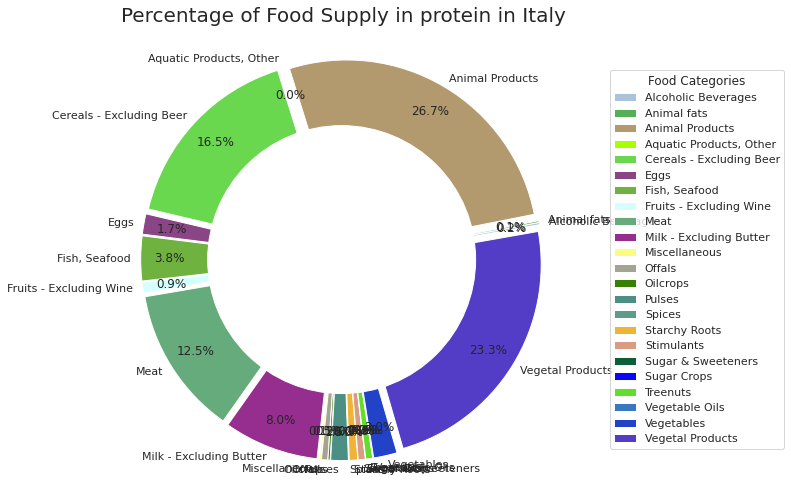

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_protein_c1_percentages_pie_chart = draw_pie_chart(df_protein_c1_percentages, df_c1_column_names, "Percentage of Food Supply in protein in "+c1)
df_protein_c2_percentages_pie_chart = draw_pie_chart(df_protein_c2_percentages, df_c2_column_names, "Percentage of Food Supply in protein in "+c2)

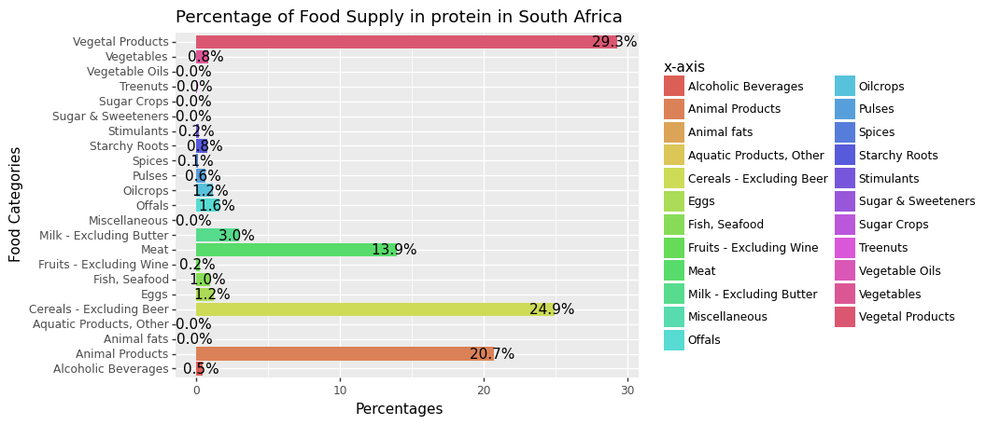

<ggplot: (8793499396314)>


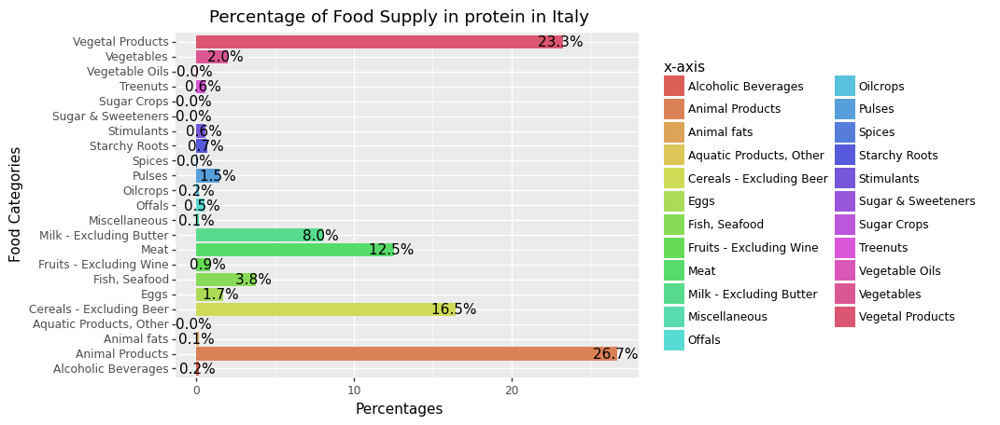

<ggplot: (8793499620742)>


In [ ]:
df_protein_c1_percentages_bar_chart = draw_bar_chart(df_protein_c1_percentages, df_c1_column_names, "Percentage of Food Supply in protein in "+c1)
df_protein_c2_percentages_bar_chart = draw_bar_chart(df_protein_c2_percentages, df_c2_column_names, "Percentage of Food Supply in protein in "+c2)
print(df_protein_c1_percentages_bar_chart)
print(df_protein_c2_percentages_bar_chart)

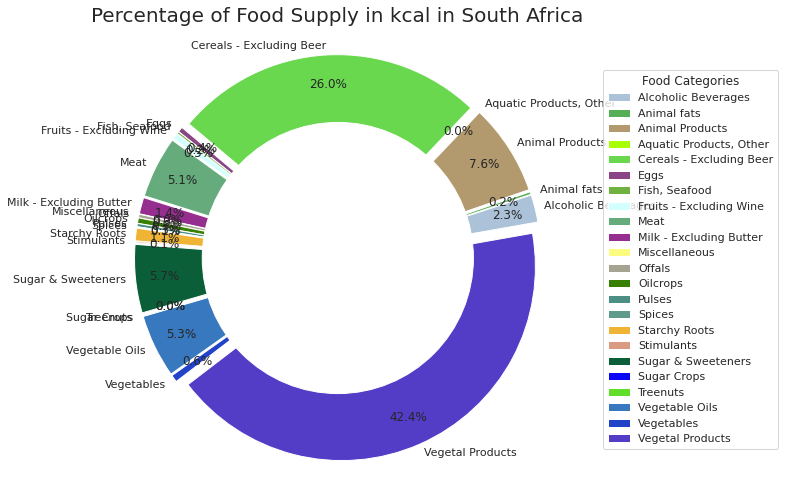

<Figure size 2160x2160 with 0 Axes>

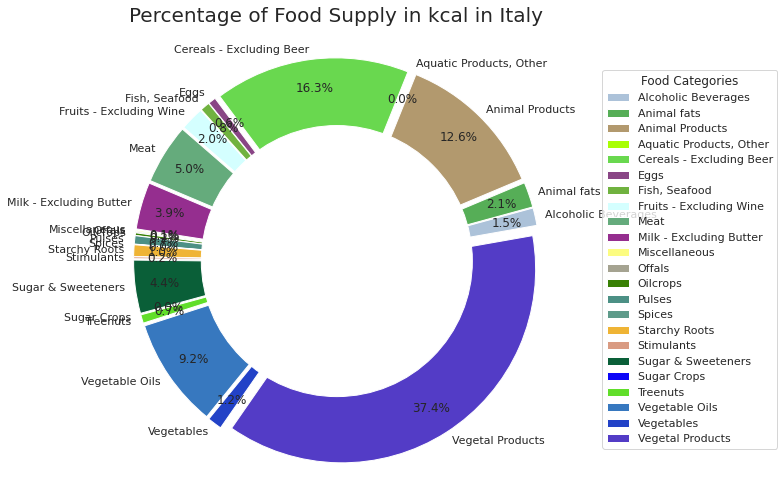

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_kcal_c1_percentages_pie_chart = draw_pie_chart(df_kcal_c1_percentages, df_c1_column_names, "Percentage of Food Supply in kcal in "+c1)
df_kcal_c2_percentages_pie_chart = draw_pie_chart(df_kcal_c2_percentages, df_c2_column_names, "Percentage of Food Supply in kcal in "+c2)

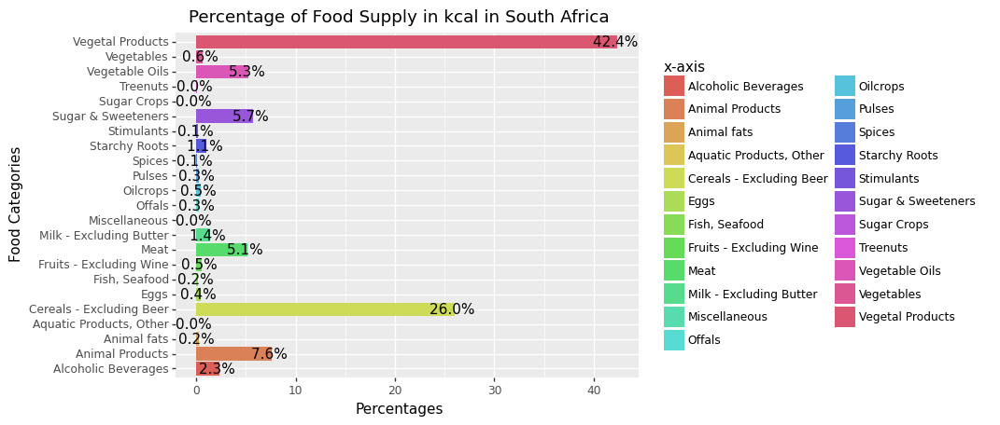

<ggplot: (-9223363243352055408)>


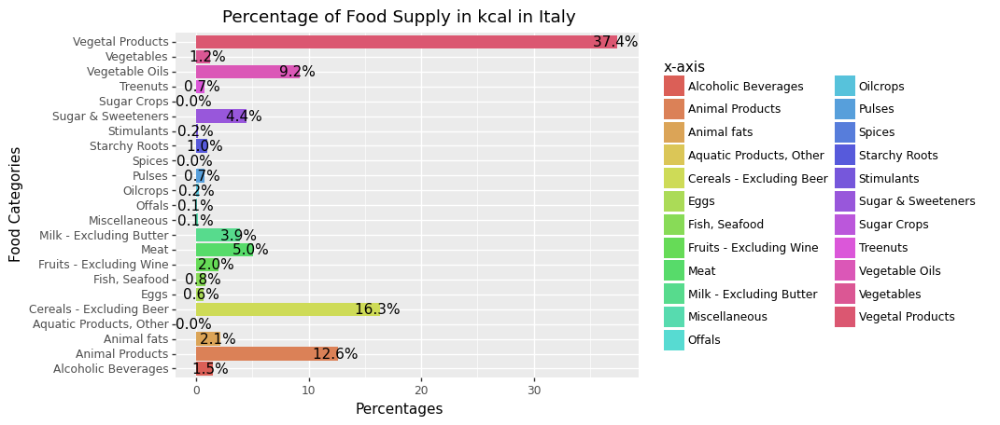

<ggplot: (8793499522238)>


In [ ]:
df_kcal_c1_percentages_bar_chart = draw_bar_chart(df_kcal_c1_percentages, df_c1_column_names, "Percentage of Food Supply in kcal in "+c1)
df_kcal_c2_percentages_bar_chart = draw_bar_chart(df_kcal_c2_percentages, df_c2_column_names, "Percentage of Food Supply in kcal in "+c2)
print(df_kcal_c1_percentages_bar_chart)
print(df_kcal_c2_percentages_bar_chart)

<p>The following table will describe about the top 5 most consumption sources for 4 different dataset for the countries South Africa and Italy. It will also show the recovery rate of those countries.</p>

<table style="border-collapse: collapse; border: 1px black solid;">
  <tbody>
   <tr style="border-collapse: collapse; border: 1px black solid;">
       <th>Country/Food Supply</th>
       <th>Food Supply in KG</th>
       <th>Food Supply in Fat</th>
       <th>Food Supply in Protein</th>
       <th>Food Supply in Kcal</th>
       <th>Recovery Rate</th>
   </tr>
    <tr style="border-collapse: collapse; border: 1px black solid;">
        <td>South Africa</td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Beer</li>
            <li>Animal Products</li>
            <li>Alcoholic Beverages</li>
            <li>Meat</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Vegetable Oils</li>
            <li>Animal Products</li>
            <li>Meat</li>
            <li>Cereals - Excluding Beer</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Beers</li>
            <li>Animal Products</li>
            <li>Meat</li>
            <li>Milk</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Beer</li>
            <li>Animal Products</li>
            <li> Sugar & Sweeteners</li>
            <li>Vegetable Oils</li>
        </ul>
        </td>
        <td>96.6%</td>
    </tr>
    <tr>
        <td>Italy</td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Animal Products</li>
            <li>Milk</li>
            <li>Vegetables</li>
            <li>Cereals - Excluding Beer</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Vegetable Oils</li>
            <li>Animal Products</li>
            <li>Meat</li>
            <li>Milk - Excluding Butter</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Animal Products</li>
            <li>Cereals - Excluding Butter</li>
            <li>Meat</li>
            <li>Milk - Excluding Butter</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Beer</li>
            <li>Animal Products</li>
            <li>Vegetable Oils</li>
            <li>Meat</li>
        </ul>
        </td>
        <td>84.5%</td>
    </tr>
  </tbody>
</table>

In [ ]:
c1 = "Pakistan"
c2 = "Spain"
df_kg_filtered, df_kcal_filtered, df_fat_filtered,  df_protein_filtered, df_kg_c1, df_kcal_c1, df_fat_c1, df_protein_c1, df_kg_c2, df_kcal_c2, df_fat_c2, df_protein_c2, df_c1_column_names, df_kg_c1_percentages, df_kcal_c1_percentages, df_fat_c1_percentages, df_protein_c1_percentages, df_c2_column_names, df_kg_c2_percentages, df_kcal_c2_percentages, df_fat_c2_percentages, df_protein_c2_percentages = get_data_for_two_countries(c1, c2)

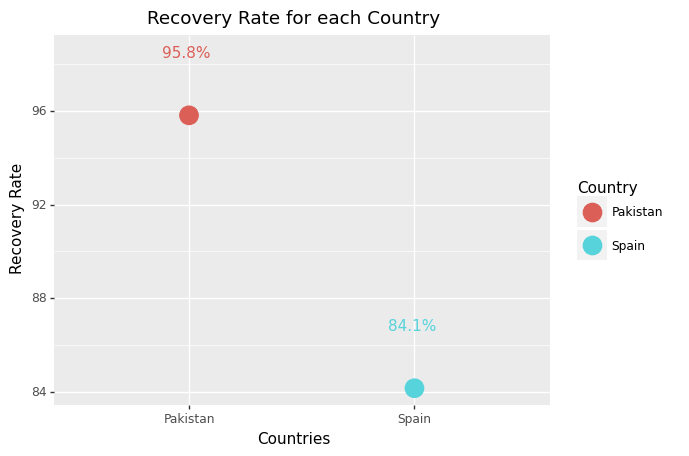

<ggplot: (8793502691227)>

In [ ]:
df_kg_filtered_scatter_plot = draw_scatter_plot(df_kg_filtered, "Recovery Rate for each Country")
df_kg_filtered_scatter_plot

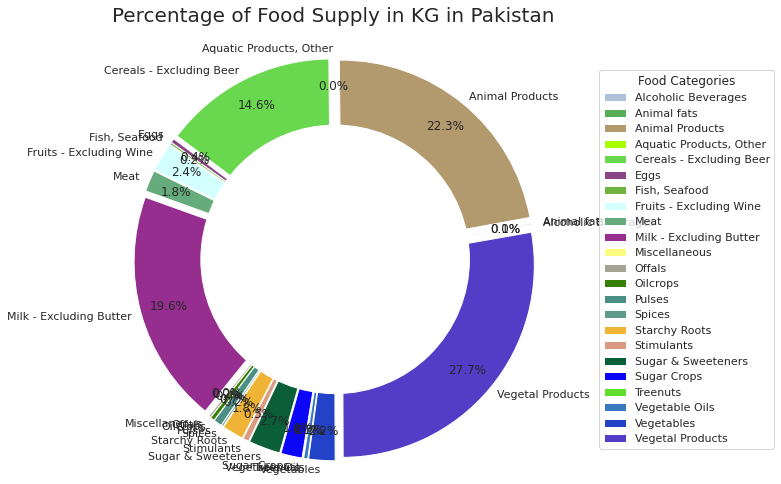

<Figure size 2160x2160 with 0 Axes>

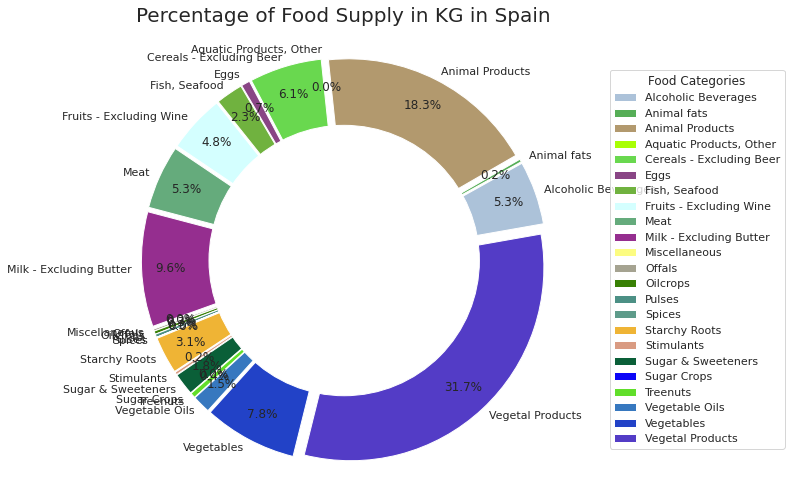

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_kg_c1_percentages_pie_chart = draw_pie_chart(df_kg_c1_percentages, df_c1_column_names, "Percentage of Food Supply in KG in "+c1)
df_kg_c2_percentages_pie_chart = draw_pie_chart(df_kg_c2_percentages, df_c2_column_names, "Percentage of Food Supply in KG in "+c2)

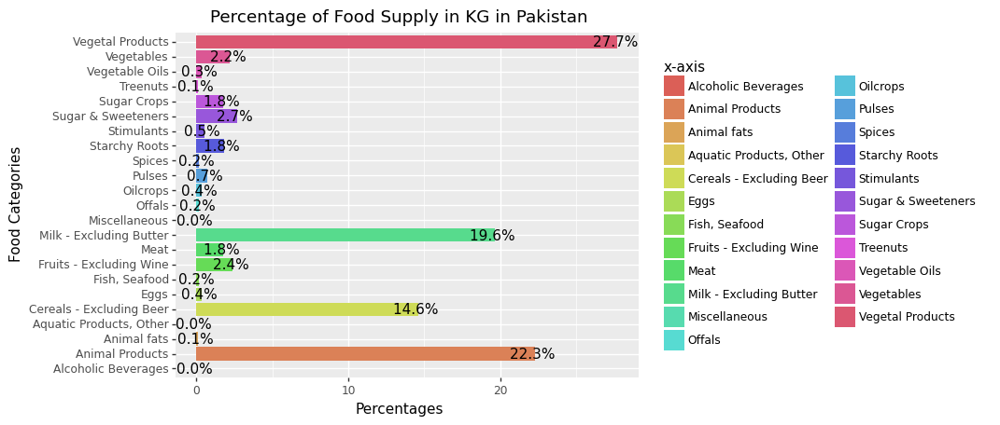

<ggplot: (-9223363243355233045)>


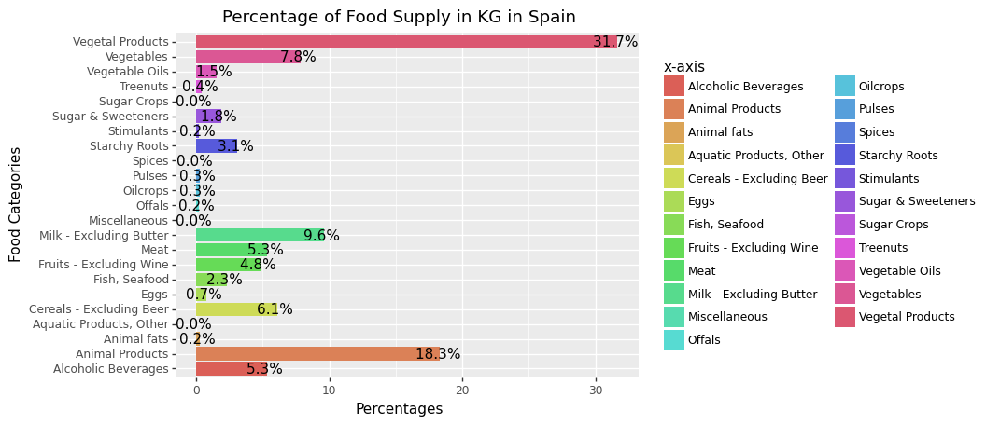

<ggplot: (-9223363243354825363)>


In [ ]:
df_kg_c1_percentages_bar_chart = draw_bar_chart(df_kg_c1_percentages, df_c1_column_names, "Percentage of Food Supply in KG in "+c1)
df_kg_c2_percentages_bar_chart = draw_bar_chart(df_kg_c2_percentages, df_c2_column_names, "Percentage of Food Supply in KG in "+c2)
print(df_kg_c1_percentages_bar_chart)
print(df_kg_c2_percentages_bar_chart)

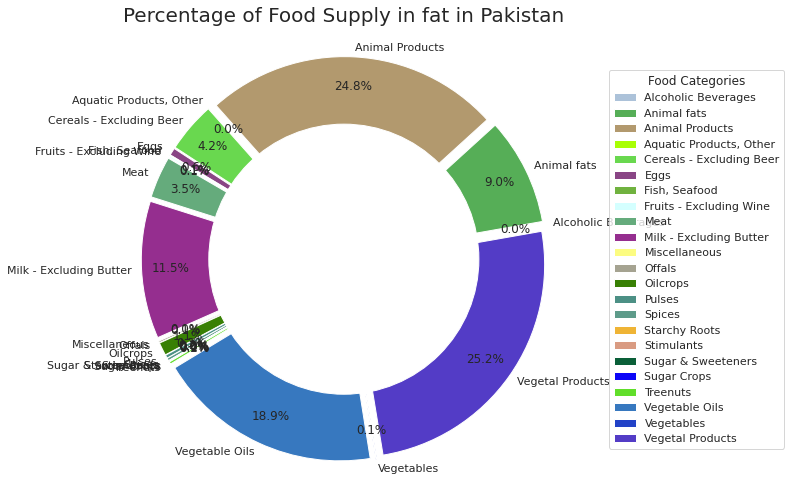

<Figure size 2160x2160 with 0 Axes>

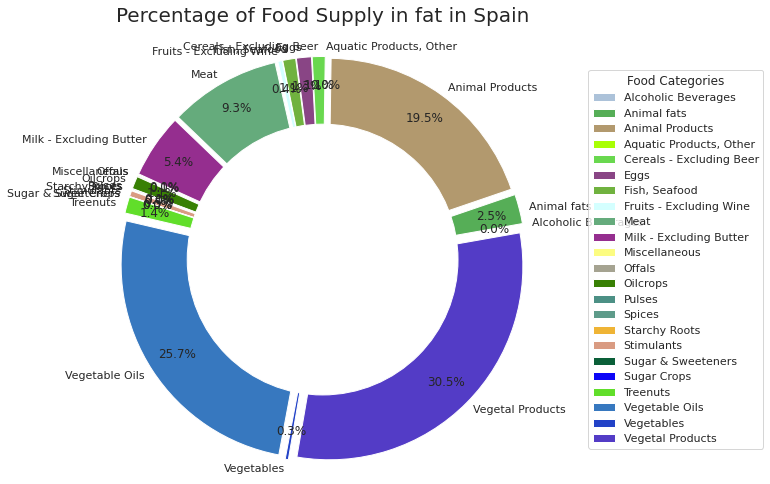

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_fat_c1_percentages_pie_chart = draw_pie_chart(df_fat_c1_percentages, df_c1_column_names, "Percentage of Food Supply in fat in "+c1)
df_fat_c2_percentages_pie_chart = draw_pie_chart(df_fat_c2_percentages, df_c2_column_names, "Percentage of Food Supply in fat in "+c2)

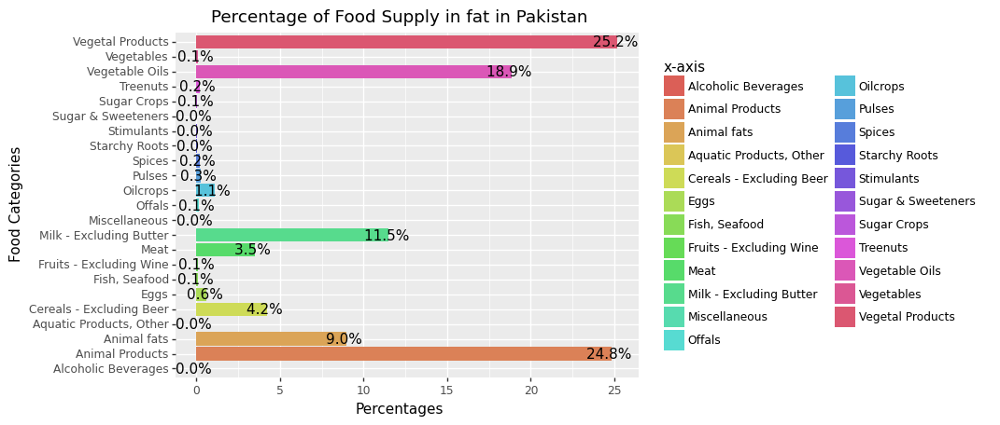

<ggplot: (-9223363243355058821)>


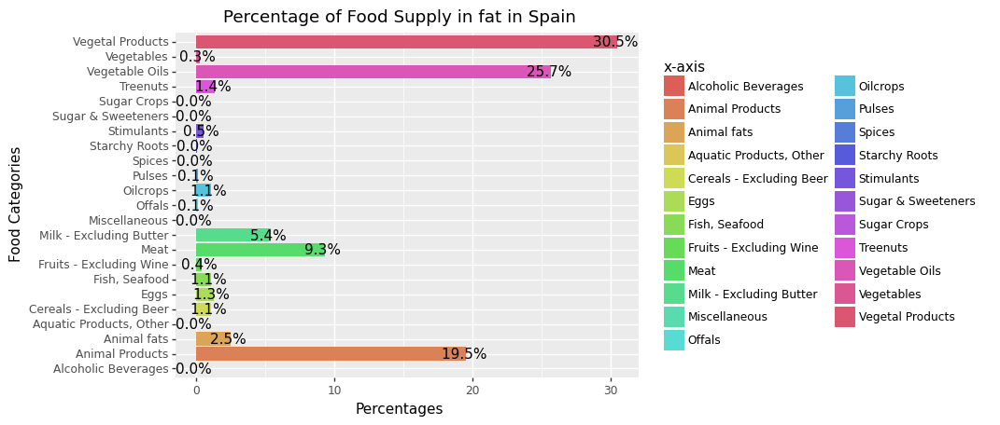

<ggplot: (-9223363243355013344)>


In [ ]:
df_fat_c1_percentages_bar_chart = draw_bar_chart(df_fat_c1_percentages, df_c1_column_names, "Percentage of Food Supply in fat in "+c1)
df_fat_c2_percentages_bar_chart = draw_bar_chart(df_fat_c2_percentages, df_c2_column_names, "Percentage of Food Supply in fat in "+c2)
print(df_fat_c1_percentages_bar_chart)
print(df_fat_c2_percentages_bar_chart)

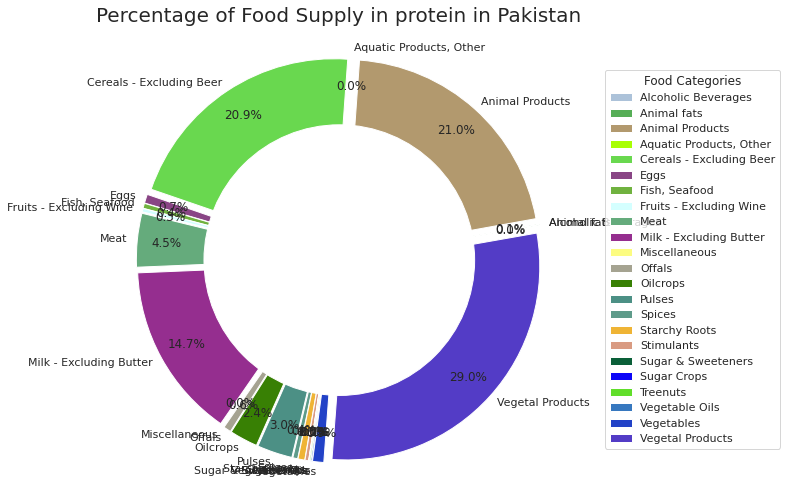

<Figure size 2160x2160 with 0 Axes>

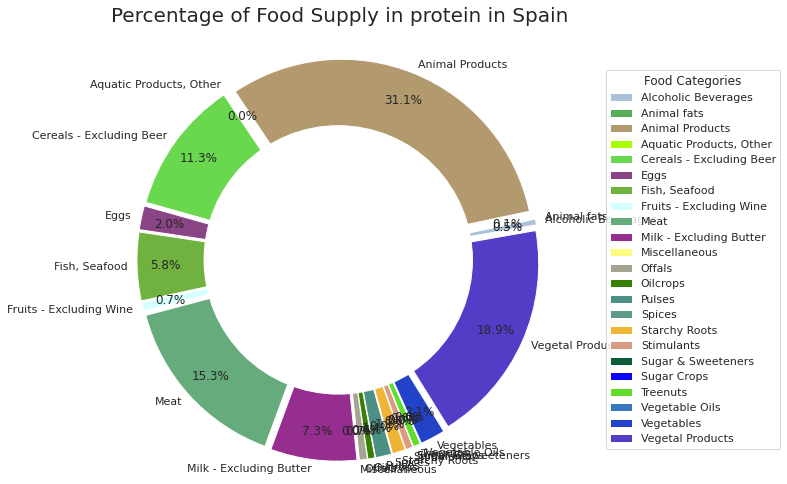

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_protein_c1_percentages_pie_chart = draw_pie_chart(df_protein_c1_percentages, df_c1_column_names, "Percentage of Food Supply in protein in "+c1)
df_protein_c2_percentages_pie_chart = draw_pie_chart(df_protein_c2_percentages, df_c2_column_names, "Percentage of Food Supply in protein in "+c2)

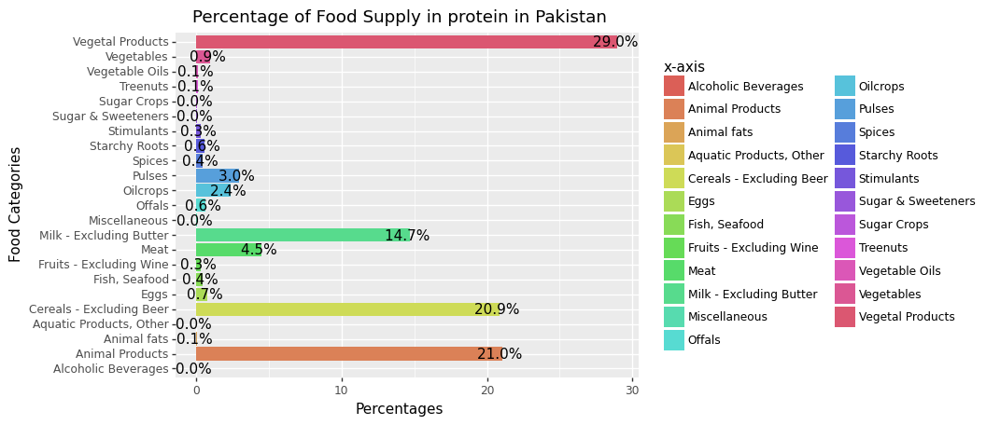

<ggplot: (8793505820785)>


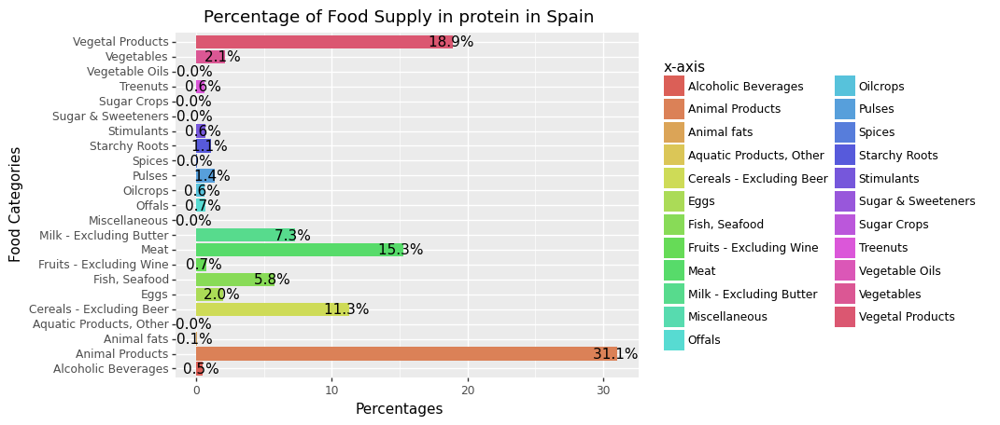

<ggplot: (-9223363243350022982)>


In [ ]:
df_protein_c1_percentages_bar_chart = draw_bar_chart(df_protein_c1_percentages, df_c1_column_names, "Percentage of Food Supply in protein in "+c1)
df_protein_c2_percentages_bar_chart = draw_bar_chart(df_protein_c2_percentages, df_c2_column_names, "Percentage of Food Supply in protein in "+c2)
print(df_protein_c1_percentages_bar_chart)
print(df_protein_c2_percentages_bar_chart)

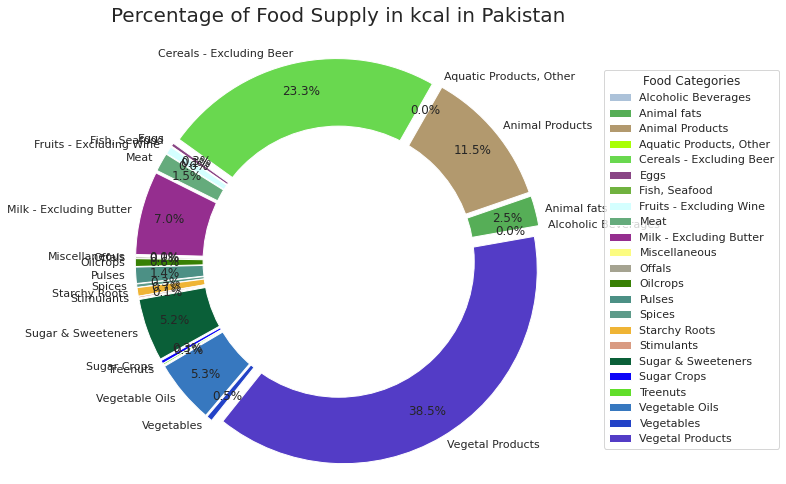

<Figure size 2160x2160 with 0 Axes>

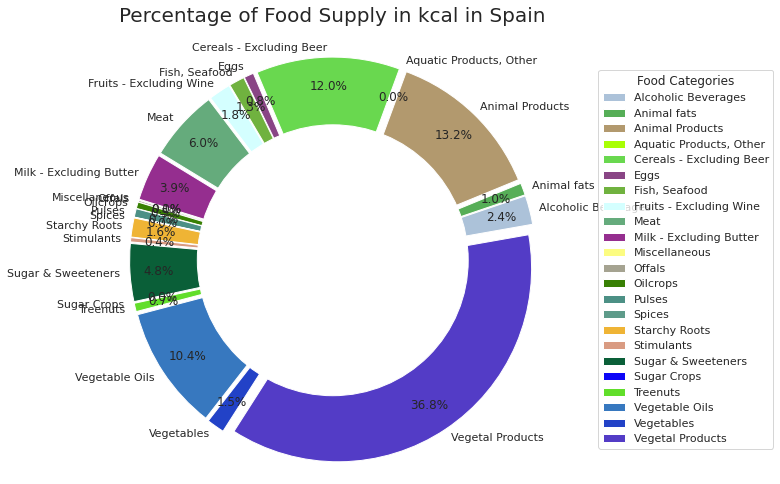

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_kcal_c1_percentages_pie_chart = draw_pie_chart(df_kcal_c1_percentages, df_c1_column_names, "Percentage of Food Supply in kcal in "+c1)
df_kcal_c2_percentages_pie_chart = draw_pie_chart(df_kcal_c2_percentages, df_c2_column_names, "Percentage of Food Supply in kcal in "+c2)

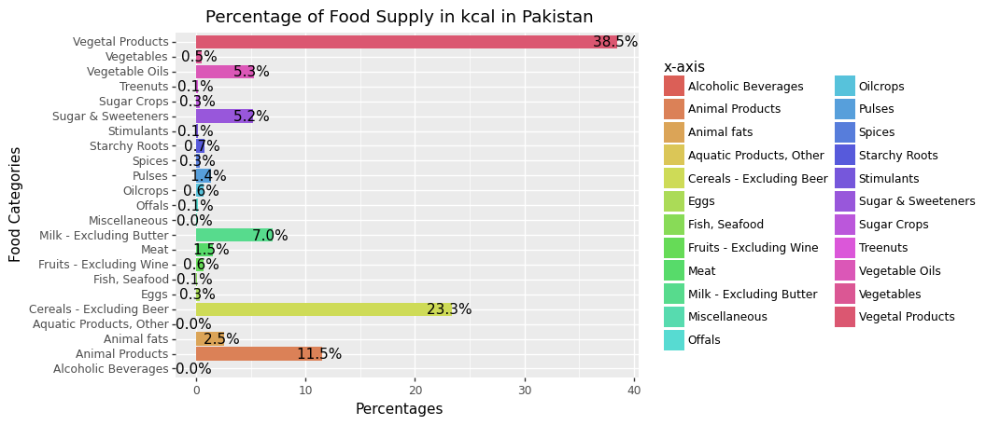

<ggplot: (-9223363243350387887)>


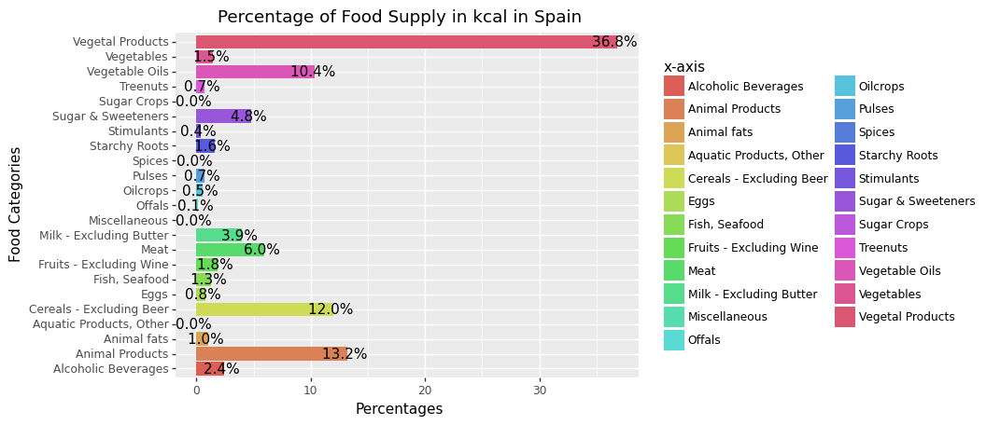

<ggplot: (8793504334186)>


In [ ]:
df_kcal_c1_percentages_bar_chart = draw_bar_chart(df_kcal_c1_percentages, df_c1_column_names, "Percentage of Food Supply in kcal in "+c1)
df_kcal_c2_percentages_bar_chart = draw_bar_chart(df_kcal_c2_percentages, df_c2_column_names, "Percentage of Food Supply in kcal in "+c2)
print(df_kcal_c1_percentages_bar_chart)
print(df_kcal_c2_percentages_bar_chart)

<p>The following table will describe about the top 5 most consumption sources for 4 different dataset for the countries Pakistan and Spain. It will also show the recovery rate of those countries.</p>

<table style="border-collapse: collapse; border: 1px black solid;">
  <tbody>
   <tr style="border-collapse: collapse; border: 1px black solid;">
       <th>Country/Food Supply</th>
       <th>Food Supply in KG</th>
       <th>Food Supply in Fat</th>
       <th>Food Supply in Protein</th>
       <th>Food Supply in Kcal</th>
       <th>Recovery Rate</th>
   </tr>
    <tr style="border-collapse: collapse; border: 1px black solid;">
        <td>Pakistan</td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Animal Products</li>
            <li>Milk</li>
            <li>Cereals - Excluding Beer</li>
            <li>Sugar & Sweeteners</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Animal Products</li>
            <li>Vegetable Oils</li>
            <li>Meat</li>
            <li>Animal Fats</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Animal Products</li>
            <li>Cereals - Excluding Beers</li>
            <li>Milk</li>
            <li>Meat</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Beer</li>
            <li>Animal Products</li>
            <li>Milk</li>
            <li>Vegetable Oils</li>
        </ul>
        </td>
        <td>95.8%</td>
    </tr>
    <tr>
        <td>Spain</td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Animal Products</li>
            <li>Milk</li>
            <li>Vegetables</li>
            <li>Cereals - Excluding Beer</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Vegetable Oils</li>
            <li>Animal Products</li>
            <li>Meat</li>
            <li>Milk - Excluding Butter</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Animal Products</li>
            <li>Vegetal Products</li>
            <li>Meat</li>
            <li>Cereals - Excluding Butter</li>
            <li>Milk - Excluding Butter</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Animal Products</li>
            <li>Cereals - Excluding Beer</li>
            <li>Vegetable Oils</li>
            <li>Meat</li>
        </ul>
        </td>
        <td>84.1%</td>
    </tr>
  </tbody>
</table>

In [ ]:
c1 = "Germany"
c2 = "United States of America"
df_kg_filtered, df_kcal_filtered, df_fat_filtered,  df_protein_filtered, df_kg_c1, df_kcal_c1, df_fat_c1, df_protein_c1, df_kg_c2, df_kcal_c2, df_fat_c2, df_protein_c2, df_c1_column_names, df_kg_c1_percentages, df_kcal_c1_percentages, df_fat_c1_percentages, df_protein_c1_percentages, df_c2_column_names, df_kg_c2_percentages, df_kcal_c2_percentages, df_fat_c2_percentages, df_protein_c2_percentages = get_data_for_two_countries(c1, c2)

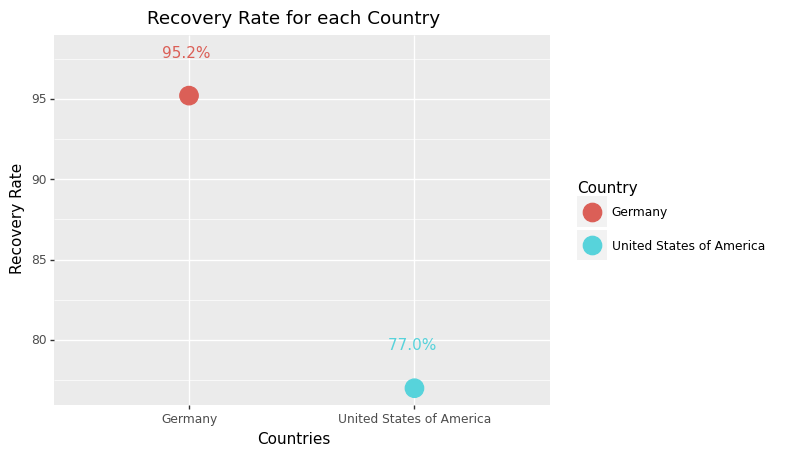

<ggplot: (8793500031229)>

In [ ]:
df_kg_filtered_scatter_plot = draw_scatter_plot(df_kg_filtered, "Recovery Rate for each Country")
df_kg_filtered_scatter_plot

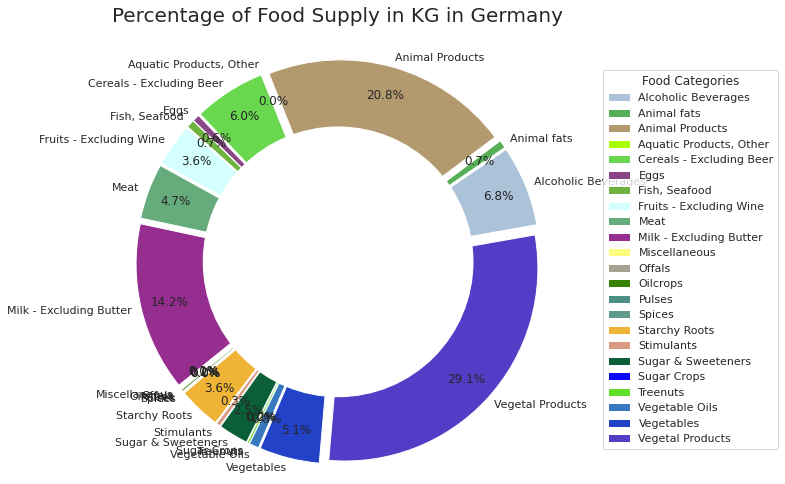

<Figure size 2160x2160 with 0 Axes>

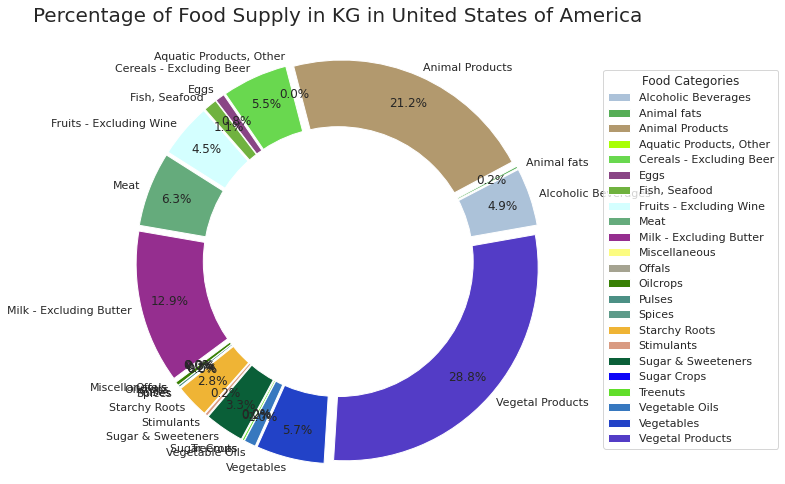

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_kg_c1_percentages_pie_chart = draw_pie_chart(df_kg_c1_percentages, df_c1_column_names, "Percentage of Food Supply in KG in "+c1)
df_kg_c2_percentages_pie_chart = draw_pie_chart(df_kg_c2_percentages, df_c2_column_names, "Percentage of Food Supply in KG in "+c2)

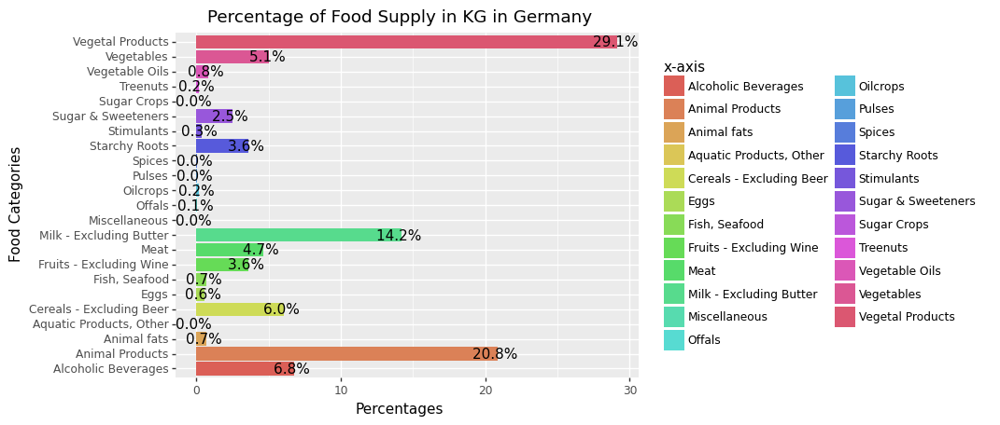

<ggplot: (-9223363243355294029)>


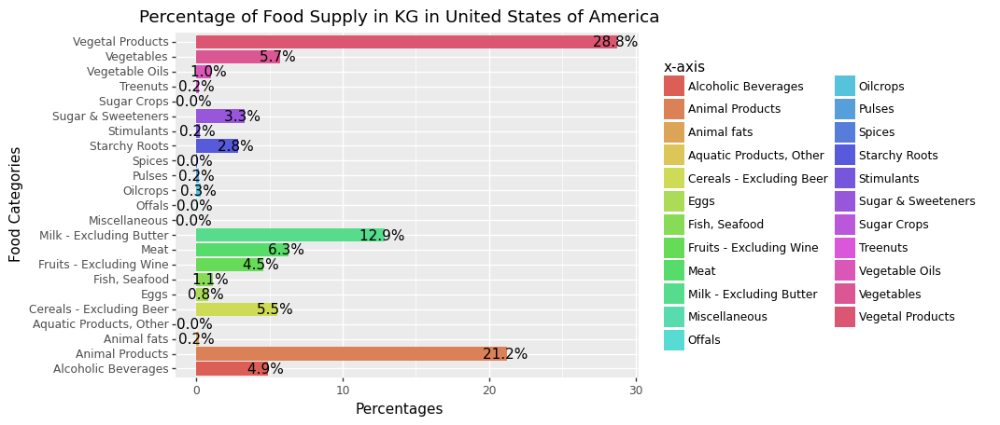

<ggplot: (8793499710952)>


In [ ]:
df_kg_c1_percentages_bar_chart = draw_bar_chart(df_kg_c1_percentages, df_c1_column_names, "Percentage of Food Supply in KG in "+c1)
df_kg_c2_percentages_bar_chart = draw_bar_chart(df_kg_c2_percentages, df_c2_column_names, "Percentage of Food Supply in KG in "+c2)
print(df_kg_c1_percentages_bar_chart)
print(df_kg_c2_percentages_bar_chart)

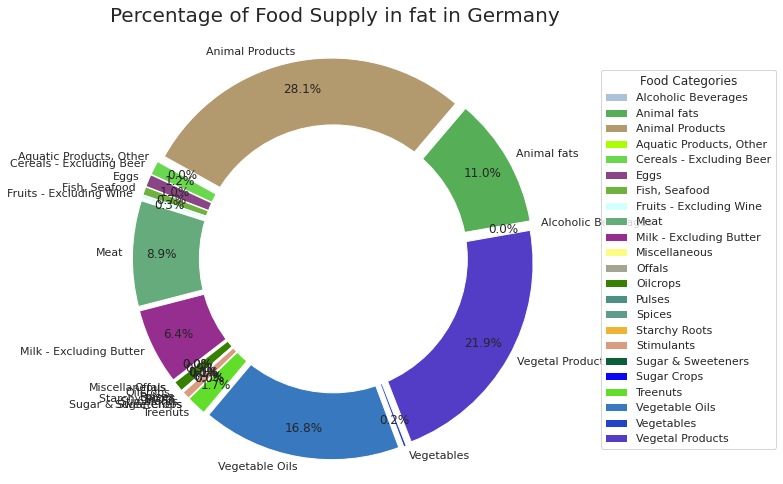

<Figure size 2160x2160 with 0 Axes>

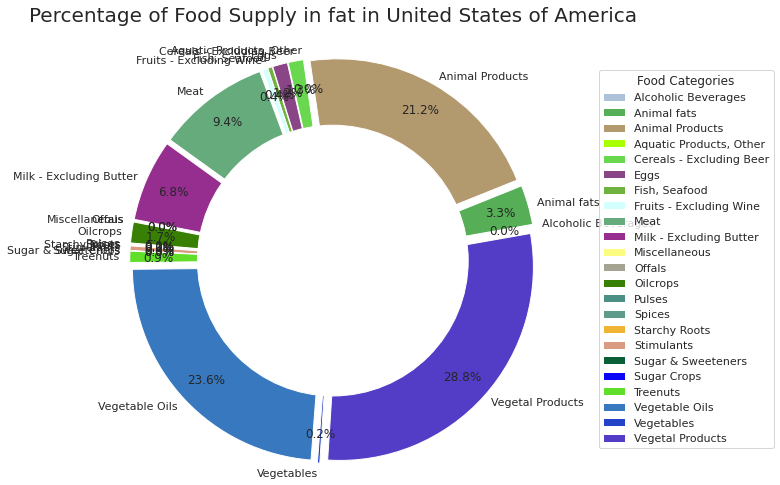

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_fat_c1_percentages_pie_chart = draw_pie_chart(df_fat_c1_percentages, df_c1_column_names, "Percentage of Food Supply in fat in "+c1)
df_fat_c2_percentages_pie_chart = draw_pie_chart(df_fat_c2_percentages, df_c2_column_names, "Percentage of Food Supply in fat in "+c2)

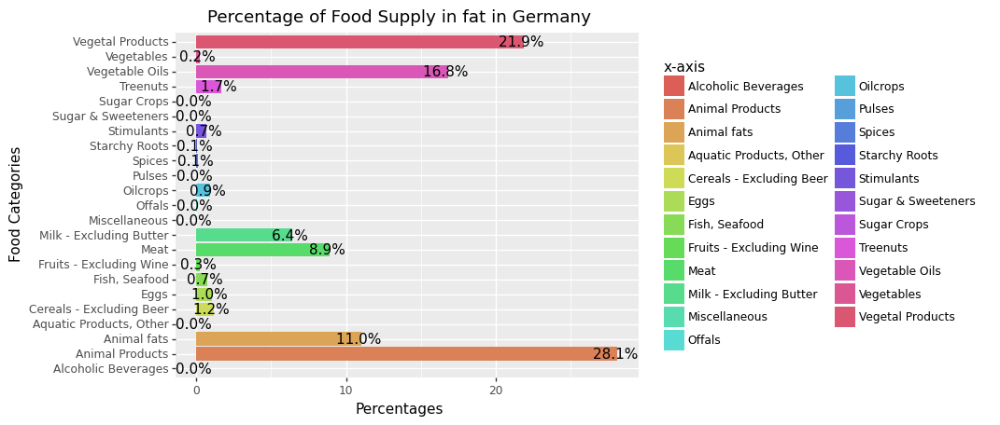

<ggplot: (8793499626020)>


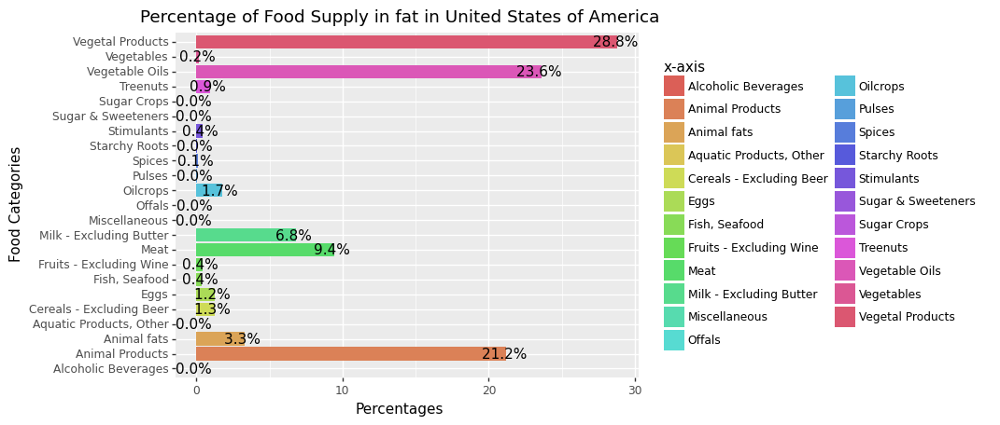

<ggplot: (-9223363243355058723)>


In [ ]:
df_fat_c1_percentages_bar_chart = draw_bar_chart(df_fat_c1_percentages, df_c1_column_names, "Percentage of Food Supply in fat in "+c1)
df_fat_c2_percentages_bar_chart = draw_bar_chart(df_fat_c2_percentages, df_c2_column_names, "Percentage of Food Supply in fat in "+c2)
print(df_fat_c1_percentages_bar_chart)
print(df_fat_c2_percentages_bar_chart)

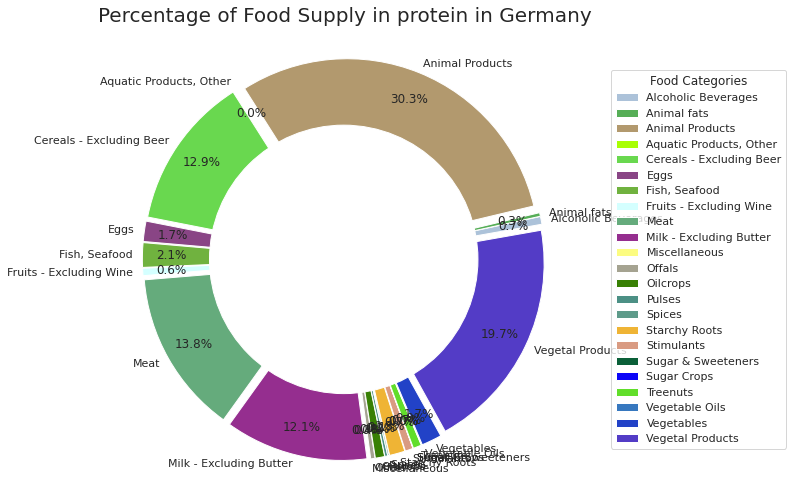

<Figure size 2160x2160 with 0 Axes>

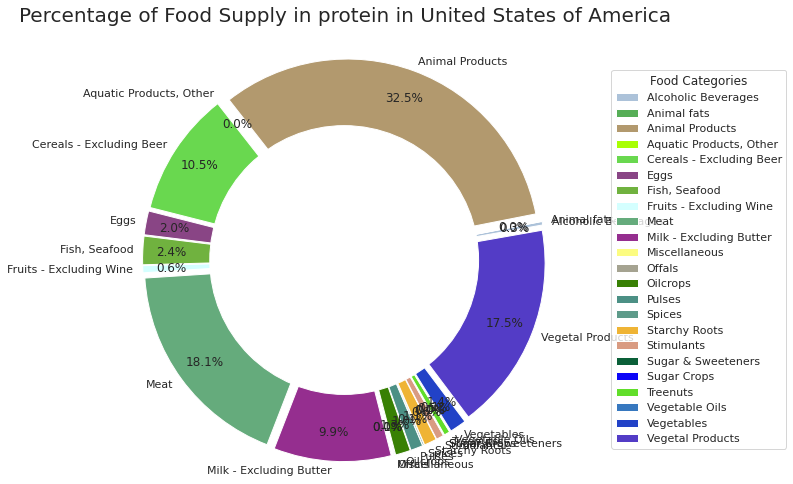

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_protein_c1_percentages_pie_chart = draw_pie_chart(df_protein_c1_percentages, df_c1_column_names, "Percentage of Food Supply in protein in "+c1)
df_protein_c2_percentages_pie_chart = draw_pie_chart(df_protein_c2_percentages, df_c2_column_names, "Percentage of Food Supply in protein in "+c2)

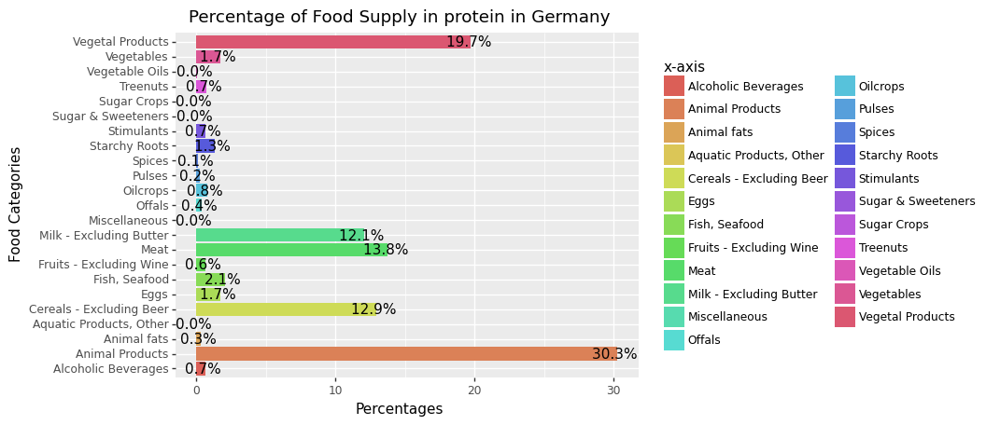

<ggplot: (8793499281584)>


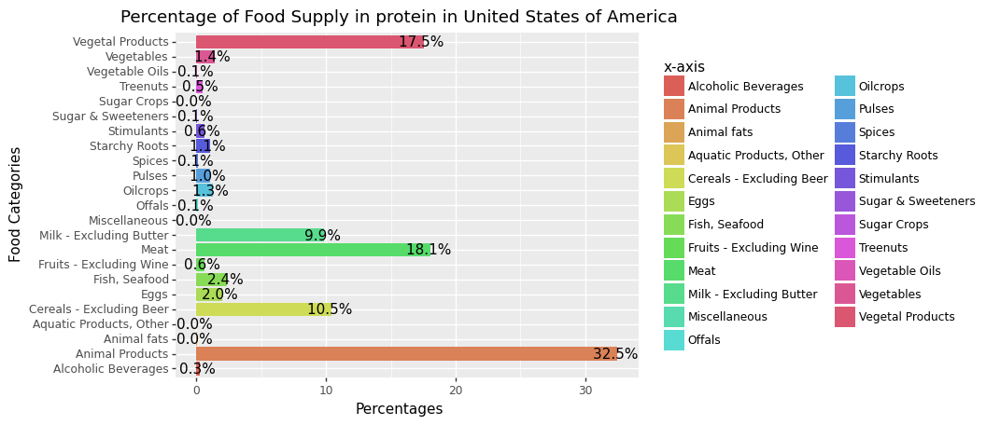

<ggplot: (-9223363243355177356)>


In [ ]:
df_protein_c1_percentages_bar_chart = draw_bar_chart(df_protein_c1_percentages, df_c1_column_names, "Percentage of Food Supply in protein in "+c1)
df_protein_c2_percentages_bar_chart = draw_bar_chart(df_protein_c2_percentages, df_c2_column_names, "Percentage of Food Supply in protein in "+c2)
print(df_protein_c1_percentages_bar_chart)
print(df_protein_c2_percentages_bar_chart)

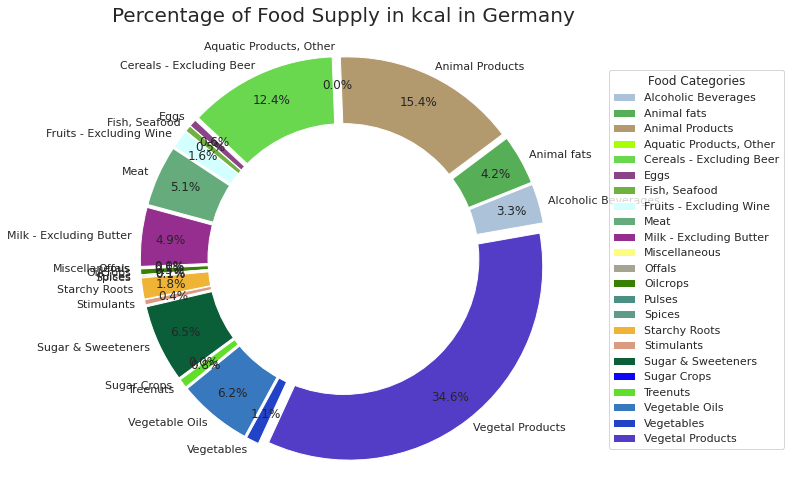

<Figure size 2160x2160 with 0 Axes>

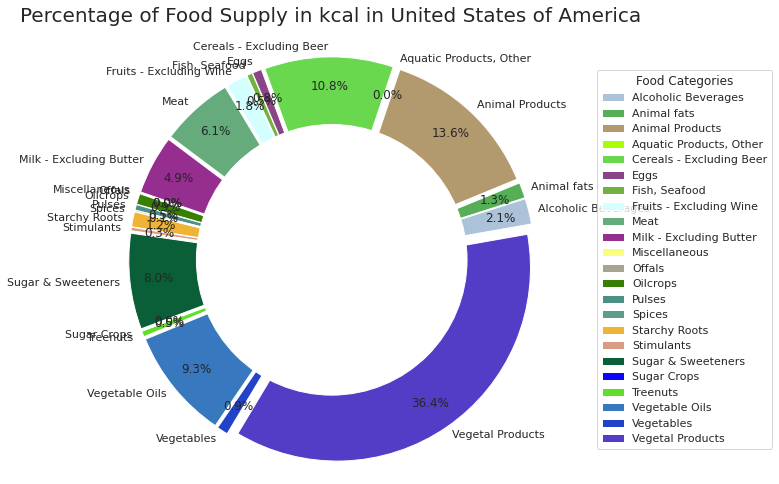

<Figure size 2160x2160 with 0 Axes>

In [ ]:
df_kcal_c1_percentages_pie_chart = draw_pie_chart(df_kcal_c1_percentages, df_c1_column_names, "Percentage of Food Supply in kcal in "+c1)
df_kcal_c2_percentages_pie_chart = draw_pie_chart(df_kcal_c2_percentages, df_c2_column_names, "Percentage of Food Supply in kcal in "+c2)

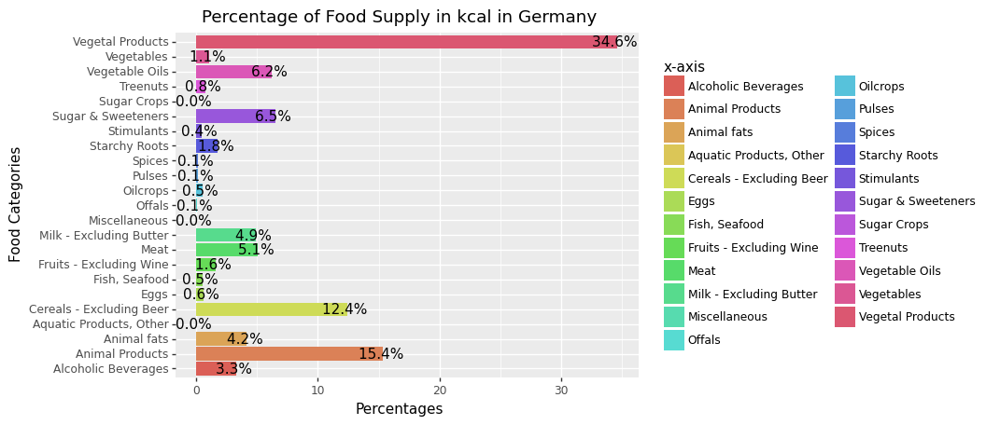

<ggplot: (-9223363243352043516)>


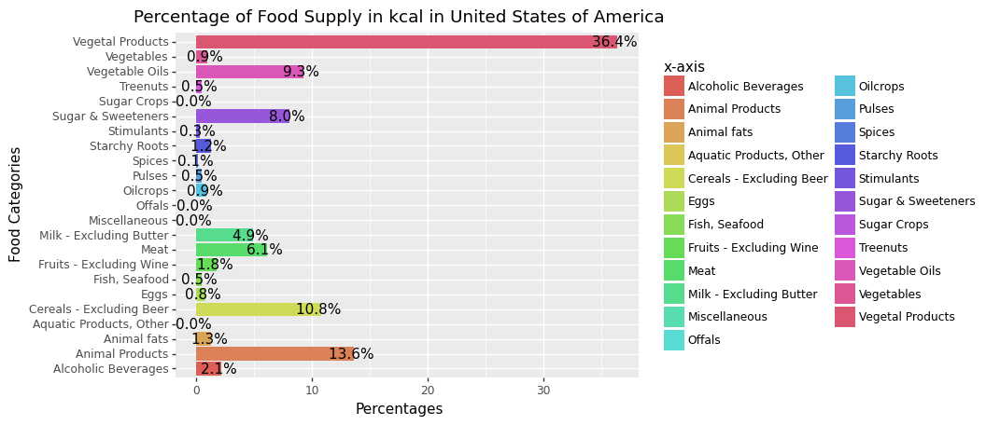

<ggplot: (8793499903545)>


In [ ]:
df_kcal_c1_percentages_bar_chart = draw_bar_chart(df_kcal_c1_percentages, df_c1_column_names, "Percentage of Food Supply in kcal in "+c1)
df_kcal_c2_percentages_bar_chart = draw_bar_chart(df_kcal_c2_percentages, df_c2_column_names, "Percentage of Food Supply in kcal in "+c2)
print(df_kcal_c1_percentages_bar_chart)
print(df_kcal_c2_percentages_bar_chart)

<p>The following table will describe about the top 5 most consumption sources for 4 different dataset for the countries Germany and United States of America. It will also show the recovery rate of those countries.</p>

<table style="border-collapse: collapse; border: 1px black solid;">
  <tbody>
   <tr style="border-collapse: collapse; border: 1px black solid;">
       <th>Country/Food Supply</th>
       <th>Food Supply in KG</th>
       <th>Food Supply in Fat</th>
       <th>Food Supply in Protein</th>
       <th>Food Supply in Kcal</th>
       <th>Recovery Rate</th>
   </tr>
    <tr style="border-collapse: collapse; border: 1px black solid;">
        <td>Germany</td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Animal Products</li>
            <li>Milk</li>
            <li> Alcoholic Beverages</li>
            <li>Cereals - Excluding Beer</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Animal Products</li>
            <li>Vegetal Products</li>
            <li>Vegetable Oils</li>
            <li>Animal Fats</li>
            <li>Meat</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Animal Products</li>
            <li>Vegetal Products</li>
            <li>Meat</li>
            <li>Cereals - Excluding Beers</li>
            <li>Milk</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Animal Products</li>
            <li>Cereals - Excluding Beer</li>
            <li>Sugar & Sweeteners</li>
            <li>Vegetable Oils</li>
        </ul>
        </td>
        <td>95.2%</td>
    </tr>
    <tr>
        <td>United States of America</td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Animal Products</li>
            <li>Milk</li>
            <li>Meat</li>
            <li>Vegetables</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Vegetable Oils</li>
            <li>Animal Products</li>
            <li>Meat</li>
            <li>Milk - Excluding Butter</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Animal Products</li>
            <li>Meat</li>
            <li>Vegetal Products</li>
            <li>Cereals - Excluding Butter</li>
            <li>Milk - Excluding Butter</li>
        </ul>
        </td>
        <td>
        <ul>
            <li>Vegetal Products</li>
            <li>Animal Products</li>
            <li>Cereals - Excluding Beer</li>
            <li>Vegetable Oils</li>
            <li>Sugar & Sweeteners</li>
        </ul>
        </td>
        <td>77.0%</td>
    </tr>
  </tbody>
</table>

In [ ]:
def correlation(df, title):
    sns.set(font_scale=1)
    # Compute the correlation matrix
    corr = df.corr()

    # Generate a mask for the upper triangle
    mask = np.triu(np.ones_like(corr, dtype=np.bool))

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=(11, 9))

    # Generate a custom diverging colormap
    # cmap = sns.diverging_palette(220, 10, as_cmap=True)
    cmap = sns.diverging_palette(20, 220, n=200)
    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, vmin=-1, center=0,
                square=True, linewidths=.5, cbar_kws={"shrink": .5})
    ax.set_title(title, pad=20, fontsize= 20)
#     ax.set_xticklabels(
#         ax.get_xticklabels(),
#         rotation=45,
#         horizontalalignment='right'
#     )

In [ ]:
def correlation_values(df, title):

    df_correlation = df.corr()
    cmap = sns.diverging_palette(20, 220, n=200)
    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=(11, 9))
    sns.heatmap(df_correlation[['Rec_Rate']].sort_values(by=['Rec_Rate'],ascending=False),
                vmin=-1,
                vmax=1, center=0,
                cmap=cmap,
                annot=True,linewidths=1.5, cbar_kws={"shrink": .5})
    ax.set_title(title, pad=20, fontsize= 20)

In [ ]:
df_kg_filtered = df_kg[df_kg["Country"].isin(["Saudi Arabia", "Russian Federation", "Chile", "Turkey", "Bangladesh",
                                              "South Africa", "Pakistan", "Germany", "India", "Peru", "Iran (Islamic Republic of)",
                                              "Brazil", "Mexico", "Italy", "Spain", "United States of America"])]

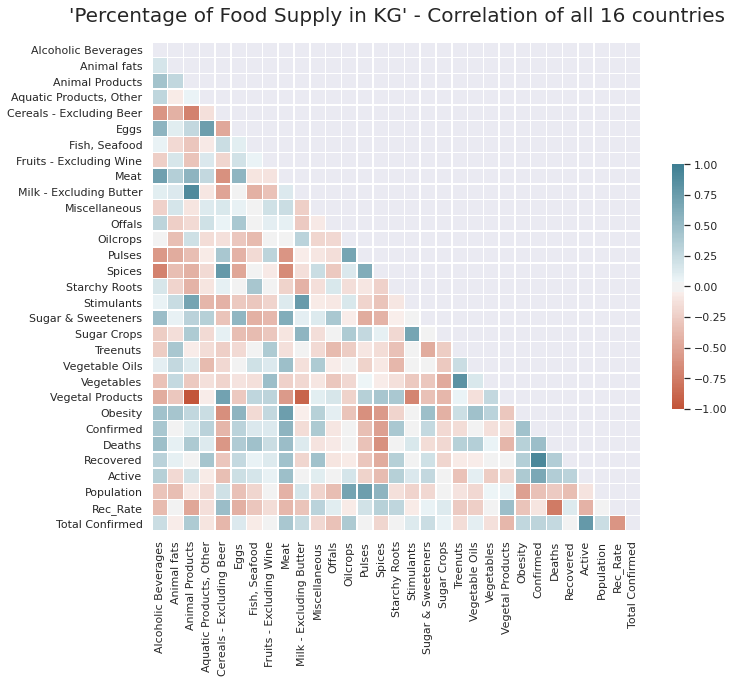

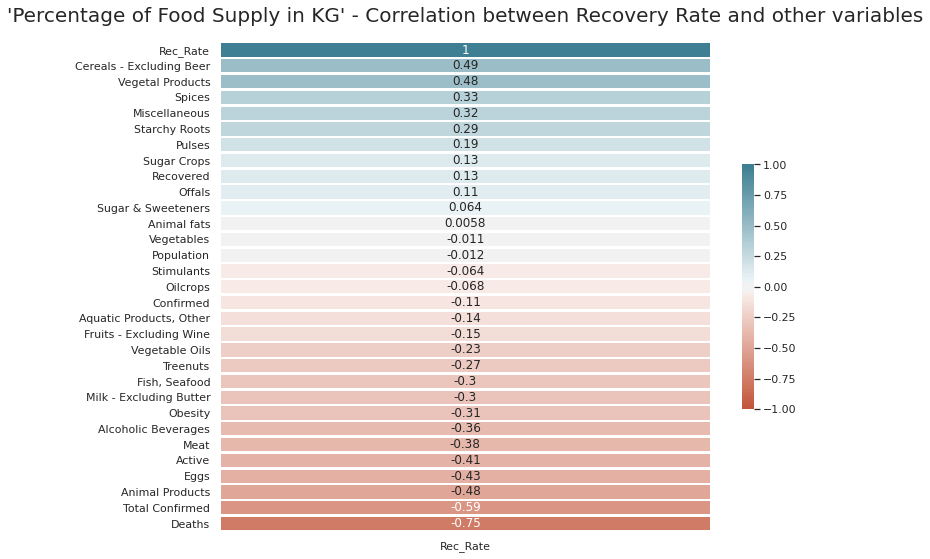

In [ ]:
correlation(df_kg_filtered, "'Percentage of Food Supply in KG' - Correlation of all 16 countries")

correlation_values(df_kg_filtered, "'Percentage of Food Supply in KG' - Correlation between Recovery Rate and other variables")


<p> We have plotted a correlation table for the 16 countries that we have considered for this EDA. In this table correlations, all of the features of a dataset are being used against the recovery rate that we have calculated for each country to see if there is any significant relationship between them. We did this for all of the four datasets in order to see how it varies with respect to the type of food supply.<br />
<br />
We observed that for the dataset, "Food Supply in KG", there are  features such as "Cereals - Excluding Beer", "Vegetal Products" that have moderately high postive correlation with "Rec_Rate".<br />
<br />
We also noticed low positive correlations between features like "Spices", "Starchy Roots" with "Rec_Rate".<br />
<br />
On the other hand, we found features like "Animal Products", "Eggs" etc. showed moderately high negative correlation with "Rec_Rate".<br />
<br />
The is also a good numbers of features that showed low negative correlation with "Rec_Rate". "Meat", "Alcoholic Beverages", "Milk - Excluding Butter", "Fish, Seafood" are few of them.

In [ ]:
df_fat_filtered = df_fat[df_fat["Country"].isin(["Saudi Arabia", "Russian Federation", "Chile", "Turkey", "Bangladesh",
                                              "South Africa", "Pakistan", "Germany", "India", "Peru"   , "Iran (Islamic Republic of)",
                                              "Brazil", "Mexico", "Italy", "Spain", "United States of America"])]

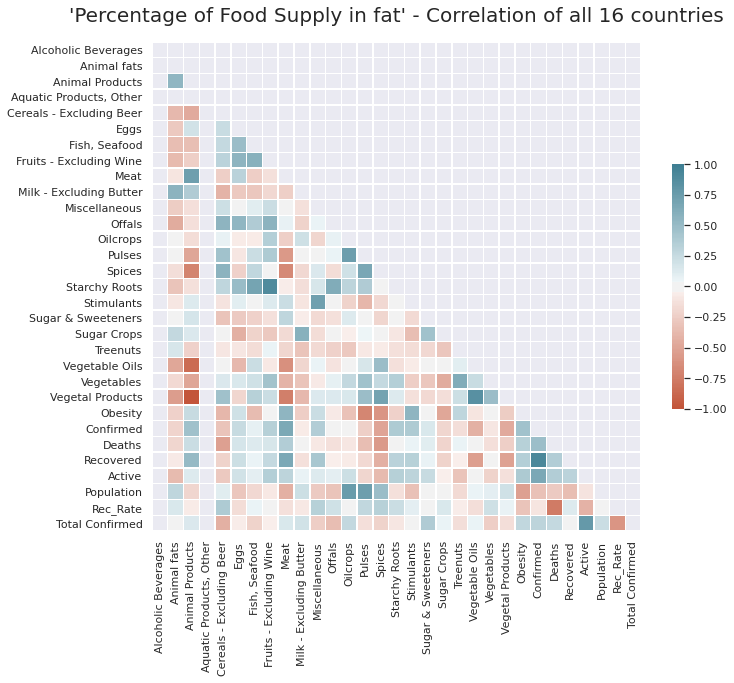

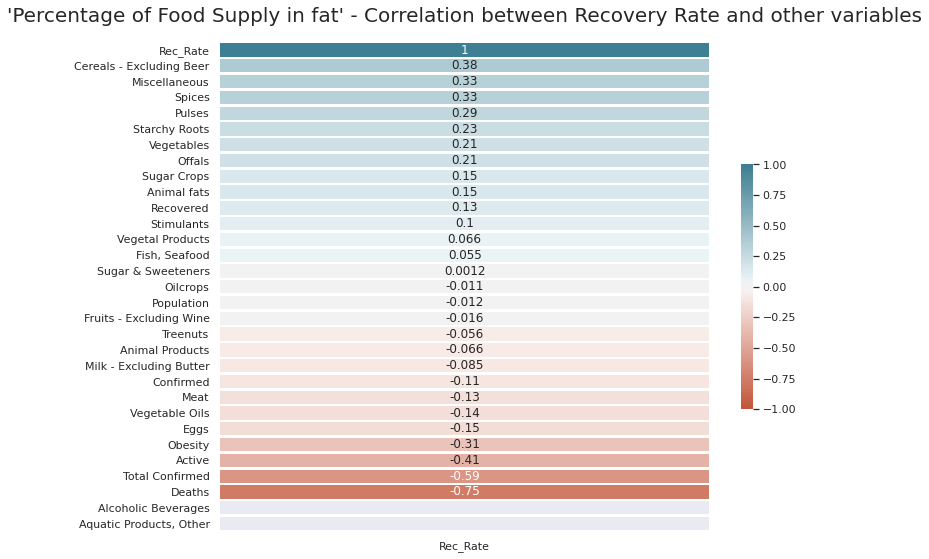

In [ ]:
correlation(df_fat_filtered, "'Percentage of Food Supply in fat' - Correlation of all 16 countries")

correlation_values(df_fat_filtered, "'Percentage of Food Supply in fat' - Correlation between Recovery Rate and other variables")

<p> We have plotted a correlation table for the 16 countries that we have considered for this EDA. In this table correlations, all of the features of a dataset are being used against the recovery rate that we have calculated for each country to see if there is any significant relationship between them. We did this for all of the four datasets in order to see how it varies with respect to the type of food supply. <br />
<br />
We observed that for the dataset, "Food Supply in Fat", there are no features that has high or moderately high positive/negative correlation with "Rec_Rate". However, there are features such as "Cereals - Excluding Beer", "Spices" and "Pulses" that showed low postive correlation with "Rec_Rate".<br />
<br />
On the other hand, we found negligible negative correlation between features like "Vegtable Oils", "Eggs", "Meat" etc. with "Rec_Rate".<br />
<br />
Another interesting fact that we discovered while dealing with the dataset of "Food Supply in Fat" is that "Alcoholic Beverages" and "Aquatic Products, Other" showed no correlation with "Rec_Rate".

In [ ]:
df_kcal_filtered = df_kcal[df_kcal["Country"].isin(["Saudi Arabia", "Russian Federation", "Chile", "Turkey", "Bangladesh",
                                              "South Africa", "Pakistan", "Germany", "India", "Peru", "Iran (Islamic Republic of)",
                                              "Brazil", "Mexico", "Italy", "Spain", "United States of America"])]

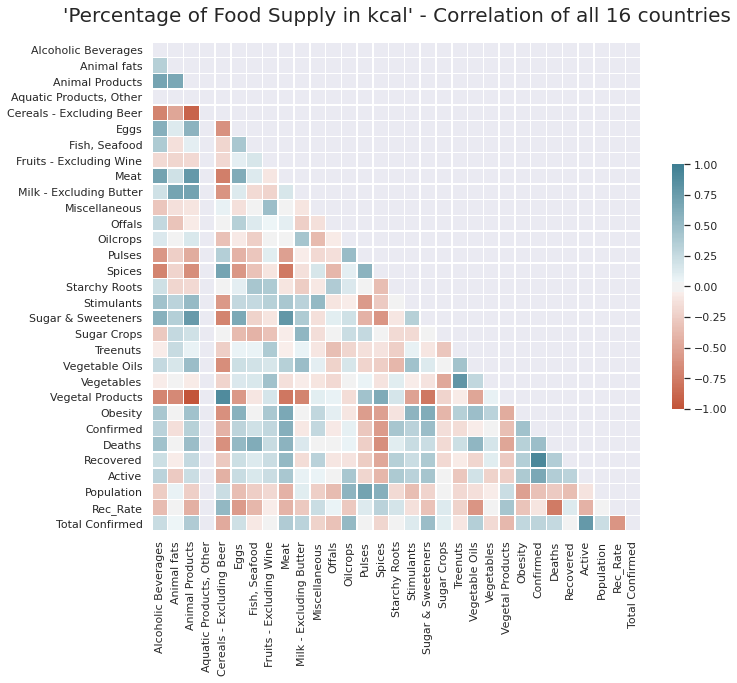

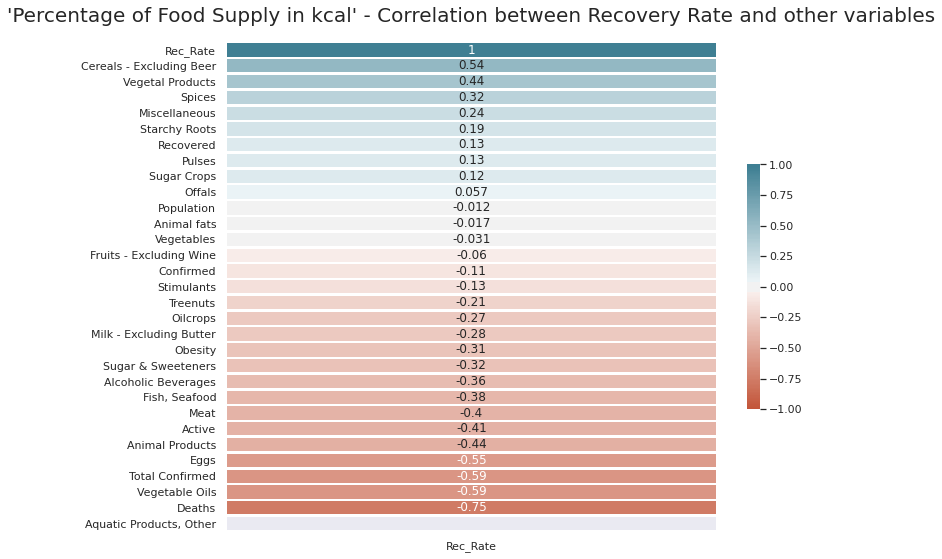

In [ ]:
correlation(df_kcal_filtered, "'Percentage of Food Supply in kcal' - Correlation of all 16 countries")

correlation_values(df_kcal_filtered, "'Percentage of Food Supply in kcal' - Correlation between Recovery Rate and other variables")

<p> We have plotted a correlation table for the 16 countries that we have considered for this EDA. In this table correlations, all of the features of a dataset are being used against the recovery rate that we have calculated for each country to see if there is any significant relationship between them. We did this for all of the four datasets in order to see how it varies with respect to the type of food supply.<br />
<br />
We observed that for the dataset, "Food Supply in Kcal", there are  features such as "Cereals - Excluding Beer", "Vegetal Products" that have moderately high postive correlation with "Rec_Rate".<br />
<br />
We also noticed low positive correlations between features like "Spices" with "Rec_Rate".<br />
<br />
On the other hand, we found features like "Vegetable Oils", "Eggs", "Animal Products" etc. showed moderately high negative correlation with "Rec_Rate".<br />
<br />
The is also a good numbers of features that showed low negative correlation with "Rec_Rate". "Sugar & Sweeteners", "Milk - Excluding Butter" are few of them.<br />
<br />
We also get to know about the fact that "Aquatic Products, Other" showed no influence on "Rec_Rate" in "Food Supply in Kcal" dataset.

In [ ]:
df_protein_filtered = df_protein[df_protein["Country"].isin(["Saudi Arabia", "Russian Federation", "Chile", "Turkey", "Bangladesh",
                                              "South Africa", "Pakistan", "Germany", "India", "Peru", "Iran (Islamic Republic of)",
                                              "Brazil", "Mexico", "Italy", "Spain", "United States of America"])]

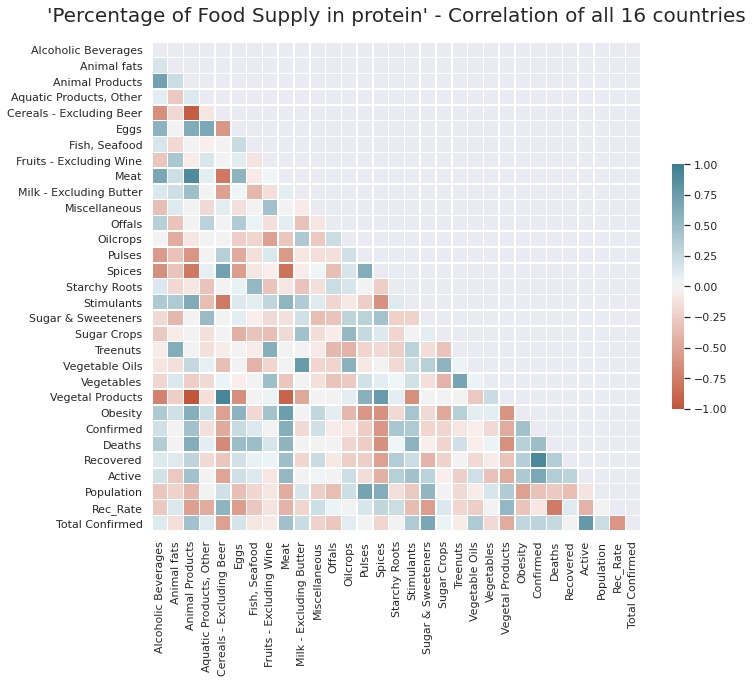

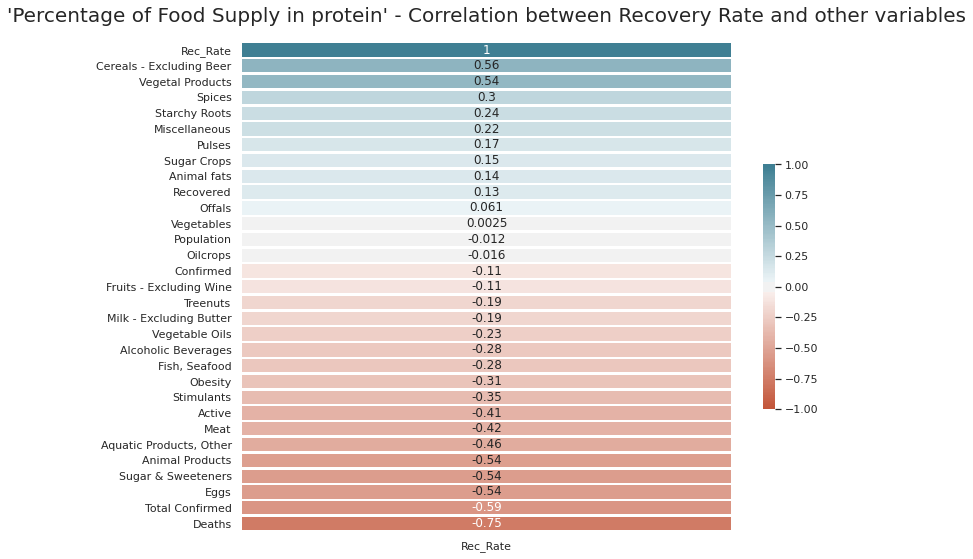

In [ ]:
correlation(df_protein_filtered, "'Percentage of Food Supply in protein' - Correlation of all 16 countries")

correlation_values(df_protein_filtered, "'Percentage of Food Supply in protein' - Correlation between Recovery Rate and other variables")

<p> We have plotted a correlation table for the 16 countries that we have considered for this EDA. In this table correlations, all of the features of a dataset are being used against the recovery rate that we have calculated for each country to see if there is any significant relationship between them. We did this for all of the four datasets in order to see how it varies with respect to the type of food supply.<br />
<br />
We observed that for the dataset, "Food Supply in Protein", there are  features such as "Cereals - Excluding Beer", "Vegetal Products" that have moderately high postive correlation with "Rec_Rate".<br />
<br />
We also noticed a low positive correlation between features like "Spices", "Starchy Roots" with "Rec_Rate".<br />
<br />
On the other hand, we found features like "Eggs", "Sugar & Sweeteners", "Animal Products", "Aquatic Products, Other", "Meat" etc. showed moderately high negative correlation with "Rec_Rate".<br />
<br />
The is also a good numbers of features that showed low negative correlation with "Rec_Rate". "Fish, Seafood", "Alcoholic Beverages", "Vegetable Oils" are few of them.